# **Time Series Forecasting Project - 1**

**Context**

As an analyst at ABC Estate Wines, we are presented with historical data encompassing the sales of different types of wines throughout the 20th century. These datasets originate from the same company but represent sales figures for distinct wine varieties. Our objective is to delve into the data, analyze trends, patterns, and factors influencing wine sales over the course of the century. By leveraging data analytics and forecasting techniques, we aim to gain actionable insights that can inform strategic decision-making and optimize sales strategies for the future.

---

**Objective**

The primary objective of this project is to analyze and forecast wine sales trends for the 20th century based on historical data provided by ABC Estate Wines. We aim to equip ABC Estate Wines with the necessary insights and foresight to enhance sales performance, capitalize on emerging market opportunities, and maintain a competitive edge in the wine industry.

In [200]:
!pip install pmdarima

In [201]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Command to tell Python to actually display the graphs
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.linear_model import LinearRegression
from sklearn import metrics
import statsmodels.api as sm
from  IPython.display import display
from  pylab import rcParams
import statsmodels.tools.eval_measures as em
from sklearn.metrics import  mean_squared_error
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

from statsmodels.tsa.arima.model import ARIMA

import statsmodels.api as sm

import pmdarima as pm
from pmdarima import model_selection

import itertools

#### Load the data into DataFrame

In [202]:
df = pd.read_csv('Rose.csv',parse_dates=True,index_col='YearMonth')

## Define the problem and perform Exploratory Data Analysis

##### Check the Shape of Data

In [203]:
df.shape

(187, 1)

#### Check the data type and columns details

In [204]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Rose    185 non-null    float64
dtypes: float64(1)
memory usage: 2.9 KB


#### Check the Top 5 and Last 5 rows details.

In [205]:
print('Top 5 Rows in dataset \n', df.head(),'\n')
print('Last 5 Rows in dataset \n', df.tail())

Top 5 Rows in dataset 
              Rose
YearMonth        
1980-01-01  112.0
1980-02-01  118.0
1980-03-01  129.0
1980-04-01   99.0
1980-05-01  116.0 

Last 5 Rows in dataset 
             Rose
YearMonth       
1995-03-01  45.0
1995-04-01  52.0
1995-05-01  28.0
1995-06-01  40.0
1995-07-01  62.0


#### Plot the graph

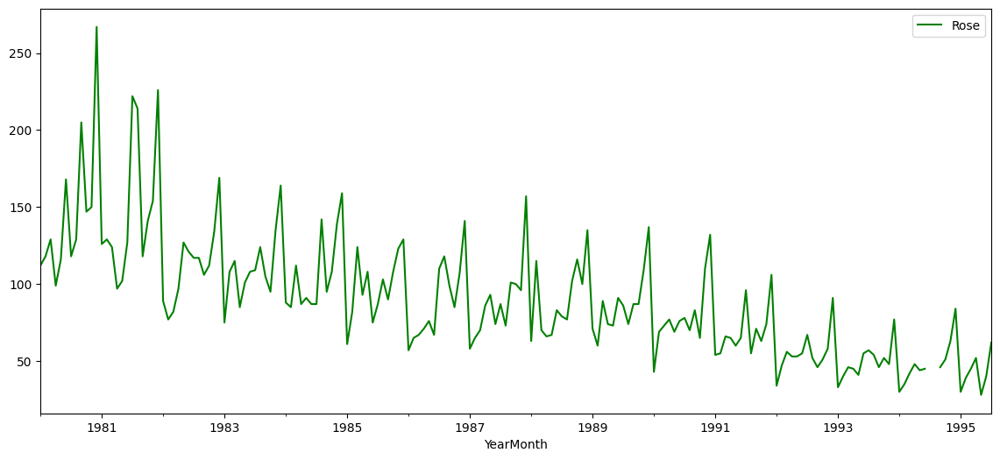

In [206]:
rcParams['figure.figsize'] = 14,6
df.plot(color='green')
plt.show()

Plot a boxplot to understand the spread of sales across different years and within different months across years.

#### Yearly Boxplot

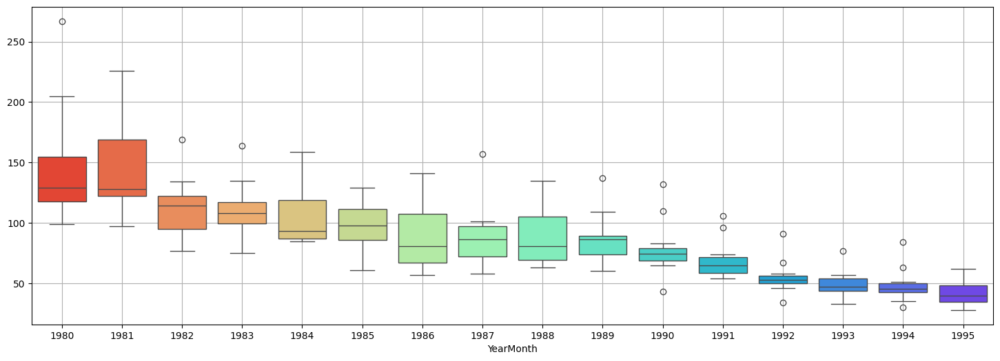

In [207]:
_, ax = plt.subplots(figsize=(18,6))
sns.boxplot(x = df.index.year,y = df.values[:,0],ax=ax, palette='rainbow_r')
plt.grid();
plt.show();

#### Monthly Boxplot

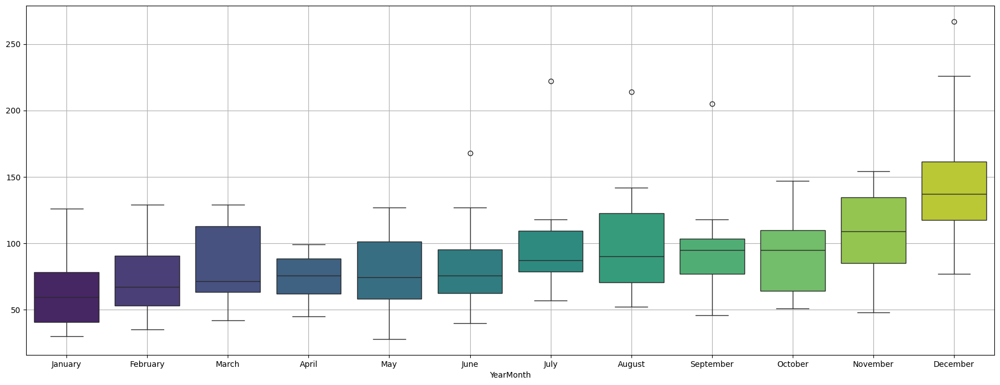

In [208]:
_, ax = plt.subplots(figsize=(22,8))
sns.boxplot(x = df.index.month_name(),y = df.values[:,0],ax=ax, palette='viridis')
plt.grid();

#### Convert into Date and Month

In [209]:
df['Month'] = df.index.month
df['Year'] = df.index.year
df.head()

,Rose,Month,Year
YearMonth,,,
1980-01-01,112.0,1,1980
1980-02-01,118.0,2,1980
1980-03-01,129.0,3,1980
1980-04-01,99.0,4,1980
1980-05-01,116.0,5,1980


##### Rename the Column Name

In [210]:
df.columns=['Sales','Month', 'Year']
df.head()

,Sales,Month,Year
YearMonth,,,
1980-01-01,112.0,1,1980
1980-02-01,118.0,2,1980
1980-03-01,129.0,3,1980
1980-04-01,99.0,4,1980
1980-05-01,116.0,5,1980


##### Check the Missing Value

In [211]:
df[df['Sales'].isna()]

,Sales,Month,Year
YearMonth,,,
1994-07-01,NaN,7,1994
1994-08-01,NaN,8,1994


#### Impute the Missing value with Mean

In [212]:
df.loc['1994-07-01', 'Sales']=np.mean(df[df.Month==7]['1993-07-01':'1995-07-01']['Sales'])
df.loc['1994-07-01', 'Sales']

59.5

In [213]:
df.loc['1994-08-01', 'Sales'] = np.mean(df[df.Month==8]['1993-08-01':'1995-08-01']['Sales'])
df.loc['1994-08-01', 'Sales']

54.0

#### Check The Null value after Treatment

In [214]:
df.isna().sum()

,0
Sales,0
Month,0
Year,0


#### Plot the Data after Treating

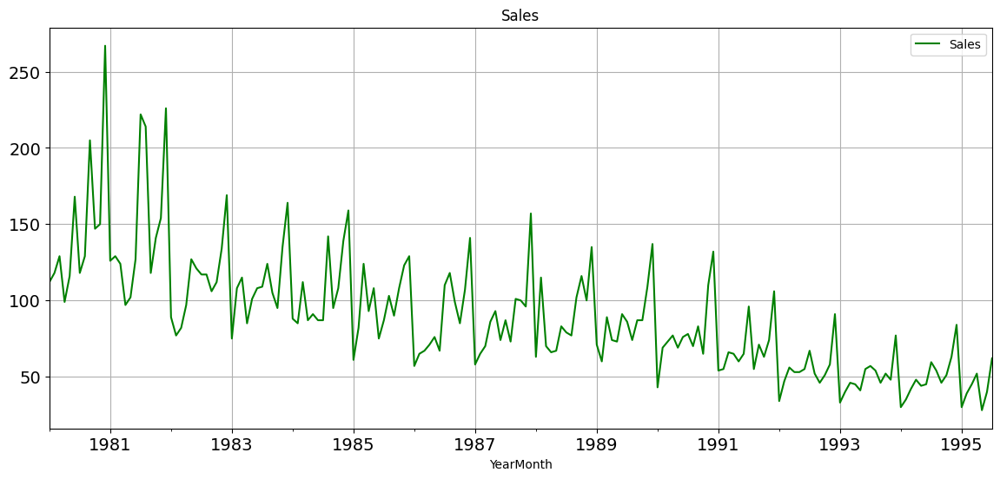

In [215]:
df['Sales'].plot(color='green', figsize=(14,6), grid=True, title='Sales', fontsize=14, legend=True)
plt.show()

#### Plot the Time Series according to different Months for Different Years

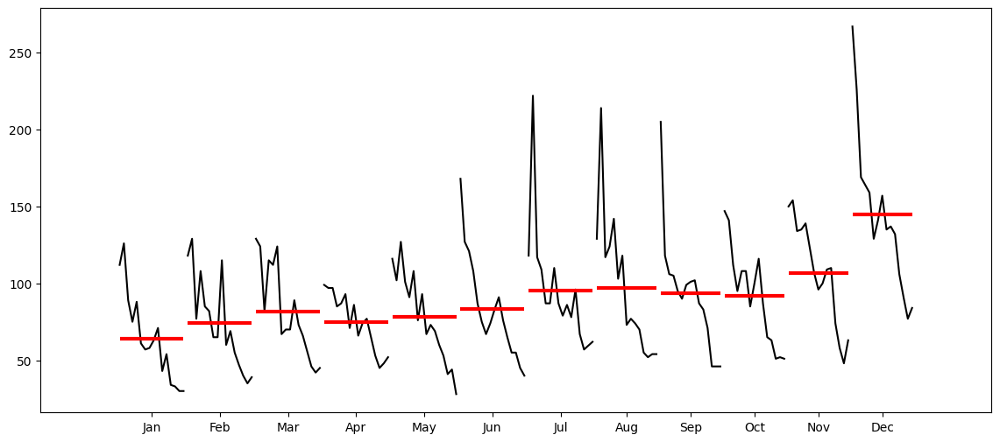

In [216]:
from statsmodels.graphics.tsaplots import month_plot

fig, ax = plt.subplots(figsize=(14,6))
month_plot(df['Sales'], ax=ax)
plt.show()

In [217]:
fig = px.line(df, x=df.index, y='Sales', title='Monthly Sales Data',
              labels={'Date': 'Month', 'Sales': 'Sales'},
              markers=True, color_discrete_sequence=['green'])

# Update layout for better presentation
fig.update_layout(xaxis_title='Month', yaxis_title='Sales')

# Show the interactive plot
fig.show()

#### Graph of Monthly Sales across Years.

In [218]:
# Make the Pivot Table
monthly_sales_across_years = pd.pivot_table(df, values='Sales', columns=df.index.month_name(), index=df.index.year)

# Sort Columns by Month Order
monthly_sales_across_years = monthly_sales_across_years[['January', 'February', 'March', 'April', 'May', 'June',
     'July', 'August', 'September', 'October', 'November', 'December']]

# Convert Pivot Table to Long format for Plotly
monthly_sales_across_years_long = monthly_sales_across_years.reset_index().melt(id_vars='YearMonth',
                                                                                var_name='Month', value_name='Sales')
monthly_sales_across_years_long.rename(columns={'Year': 'Year'}, inplace=True)

# Create interactive line plot using Plotly
fig = px.line(monthly_sales_across_years_long, x='YearMonth', y='Sales', color='Month',
              title='Monthly Sales Across Years', labels={'Sales': 'Sales', 'Year': 'Year'})

# Update the Layout for better Visualization
fig.update_layout( legend_title_text='Month', xaxis_title='Year', yaxis_title='Sales', template='plotly_dark',
    title_font=dict(size=24, family='Arial'), font=dict(size=16))

# Adjust the figure size
fig.update_layout(autosize=False, width=1200, height=600)

# Show the plot
fig.show();

#### Perform Decomposition

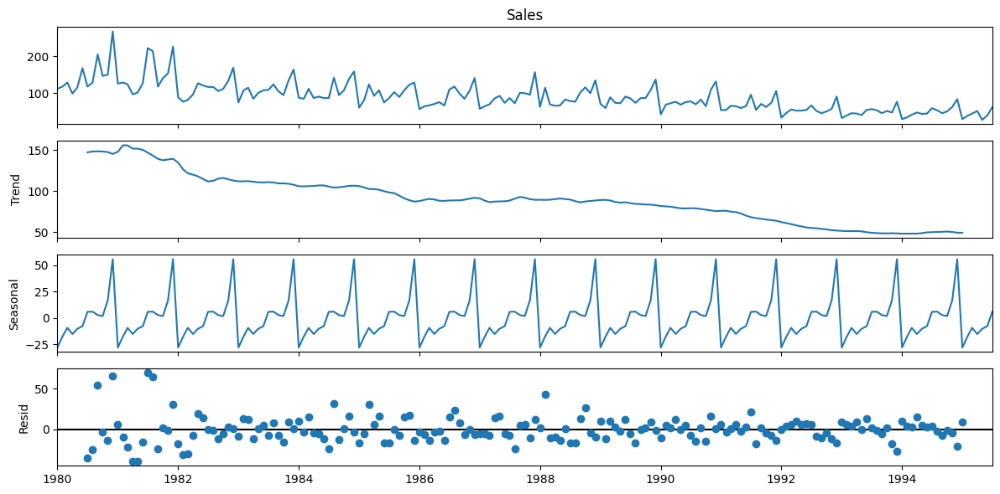

In [219]:
from statsmodels.tsa.seasonal import seasonal_decompose
rcParams['figure.figsize'] = 12,6
decompostion = seasonal_decompose(df['Sales'], model='additive')
decompostion.plot()
plt.show()

In [220]:
trend = decompostion.trend
seasonality = decompostion.seasonal
residual = decompostion.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 YearMonth
1980-01-01           NaN
1980-02-01           NaN
1980-03-01           NaN
1980-04-01           NaN
1980-05-01           NaN
1980-06-01           NaN
1980-07-01    147.083333
1980-08-01    148.125000
1980-09-01    148.375000
1980-10-01    148.083333
1980-11-01    147.416667
1980-12-01    145.125000
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01   -28.031994
1980-02-01   -17.543105
1980-03-01    -9.418105
1980-04-01   -15.230605
1980-05-01   -10.328819
1980-06-01    -7.810962
1980-07-01     5.718006
1980-08-01     5.931895
1980-09-01     2.651339
1980-10-01     1.748562
1980-11-01    16.723562
1980-12-01    55.590228
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01          NaN
1980-02-01          NaN
1980-03-01          NaN
1980-04-01          NaN
1980-05-01          NaN
1980-06-01          NaN
1980-07-01   -34.801339
1980-08-01   -25.056895
1980-09-01    53.973661
1980-10-01    -2.831895
1980-11-01   -14.140228
1980-12-01    66.28477

In [221]:
deaseasonalized_ts = trend + residual
deaseasonalized_ts.round(2).head(12)

,0
YearMonth,
1980-01-01,NaN
1980-02-01,NaN
1980-03-01,NaN
1980-04-01,NaN
1980-05-01,NaN
1980-06-01,NaN
1980-07-01,112.28
1980-08-01,123.07
1980-09-01,202.35


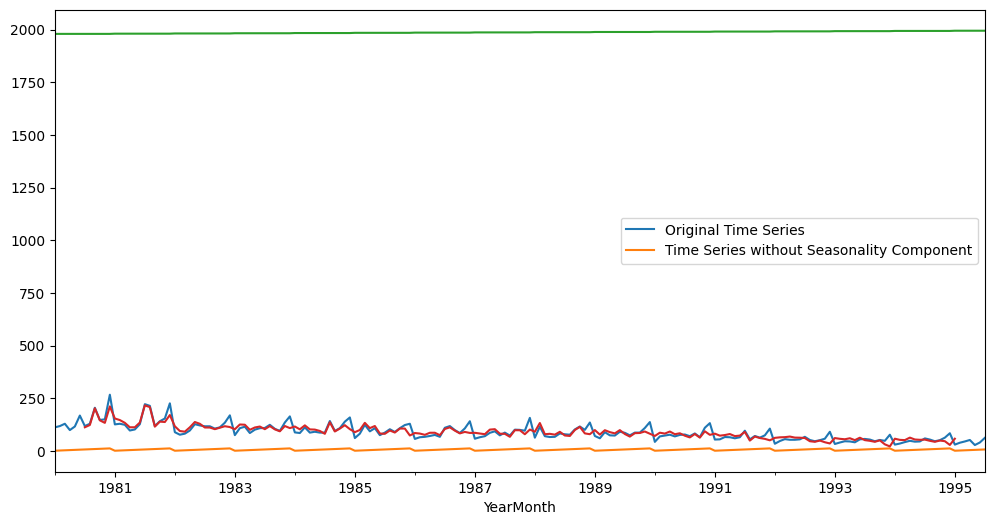

In [222]:
df.plot()
deaseasonalized_ts.plot()
plt.legend(["Original Time Series", "Time Series without Seasonality Component"]);

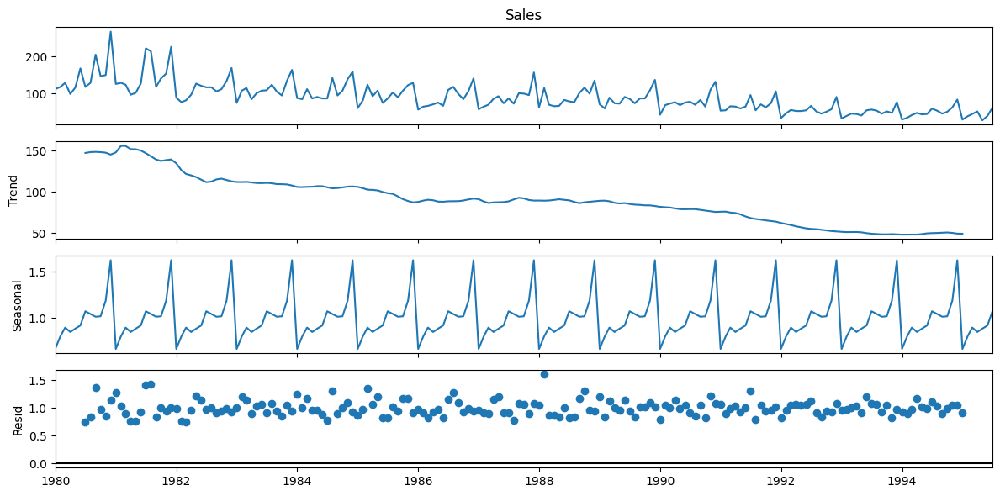

In [223]:
result_multiplicative = seasonal_decompose(df['Sales'], model='multiplicative', period=12)
result_multiplicative.plot()
plt.show()

In [224]:
trend = result_multiplicative.trend
seasonality = result_multiplicative.seasonal
residual = result_multiplicative.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 YearMonth
1980-01-01           NaN
1980-02-01           NaN
1980-03-01           NaN
1980-04-01           NaN
1980-05-01           NaN
1980-06-01           NaN
1980-07-01    147.083333
1980-08-01    148.125000
1980-09-01    148.375000
1980-10-01    148.083333
1980-11-01    147.416667
1980-12-01    145.125000
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    0.668577
1980-02-01    0.804550
1980-03-01    0.898744
1980-04-01    0.851237
1980-05-01    0.886934
1980-06-01    0.921546
1980-07-01    1.074644
1980-08-01    1.044683
1980-09-01    1.015406
1980-10-01    1.020108
1980-11-01    1.189232
1980-12-01    1.624338
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01         NaN
1980-02-01         NaN
1980-03-01         NaN
1980-04-01         NaN
1980-05-01         NaN
1980-06-01         NaN
1980-07-01    0.746542
1980-08-01    0.833636
1980-09-01    1.360672
1980-10-01    0.973117
1980-11-01    0.855614
1980-12-01    1.132642
Name: resid, dtype: fl

Multiplicative Model is selected owing to a more stable residual plot and lower range of residuals.

#### Drop the 'Year' and 'Month' Columns

In [225]:
df.drop(columns=['Month', 'Year'], inplace=True)

In [226]:
df.head(2)

,Sales
YearMonth,
1980-01-01,112.0
1980-02-01,118.0


## Data Pre-processing

#### Split the data into Training and Test

In [227]:
# Split the data into training and testing sets
train = df[df.index < '1991']
test = df[df.index >= '1991']

print('Shape of Training Data (Rows, Columns) is  :', train.shape)
print('Shape of Test Data (Rows, Columns) is :', test.shape)

Shape of Training Data (Rows, Columns) is  : (132, 1)
Shape of Test Data (Rows, Columns) is : (55, 1)


In [228]:
print('First few rows of Training Data','\n',train.head(),'\n')
print('Last few rows of Training Data','\n',train.tail(),'\n')
print('First few rows of Test Data','\n',test.head(),'\n')
print('Last few rows of Test Data','\n',test.tail(),'\n')

First few rows of Training Data 
             Sales
YearMonth        
1980-01-01  112.0
1980-02-01  118.0
1980-03-01  129.0
1980-04-01   99.0
1980-05-01  116.0 

Last few rows of Training Data 
             Sales
YearMonth        
1990-08-01   70.0
1990-09-01   83.0
1990-10-01   65.0
1990-11-01  110.0
1990-12-01  132.0 

First few rows of Test Data 
             Sales
YearMonth        
1991-01-01   54.0
1991-02-01   55.0
1991-03-01   66.0
1991-04-01   65.0
1991-05-01   60.0 

Last few rows of Test Data 
             Sales
YearMonth        
1995-03-01   45.0
1995-04-01   52.0
1995-05-01   28.0
1995-06-01   40.0
1995-07-01   62.0 



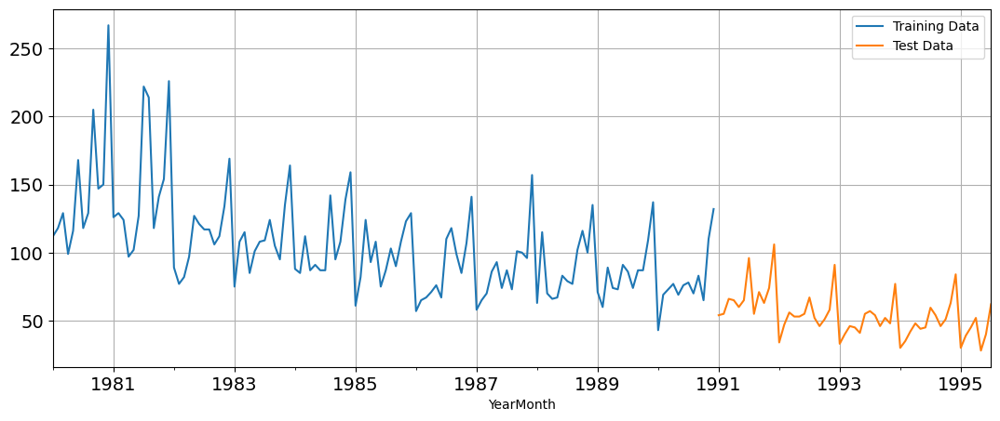

In [229]:
train['Sales'].plot(figsize=(13,5), fontsize=14)
test['Sales'].plot(figsize=(13,5), fontsize=14)
plt.grid()
plt.legend(['Training Data','Test Data'])
plt.show()

Note: It is difficult to predict the future observations if such an instance has not happened in the past. From our train-test split we are predicting likewise behaviour as compared to the past years.

## Model Building And Check the Performance of the Models Built

### Build Forecasting Models

*   Model 1: Linear Regression
*   Model 2: Simple Average
*   Model 3: Moving Average(MA)
*   Model 4: Simple Exponential Smoothing
*   Model 5: Double Exponential Smoothing (Holt's Model)
*   Model 6: Triple Exponential Smoothing (Holt - Winter's Model)

#### Model 1: Linear Regression

For this particular linear regression, we are going to regress the 'Sales' variable against the order of the occurrence. For this we need to modify our training data before fitting it into a linear regression.

In [230]:
train_time = [i+1 for i in range(len(train))]
test_time = [i+133 for i in range(len(test))]
print('Training Time instance','\n',train_time,'\n')
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132] 

Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


We see that we have successfully the generated the numerical time instance order for both the training and test set. Now we will add these values in the training and test set.

In [231]:
LinearRegression_train = train.copy()
LinearRegression_test = test.copy()

In [232]:
LinearRegression_train['time'] = train_time
LinearRegression_test['time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Sales  time
YearMonth              
1980-01-01  112.0     1
1980-02-01  118.0     2
1980-03-01  129.0     3
1980-04-01   99.0     4
1980-05-01  116.0     5 

Last few rows of Training Data 
             Sales  time
YearMonth              
1990-08-01   70.0   128
1990-09-01   83.0   129
1990-10-01   65.0   130
1990-11-01  110.0   131
1990-12-01  132.0   132 

First few rows of Test Data 
             Sales  time
YearMonth              
1991-01-01   54.0   133
1991-02-01   55.0   134
1991-03-01   66.0   135
1991-04-01   65.0   136
1991-05-01   60.0   137 

Last few rows of Test Data 
             Sales  time
YearMonth              
1995-03-01   45.0   183
1995-04-01   52.0   184
1995-05-01   28.0   185
1995-06-01   40.0   186
1995-07-01   62.0   187 



Now that our training and test data has been modified, let us go ahead use  **Linear Regression**  to build the model on the training data and test the model on the test data.

In [233]:
from sklearn.linear_model import LinearRegression

In [234]:
lr = LinearRegression()

In [235]:
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Sales'].values)

LinearRegression()

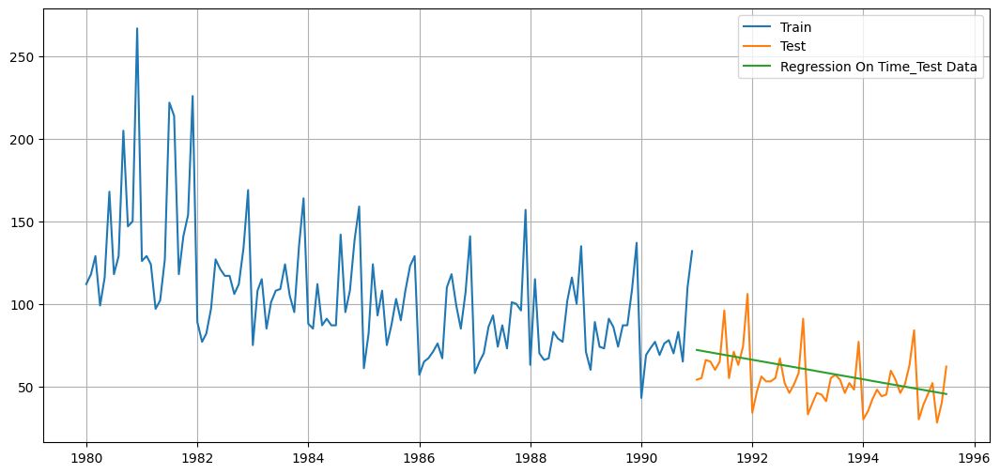

In [236]:
test_predictions_model1  = lr.predict(LinearRegression_test[['time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

plt.figure(figsize=(13,6))
plt.plot( train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time_Test Data')
plt.legend(loc='best')
plt.grid();

#### Defining the accuracy metrics.

In [237]:
from sklearn import metrics

#### Model Evaluation

In [238]:
## Test Data - RMSE

rmse_model1_test = metrics.mean_squared_error(test['Sales'],test_predictions_model1,squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.2f" %(rmse_model1_test))

For RegressionOnTime forecast on the Test Data,  RMSE is 15.28


In [239]:
resultsDf = pd.DataFrame({'Test RMSE': [rmse_model1_test]},index=['RegressionOnTime'])
resultsDf

,Test RMSE
RegressionOnTime,15.278158


#### Model 2: Simple Average

In [240]:
SimpleAverage_train = train.copy()
SimpleAverage_test = test.copy()

In [241]:
SimpleAverage_test['mean_forecast'] = train['Sales'].mean()
SimpleAverage_test.head()

,Sales,mean_forecast
YearMonth,,
1991-01-01,54.0,104.939394
1991-02-01,55.0,104.939394
1991-03-01,66.0,104.939394
1991-04-01,65.0,104.939394
1991-05-01,60.0,104.939394


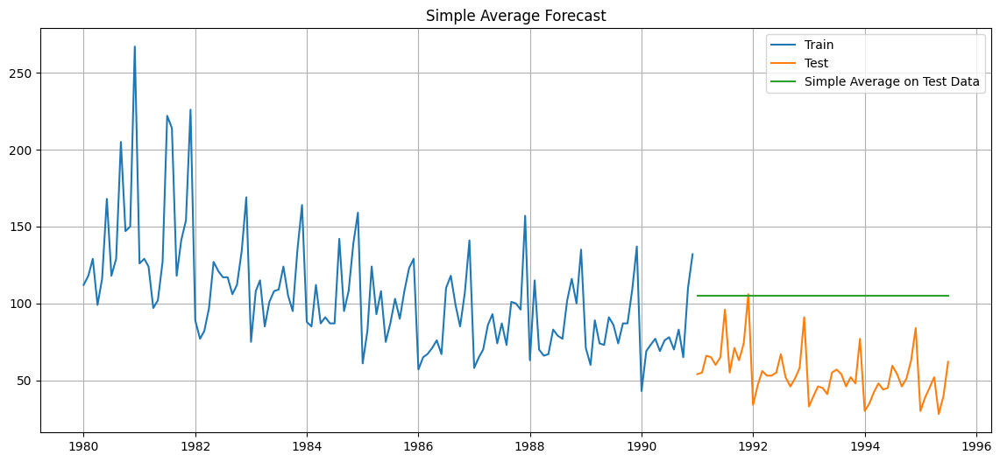

In [242]:
plt.figure(figsize=(14,6))
plt.plot(SimpleAverage_train['Sales'], label='Train')
plt.plot(SimpleAverage_test['Sales'], label='Test')
plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on Test Data')
plt.legend(loc='best')
plt.title("Simple Average Forecast")
plt.grid();

#### Model Evaluation

In [243]:
## Test Data - RMSE

rmse_model3_test = metrics.mean_squared_error(test['Sales'],SimpleAverage_test['mean_forecast'],squared=False)
resultsDf_3 = pd.DataFrame({'Test RMSE': [rmse_model3_test]},index=['Simple Average Model'])

resultsDf = pd.concat([resultsDf, resultsDf_3])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755


#### Model 3: Moving Average (MA)

##### For the Moving Average Model, We are going to calculate rolling means (or moving averages) for different intervals. The best interval can be determined by the maximum accuracy (or the minimum error) over here.

###### For Moving Average, We are going to average over the entire data.

In [244]:
MovingAverage = df.copy()
MovingAverage.head()

,Sales
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


#### Trailing Moving Averages

In [245]:
MovingAverage['Trailing_2'] = MovingAverage['Sales'].rolling(2).mean()
MovingAverage['Trailing_4'] = MovingAverage['Sales'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Sales'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Sales'].rolling(9).mean()

MovingAverage.head()

,Sales,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,112.0,NaN,NaN,NaN,NaN
1980-02-01,118.0,115.0,NaN,NaN,NaN
1980-03-01,129.0,123.5,NaN,NaN,NaN
1980-04-01,99.0,114.0,114.5,NaN,NaN
1980-05-01,116.0,107.5,115.5,NaN,NaN


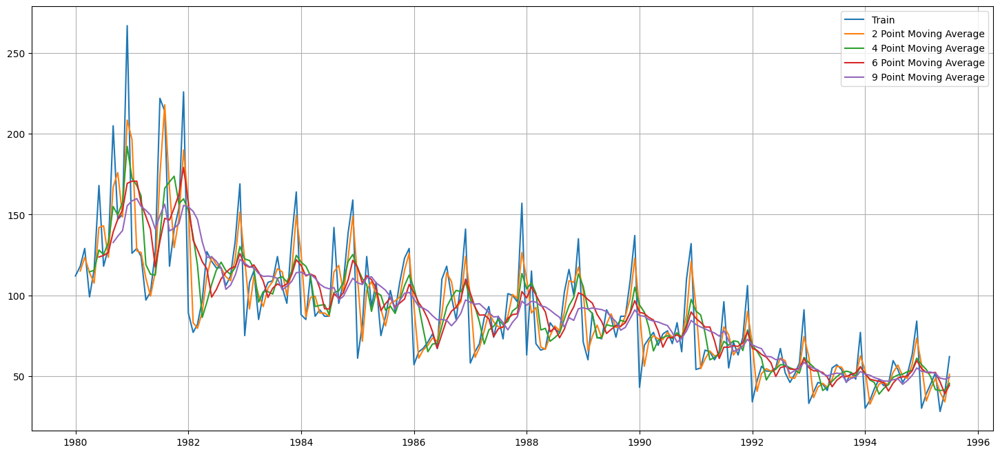

In [246]:
## Plotting on the whole data

plt.figure(figsize=(18,8))
plt.plot(MovingAverage['Sales'], label='Train')

plt.plot(MovingAverage['Trailing_2'], label = '2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'], label = '4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'], label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'], label = '9 Point Moving Average')

plt.legend(loc = 'best')
plt.grid();

Let us split the data into train and test and plot this Time Series. The window of the moving average is need to be carefully selected as too big a window will result in not having any test set as the whole series might get averaged over.

In [247]:
# Creating train and test set

#Creating train and test set
trailing_MovingAverage_train=MovingAverage[MovingAverage.index < '1991-01-01']
trailing_MovingAverage_test=MovingAverage[MovingAverage.index >= '1991-01-01']

print(trailing_MovingAverage_test.shape)
print(trailing_MovingAverage_train.shape)

(55, 5)
(132, 5)


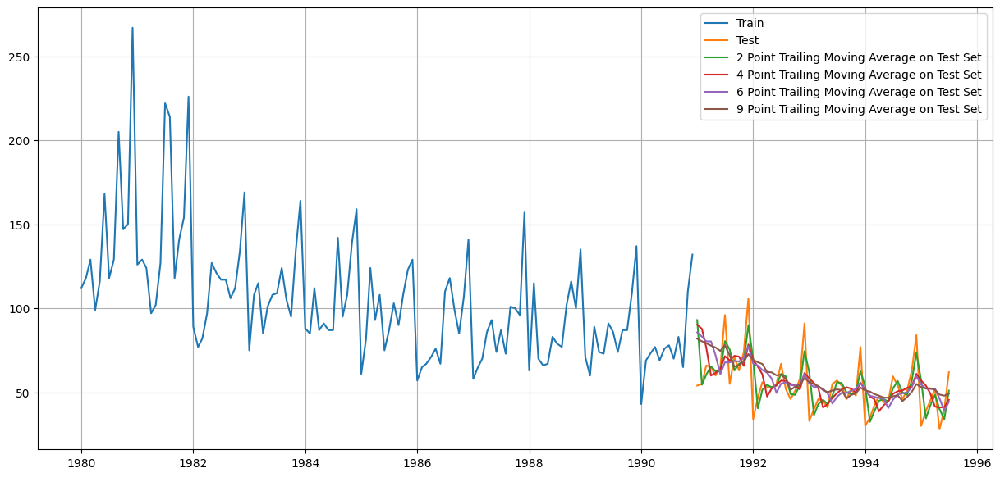

In [248]:
## Plotting on both the Training and Test data

plt.figure(figsize=(15,7))
plt.plot(trailing_MovingAverage_train['Sales'], label='Train')
plt.plot(trailing_MovingAverage_test['Sales'], label='Test')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label = '2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label = '4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'], label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'], label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.grid();

##### Model Evaluation

RMSE Calculation as below

In [249]:
## Test Data - RMSE --> 2 point Trailing MA
rmse_model4_test_2 = metrics.mean_squared_error(test['Sales'],trailing_MovingAverage_test['Trailing_2'],squared=False)

## Test Data - RMSE  --> 4 point Trailing MA
rmse_model4_test_4 = metrics.mean_squared_error(test['Sales'],trailing_MovingAverage_test['Trailing_4'],squared=False)

## Test Data - RMSE --> 6 point Trailing MA
rmse_model4_test_6 = metrics.mean_squared_error(test['Sales'],trailing_MovingAverage_test['Trailing_6'],squared=False)

## Test Data - RMSE  --> 9 point Trailing MA
rmse_model4_test_9 = metrics.mean_squared_error(test['Sales'],trailing_MovingAverage_test['Trailing_9'],squared=False)

In [250]:
resultsDf_4 = pd.DataFrame({'Test RMSE': [rmse_model4_test_2,rmse_model4_test_4
                                          ,rmse_model4_test_6,rmse_model4_test_9]}
                           ,index=['2pointTrailingMovingAverage','4pointTrailingMovingAverage'
                                   ,'6pointTrailingMovingAverage','9pointTrailingMovingAverage'])

resultsDf = pd.concat([resultsDf, resultsDf_4])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139


#### Before we go on to build the various Exponential Smoothing models, let us plot all the models and compare the Time Series plots.

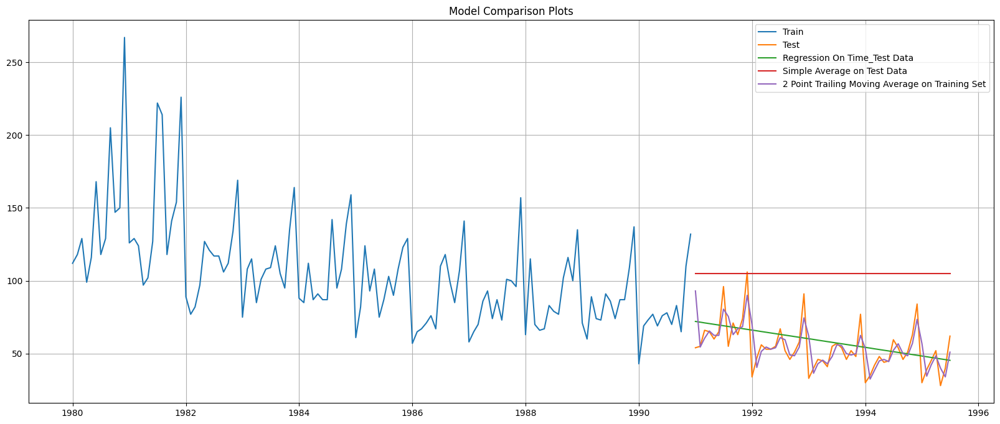

In [251]:
## Plotting on both Training and Test data

plt.figure(figsize=(20,8))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')

plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time_Test Data')

plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on Test Data')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')

plt.legend(loc='best')
plt.title("Model Comparison Plots")
plt.grid();

#### Model 4: Simple Exponential Smoothing

In [252]:
SES_train = train.copy()
SES_test = test.copy()

In [253]:
model_SES = SimpleExpSmoothing(SES_train['Sales'])

In [254]:
model_SES_autofit = model_SES.fit(optimized=True)

In [255]:
model_SES_autofit.params

{'smoothing_level': 0.12362013466760018,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 112.0,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [256]:
SES_test['predict'] = model_SES_autofit.forecast(steps=len(test))
SES_test.head()

,Sales,predict
YearMonth,,
1991-01-01,54.0,87.983765
1991-02-01,55.0,87.983765
1991-03-01,66.0,87.983765
1991-04-01,65.0,87.983765
1991-05-01,60.0,87.983765


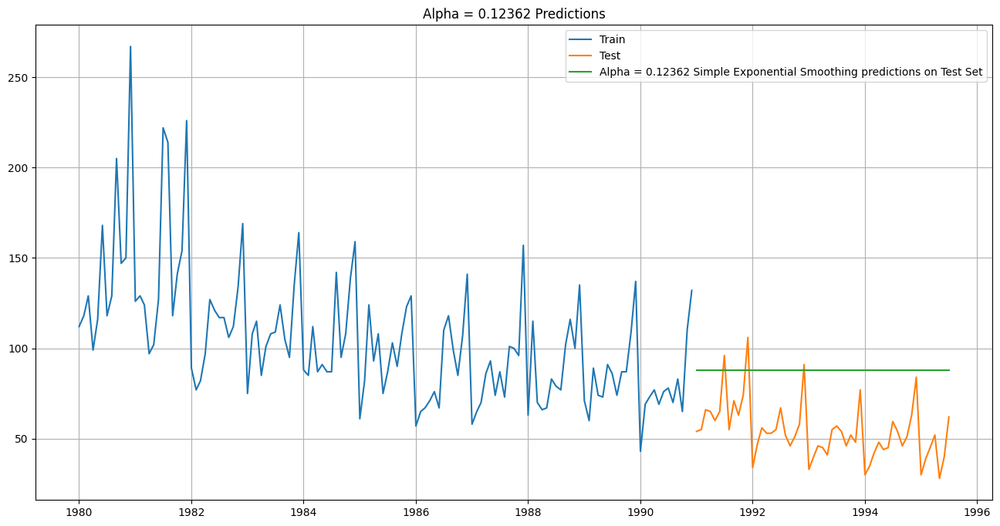

In [257]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(SES_train['Sales'], label='Train')
plt.plot(SES_test['Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha = 0.12362 Simple Exponential Smoothing predictions on Test Set')
plt.title('Alpha = 0.12362 Predictions');
plt.legend(loc='best')
plt.grid()
plt.show()


### Model Evaluation for  α  =  0.12362 : Simple Exponential Smoothing


In [258]:
# Test Data

rmse_model5_test_1 = metrics.mean_squared_error(SES_test['Sales'],SES_test['predict'],squared=False)
print("For Alpha = 0.12362 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_model5_test_1))


For Alpha = 0.12362 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is 37.193


In [259]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_model5_test_1]},index=['Alpha = 0.12362, SimpleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_5])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623


#### Setting different alpha values.

###### Remember, the higher the alpha value more weightage is given to the more recent observation. That means, what happened recently will happen again.


##### We will run a loop with different alpha values to understand which particular value works best for alpha on the test set.

In [260]:
from sklearn import metrics

# First we will define an empty dataframe (resultsDf_6) to store our values from the loop
resultsDf_6 = pd.DataFrame(columns=['Alpha Values', 'Train RMSE', 'Test RMSE'])

# Loop counter
l = 0

for i in np.arange(0.1,1,0.1):
    model_SES_alpha_i = model_SES.fit(smoothing_level=i, optimized=False, use_brute=True)

    # Predict on train and test sets
    SES_train.loc[:, f'predict_{i}'] = model_SES_alpha_i.fittedvalues
    SES_test.loc[:, f'predict_{i}'] = model_SES_alpha_i.forecast(steps=len(SES_test))

    # Check for NaN values
    if SES_train[f'predict_{i}'].isna().sum() == 0 and SES_test[f'predict_{i}'].isna().sum() == 0:
        # Calculate RMSE
        rmse_model5_train_i = metrics.mean_squared_error(SES_train['Sales'], SES_train[f'predict_{i}'], squared=False)
        rmse_model5_test_i = metrics.mean_squared_error(SES_test['Sales'], SES_test[f'predict_{i}'], squared=False)

        # Store results in a DataFrame
        resultsDf_alpha = pd.DataFrame({
            'Alpha Values': [i],
            'Train RMSE': [rmse_model5_train_i],
            'Test RMSE': [rmse_model5_test_i]
        }, index=[l])

        # Increment loop counter
        l += 1

        # Concatenate the current results with the main DataFrame
        resultsDf_6 = pd.concat([resultsDf_6, resultsDf_alpha])
    else:
        print(f"Warning: NaN values found for alpha={i}. Skipping this iteration.")

# Display the final results DataFrame
resultsDf_6


,Alpha Values,Train RMSE,Test RMSE
0,0.1,31.815610,36.429535
1,0.2,31.979391,40.957988
2,0.3,32.470164,47.096522
3,0.4,33.035130,53.356493
4,0.5,33.682839,59.229384
5,0.6,34.441171,64.558022
6,0.7,35.323261,69.284383
7,0.8,36.334596,73.359904
8,0.9,37.482782,76.725002


Model Evaluation

In [261]:
resultsDf_6.sort_values(by=['Test RMSE'],ascending=True)

,Alpha Values,Train RMSE,Test RMSE
0,0.1,31.815610,36.429535
1,0.2,31.979391,40.957988
2,0.3,32.470164,47.096522
3,0.4,33.035130,53.356493
4,0.5,33.682839,59.229384
5,0.6,34.441171,64.558022
6,0.7,35.323261,69.284383
7,0.8,36.334596,73.359904
8,0.9,37.482782,76.725002


Index(['Sales', 'predict', 'predict_0.1', 'predict_0.2',
       'predict_0.30000000000000004', 'predict_0.4', 'predict_0.5',
       'predict_0.6', 'predict_0.7000000000000001', 'predict_0.8',
       'predict_0.9'],
      dtype='object')
['predict_0.1', 'predict_0.2', 'predict_0.30000000000000004', 'predict_0.4', 'predict_0.5', 'predict_0.6', 'predict_0.7000000000000001', 'predict_0.8', 'predict_0.9']


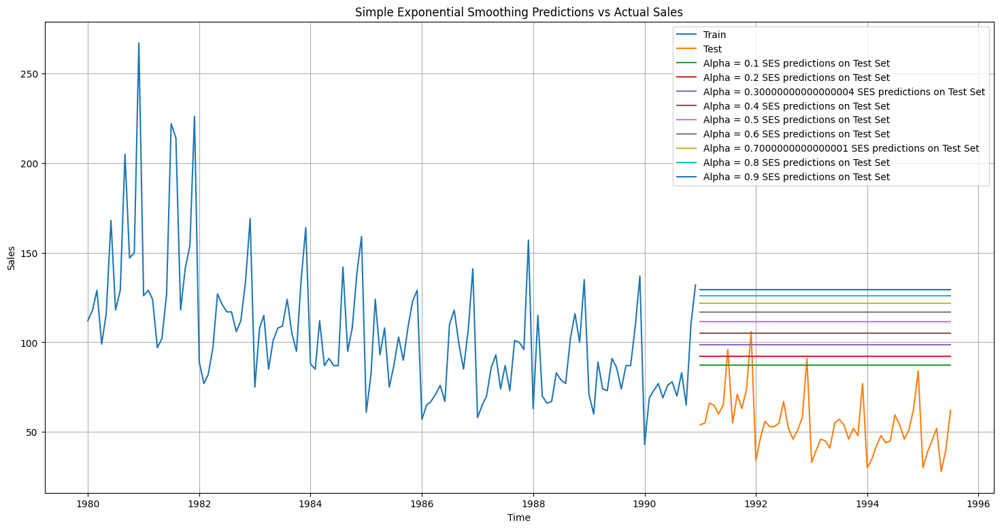

In [262]:
# Inspect the columns of SES_test
print(SES_test.columns)

# Check for columns starting with 'predict_'
predict_columns = [col for col in SES_test.columns if col.startswith('predict_')]
print(predict_columns)

# Plotting on both the Training and Test data
plt.figure(figsize=(18, 9))
plt.plot(SES_train['Sales'], label='Train')
plt.plot(SES_test['Sales'], label='Test')

# Plot predictions for available alpha values
for col in predict_columns:
    alpha = col.split('_')[1]  # Extract the alpha value from the column name
    plt.plot(SES_test[col], label=f'Alpha = {alpha} SES predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple Exponential Smoothing Predictions vs Actual Sales')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.show()

In [263]:
resultsDf_6_1 = pd.DataFrame({'Test RMSE': [resultsDf_6.sort_values(by=['Test RMSE'],ascending=True).values[0][2]]}
                           ,index=['Alpha=0.1,SimpleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_6_1])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623
"Alpha=0.1,SimpleExponentialSmoothing",36.429535


#### Method 5: Double Exponential Smoothing (Holt's Model)

##### Two parameters $\alpha$ and $\beta$ are estimated in this model. Level and Trend are accounted for in this model.

In [264]:
DES_train = train.copy()
DES_test = test.copy()

In [265]:
model_DES = Holt(DES_train['Sales'])

In [266]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_6 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Test RMSE': []})
model_DES_autofit = model_DES.fit(optimized=True)

model_DES_autofit.params

{'smoothing_level': 0.16213321015010723,
 'smoothing_trend': 0.13152155372234675,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 112.0,
 'initial_trend': 6.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [267]:
DES_test['predict'] = model_DES_autofit.forecast(steps=len(test))
DES_test.head()

,Sales,predict
YearMonth,,
1991-01-01,54.0,87.249993
1991-02-01,55.0,88.152722
1991-03-01,66.0,89.055451
1991-04-01,65.0,89.958180
1991-05-01,60.0,90.860910


In [268]:
# Initialize results DataFrame
resultsDf_7 = pd.DataFrame(columns=['Alpha Values', 'Beta Values', 'Train RMSE', 'Test RMSE'])

l = 0

for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        # Fit the Double Exponential Smoothing model with alpha and beta values
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i, smoothing_trend=j, optimized=False, use_brute=True)

        # Generate column names based on alpha and beta values
        col_name_train = f'predict_{i:.1f}_{j:.1f}'
        col_name_test = f'predict_{i:.1f}_{j:.1f}'

        # Store predictions
        DES_train[col_name_train] = model_DES_alpha_i_j.fittedvalues
        DES_test[col_name_test] = model_DES_alpha_i_j.forecast(steps=len(DES_test))

        # Calculate RMSE if there are no NaN values in predictions
        if not DES_train[col_name_train].isna().any() and not DES_test[col_name_test].isna().any():
            rmse_model6_train = metrics.mean_squared_error(DES_train['Sales'], DES_train[col_name_train], squared=False)
            rmse_model6_test = metrics.mean_squared_error(DES_test['Sales'], DES_test[col_name_test], squared=False)

            # Store results in a DataFrame
            resultsDf_alpha2 = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Train RMSE': [rmse_model6_train],
                'Test RMSE': [rmse_model6_test]
            }, index=[l])

            # Increment loop counter
            l += 1

            # Concatenate the current results with the main DataFrame
            resultsDf_7 = pd.concat([resultsDf_7, resultsDf_alpha2])
        else:
            print(f"Warning: NaN values found for alpha={i}, beta={j}. Skipping this iteration.")

# Display the final results DataFrame
resultsDf_7

,Alpha Values,Beta Values,Train RMSE,Test RMSE
0,0.1,0.1,34.439111,36.510010
1,0.1,0.2,33.450729,48.221436
2,0.1,0.3,33.145789,77.649847
3,0.1,0.4,33.262191,99.064536
4,0.1,0.5,33.688415,123.742433
...,...,...,...,...
95,1.0,0.6,51.831610,801.137173
96,1.0,0.7,54.497039,841.349112
97,1.0,0.8,57.365879,853.421959
98,1.0,0.9,60.474309,834.167545


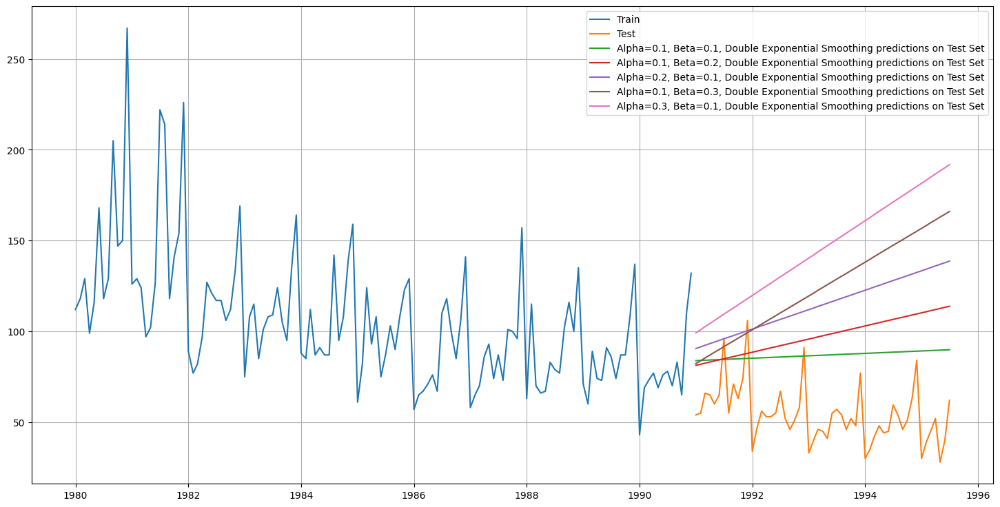

In [269]:
# Plotting on both the Training and Test data
plt.figure(figsize=(18, 9))

# Plot the actual sales data for training and test sets
plt.plot(DES_train['Sales'], label='Train')
plt.plot(DES_test['Sales'], label='Test')

# Plot the predictions for specific alpha and beta values
plt.plot(DES_test['predict_0.1_0.1'], label='Alpha=0.1, Beta=0.1, Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict_0.1_0.2'], label='Alpha=0.1, Beta=0.2, Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict_0.2_0.1'], label='Alpha=0.2, Beta=0.1, Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict_0.1_0.3'], label='Alpha=0.1, Beta=0.3, Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict_0.3_0.1'], label='Alpha=0.3, Beta=0.1, Double Exponential Smoothing predictions on Test Set')


# Add legend and grid
plt.legend(loc='best')
plt.grid()

# Show the plot
plt.show()

#### Model Evaluation

In [270]:
resultsDf_7.sort_values(by=['Test RMSE'],ascending=True).head(5)

,Alpha Values,Beta Values,Train RMSE,Test RMSE
0,0.1,0.1,34.439111,36.510010
1,0.1,0.2,33.450729,48.221436
10,0.2,0.1,33.097427,65.251675
2,0.1,0.3,33.145789,77.649847
20,0.3,0.1,33.611269,98.152852


In [271]:
resultsDf_7 = pd.DataFrame({'Test RMSE': [resultsDf_7.sort_values(by=['Test RMSE']).values[0][3]]}
                           ,index=['Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_7])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623
"Alpha=0.1,SimpleExponentialSmoothing",36.429535
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",36.510010


#### Method 5: Triple Exponential Smoothing (Holt - Winter's Model)

##### Three parameters $\alpha$, $\beta$ and $\gamma$ are estimated in this model. Level, Trend and Seasonality are accounted for in this model.

In [272]:
TES_train = train.copy()
TES_test = test.copy()

In [273]:
model_TES_ta_sa = ExponentialSmoothing(TES_train['Sales'],trend='additive',seasonal='additive')
model_TES_ta_sm = ExponentialSmoothing(TES_train['Sales'],trend='additive',seasonal='multiplicative')
model_TES_tm_sm = ExponentialSmoothing(TES_train['Sales'],trend='multiplicative',seasonal='multiplicative')
model_TES_tm_sa = ExponentialSmoothing(TES_train['Sales'],trend='multiplicative',seasonal='additive')

In [274]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_7 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_7

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE


In [275]:
model_TES_autofit_ta_sa = model_TES_ta_sa.fit(optimized=True)
model_TES_autofit_ta_sm = model_TES_ta_sm.fit(optimized=True)
model_TES_autofit_tm_sm = model_TES_tm_sm.fit(optimized=True)
model_TES_autofit_tm_sa = model_TES_tm_sa.fit(optimized=True)

In [276]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_7_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_7_2

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE


In [277]:
model_TES_autofit_ta_sa.params

{'smoothing_level': 0.08491574907842013,
 'smoothing_trend': 5.5205494088745035e-06,
 'smoothing_seasonal': 0.0005477182208247348,
 'damping_trend': nan,
 'initial_level': 147.05898703809248,
 'initial_trend': -0.5496981430927392,
 'initial_seasons': array([-31.16021285, -18.81317648, -10.81406896, -21.41413199,
        -12.6036696 ,  -7.23553106,   2.76744902,   8.85548059,
          4.83969803,   2.95125217,  21.07934859,  63.31472515]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [278]:
model_TES_autofit_ta_sm.params

{'smoothing_level': 0.07736040004765096,
 'smoothing_trend': 0.03936496779735522,
 'smoothing_seasonal': 0.0008375039104357999,
 'damping_trend': nan,
 'initial_level': 156.90674503596637,
 'initial_trend': -0.9061396720042346,
 'initial_seasons': array([0.7142168 , 0.80982439, 0.88543128, 0.77363782, 0.87046319,
        0.94699283, 1.04196135, 1.11012703, 1.04835489, 1.0276963 ,
        1.19783562, 1.6514144 ]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [279]:
model_TES_autofit_tm_sm.params

{'smoothing_level': 0.053527754869099636,
 'smoothing_trend': 0.03326784064001227,
 'smoothing_seasonal': 1.1369165069859105e-05,
 'damping_trend': nan,
 'initial_level': 114.21180446123547,
 'initial_trend': 0.9923631726352484,
 'initial_seasons': array([0.99382377, 1.12786066, 1.23494689, 1.07812886, 1.21324338,
        1.31945262, 1.44982009, 1.54564845, 1.4653871 , 1.43209206,
        1.67215844, 2.30190104]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [280]:
model_TES_autofit_tm_sa.params

{'smoothing_level': 0.14642857142857144,
 'smoothing_trend': 0.05324675324675325,
 'smoothing_seasonal': 0.13131868131868132,
 'damping_trend': nan,
 'initial_level': 145.27499999999992,
 'initial_trend': 1.0052617032482805,
 'initial_seasons': array([-30.484375  , -25.046875  , -15.53645833, -30.734375  ,
        -16.46354167,  -9.72395833,  12.44270833,  17.53645833,
          5.55729167,  -3.890625  ,  15.99479167,  80.34895833]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [281]:
TES_test['predict_ta_sa'] = model_TES_autofit_ta_sa.forecast(steps=len(test))
TES_test.head()

,Sales,predict_ta_sa
YearMonth,,
1991-01-01,54.0,42.574560
1991-02-01,55.0,54.372099
1991-03-01,66.0,61.821511
1991-04-01,65.0,50.671639
1991-05-01,60.0,58.932400


In [282]:
TES_test['predict_ta_sm'] = model_TES_autofit_ta_sm.forecast(steps=len(test))
TES_test.head()

,Sales,predict_ta_sa,predict_ta_sm
YearMonth,,,
1991-01-01,54.0,42.574560,55.942246
1991-02-01,55.0,54.372099,63.240624
1991-03-01,66.0,61.821511,68.899674
1991-04-01,65.0,50.671639,60.007486
1991-05-01,60.0,58.932400,67.257150


In [283]:
TES_test['predict_tm_sm'] = model_TES_autofit_tm_sm.forecast(steps=len(test))
TES_test.head()

,Sales,predict_ta_sa,predict_ta_sm,predict_tm_sm
YearMonth,,,,
1991-01-01,54.0,42.574560,55.942246,55.753580
1991-02-01,55.0,54.372099,63.240624,63.084055
1991-03-01,66.0,61.821511,68.899674,68.866825
1991-04-01,65.0,50.671639,60.007486,59.942156
1991-05-01,60.0,58.932400,67.257150,67.252072


In [284]:
TES_test['predict_tm_sa'] = model_TES_autofit_tm_sa.forecast(steps=len(test))
TES_test.head()

,Sales,predict_ta_sa,predict_ta_sm,predict_tm_sm,predict_tm_sa
YearMonth,,,,,
1991-01-01,54.0,42.574560,55.942246,55.753580,46.284930
1991-02-01,55.0,54.372099,63.240624,63.084055,58.354810
1991-03-01,66.0,61.821511,68.899674,68.866825,64.361205
1991-04-01,65.0,50.671639,60.007486,59.942156,54.433907
1991-05-01,60.0,58.932400,67.257150,67.252072,60.002489


In [285]:
## Test Data

rmse_model_temp_ta_sa = metrics.mean_squared_error(TES_test['Sales'],TES_test['predict_ta_sa'],squared=False)
print("For Alpha =0.08621, Beta = 1.3722, Gamma = 0.4763 Tripple Exponential Smoothing Model (Trend = Additive, Seasonality = Additive) forecast on the Test Data, RMSE is %3.3f"
      %(rmse_model_temp_ta_sa))

## Test Data

rmse_model_temp_ta_sm = metrics.mean_squared_error(TES_test['Sales'],TES_test['predict_ta_sm'],squared=False)
print("For Alpha =0.1542, Beta = 5.3100, Gamma = 0.3713 Tripple Exponential Smoothing Model (Trend = Additive, Seasonality = Multiplicative) forecast on the Test Data, RMSE is %3.3f"
      %(rmse_model_temp_ta_sm))

## Test Data

rmse_model_temp_tm_sm = metrics.mean_squared_error(TES_test['Sales'],TES_test['predict_tm_sm'],squared=False)
print("For Alpha =0.1531, Beta = 1.3401, Gamma = 0.3691 Tripple Exponential Smoothing Model (Trend = Multiplicative, Seasonality = Multiplicative) forecast on the Test Data, RMSE is %3.3f"
      %(rmse_model_temp_tm_sm))

## Test Data

rmse_model_temp_tm_sa = metrics.mean_squared_error(TES_test['Sales'],TES_test['predict_tm_sa'],squared=False)
print("For Alpha =0.0831, Beta = 7.8624, Gamma = 0.4910 Tripple Exponential Smoothing Model (Trend = Multiplicative, Seasonality = Additive) forecast on the Test Data, RMSE is %3.3f"
      %(rmse_model_temp_tm_sa))

For Alpha =0.08621, Beta = 1.3722, Gamma = 0.4763 Tripple Exponential Smoothing Model (Trend = Additive, Seasonality = Additive) forecast on the Test Data, RMSE is 14.128
For Alpha =0.1542, Beta = 5.3100, Gamma = 0.3713 Tripple Exponential Smoothing Model (Trend = Additive, Seasonality = Multiplicative) forecast on the Test Data, RMSE is 18.683
For Alpha =0.1531, Beta = 1.3401, Gamma = 0.3691 Tripple Exponential Smoothing Model (Trend = Multiplicative, Seasonality = Multiplicative) forecast on the Test Data, RMSE is 19.880
For Alpha =0.0831, Beta = 7.8624, Gamma = 0.4910 Tripple Exponential Smoothing Model (Trend = Multiplicative, Seasonality = Additive) forecast on the Test Data, RMSE is 16.254


In [286]:
resultsDf_temp = pd.DataFrame({'Test RMSE': rmse_model_temp_ta_sa}
                           ,index=['Alpha=0.08621,Beta=1.3722,Gamma=0.4763,TrippleExponentialSmoothing_Auto_Fit'])

resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623
"Alpha=0.1,SimpleExponentialSmoothing",36.429535
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",36.510010
"Alpha=0.08621,Beta=1.3722,Gamma=0.4763,TrippleExponentialSmoothing_Auto_Fit",14.127706


In [287]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_7_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Test RMSE': [],
                             'Method' : []})
resultsDf_7_2

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE,Method


In [288]:
# Initialize the DataFrame to store results
resultsDf_7_2 = pd.DataFrame()

# Loop through different combinations of alpha, beta, and gamma values
for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        for k in np.arange(0.1, 1.1, 0.1):
            # Fit the Triple Exponential Smoothing model
            model_TES_alpha_i_j_k = model_TES_ta_sa.fit(smoothing_level=i,
                                                        smoothing_slope=j,
                                                        smoothing_seasonal=k,
                                                        optimized=False,
                                                        use_brute=True)

            # Generate predictions for train and test sets
            TES_train[('predict_ta_sa', i, j, k)] = model_TES_alpha_i_j_k.fittedvalues
            TES_test[('predict_ta_sa', i, j, k)] = model_TES_alpha_i_j_k.forecast(steps=len(TES_test))

            # Calculate RMSE for train and test sets
            rmse_model7_train = metrics.mean_squared_error(TES_train['Sales'], TES_train[('predict_ta_sa', i, j, k)], squared=False)
            rmse_model7_test = metrics.mean_squared_error(TES_test['Sales'], TES_test[('predict_ta_sa', i, j, k)].replace([np.inf, np.nan], 0).dropna(), squared=False)

            # Append the results to the DataFrame
            resultsDf_alpha3 = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Gamma Values': [k],
                'Train RMSE': [rmse_model7_train],
                'Test RMSE': [rmse_model7_test],
                'Method': ['ta_sa']
            })

            # Concatenate the current results with the existing DataFrame
            resultsDf_7_2 = pd.concat([resultsDf_7_2, resultsDf_alpha3], ignore_index=True)

# Display the results
print(resultsDf_7_2)


     Alpha Values  Beta Values  Gamma Values     Train RMSE     Test RMSE  \
0             0.1          0.1           0.1      21.332001  1.460010e+01   
1             0.1          0.1           0.2      21.376545  1.326516e+01   
2             0.1          0.1           0.3      21.711811  1.329567e+01   
3             0.1          0.1           0.4      22.223992  1.363457e+01   
4             0.1          0.1           0.5      22.868747  1.403694e+01   
..            ...          ...           ...            ...           ...   
995           1.0          1.0           0.6    2005.858333  3.397495e+04   
996           1.0          1.0           0.7    7447.070502  8.766221e+04   
997           1.0          1.0           0.8   25743.870344  8.166530e+05   
998           1.0          1.0           0.9   80677.424683  3.575054e+06   
999           1.0          1.0           1.0  228894.798212  1.205732e+07   

    Method  
0    ta_sa  
1    ta_sa  
2    ta_sa  
3    ta_sa  
4    ta_sa

In [289]:
# Loop through different combinations of alpha, beta, and gamma values
for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        for k in np.arange(0.1, 1.1, 0.1):
            # Fit the Triple Exponential Smoothing model
            model_TES_alpha_i_j_k = model_TES_ta_sm.fit(smoothing_level=i,
                                                        smoothing_slope=j,
                                                        smoothing_seasonal=k,
                                                        optimized=False,
                                                        use_brute=True)

            # Generate predictions for train and test sets
            TES_train[('predict_ta_sm', i, j, k)] = model_TES_alpha_i_j_k.fittedvalues
            TES_test[('predict_ta_sm', i, j, k)] = model_TES_alpha_i_j_k.forecast(steps=len(TES_test))

            # Calculate RMSE for train and test sets
            rmse_model7_train = metrics.mean_squared_error(TES_train['Sales'], TES_train[('predict_ta_sm', i, j, k)], squared=False)
            rmse_model7_test = metrics.mean_squared_error(TES_test['Sales'], TES_test[('predict_ta_sm', i, j, k)].replace([np.inf, np.nan], 0).dropna(), squared=False)

            # Create a temporary DataFrame to hold the current iteration's results
            resultsDf_temp = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Gamma Values': [k],
                'Train RMSE': [rmse_model7_train],
                'Test RMSE': [rmse_model7_test],
                'Method': ['ta_sm']
            })

            # Concatenate the temporary DataFrame with the results DataFrame
            resultsDf_7_2 = pd.concat([resultsDf_7_2, resultsDf_temp], ignore_index=True)

In [290]:
# Loop through different combinations of alpha, beta, and gamma values
for i in np.arange(0.1, 1.0, 0.1):
    for j in np.arange(0.1, 1.0, 0.1):
        for k in np.arange(0.1, 1.0, 0.1):
            # Fit the Triple Exponential Smoothing model
            model_TES_alpha_i_j_k = model_TES_tm_sm.fit(smoothing_level=i,
                                                        smoothing_slope=j,
                                                        smoothing_seasonal=k,
                                                        optimized=False,
                                                        use_brute=True)

            # Generate predictions for train and test sets
            TES_train[('predict_tm_sm', i, j, k)] = model_TES_alpha_i_j_k.fittedvalues
            TES_test[('predict_tm_sm', i, j, k)] = model_TES_alpha_i_j_k.forecast(steps=len(TES_test))

            # Calculate RMSE for train and test sets
            rmse_model7_train = metrics.mean_squared_error(TES_train['Sales'], TES_train[('predict_tm_sm', i, j, k)], squared=False)
            rmse_model7_test = metrics.mean_squared_error(TES_test['Sales'], TES_test[('predict_tm_sm', i, j, k)].replace([np.inf, np.nan], 0).dropna(), squared=False)

            # Create a temporary DataFrame to store the current iteration's results
            resultsDf_temp = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Gamma Values': [k],
                'Train RMSE': [rmse_model7_train],
                'Test RMSE': [rmse_model7_test],
                'Method': ['tm_sm']
            })

            # Concatenate the temporary DataFrame with the main results DataFrame
            resultsDf_7_2 = pd.concat([resultsDf_7_2, resultsDf_temp], ignore_index=True)

print(resultsDf_7_2)


      Alpha Values  Beta Values  Gamma Values    Train RMSE      Test RMSE  \
0              0.1          0.1           0.1  2.133200e+01   1.460010e+01   
1              0.1          0.1           0.2  2.137654e+01   1.326516e+01   
2              0.1          0.1           0.3  2.171181e+01   1.329567e+01   
3              0.1          0.1           0.4  2.222399e+01   1.363457e+01   
4              0.1          0.1           0.5  2.286875e+01   1.403694e+01   
...            ...          ...           ...           ...            ...   
2724           0.9          0.9           0.5  2.308936e+02   2.169365e+33   
2725           0.9          0.9           0.6  3.079798e+02   6.022883e+70   
2726           0.9          0.9           0.7  2.431277e+14   7.050911e+28   
2727           0.9          0.9           0.8  3.575037e+11  1.220062e+108   
2728           0.9          0.9           0.9  8.855529e+27   6.383171e+28   

     Method  
0     ta_sa  
1     ta_sa  
2     ta_sa  
3     t

In [291]:
# Loop through different combinations of alpha, beta, and gamma values
for i in np.arange(0.1, 1.0, 0.1):
    for j in np.arange(0.1, 1.0, 0.1):
        for k in np.arange(0.1, 1.0, 0.1):
            # Fit the Triple Exponential Smoothing model
            model_TES_alpha_i_j_k = model_TES_tm_sa.fit(smoothing_level=i,
                                                        smoothing_slope=j,
                                                        smoothing_seasonal=k,
                                                        optimized=False,
                                                        use_brute=True)

            # Generate predictions for train and test sets
            TES_train[('predict_tm_sa', i, j, k)] = model_TES_alpha_i_j_k.fittedvalues
            TES_test[('predict_tm_sa', i, j, k)] = model_TES_alpha_i_j_k.forecast(steps=len(TES_test))

            # Calculate RMSE for train and test sets
            rmse_model7_train = metrics.mean_squared_error(TES_train['Sales'], TES_train[('predict_tm_sa', i, j, k)], squared=False)
            rmse_model7_test = metrics.mean_squared_error(TES_test['Sales'], TES_test[('predict_tm_sa', i, j, k)].replace([np.inf, np.nan], 0).dropna(), squared=False)

            # Create a temporary DataFrame to store the current iteration's results
            resultsDf_temp = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Gamma Values': [k],
                'Train RMSE': [rmse_model7_train],
                'Test RMSE': [rmse_model7_test],
                'Method': ['tm_sa']
            })

            # Concatenate the temporary DataFrame with the main results DataFrame
            resultsDf_7_2 = pd.concat([resultsDf_7_2, resultsDf_temp], ignore_index=True)


In [292]:
TES_test.head()

,Sales,predict_ta_sa,predict_ta_sm,predict_tm_sm,predict_tm_sa,"(predict_ta_sa, 0.1, 0.1, 0.1)","(predict_ta_sa, 0.1, 0.1, 0.2)","(predict_ta_sa, 0.1, 0.1, 0.30000000000000004)","(predict_ta_sa, 0.1, 0.1, 0.4)","(predict_ta_sa, 0.1, 0.1, 0.5)",...,"(predict_tm_sa, 0.9, 0.8, 0.9)","(predict_tm_sa, 0.9, 0.9, 0.1)","(predict_tm_sa, 0.9, 0.9, 0.2)","(predict_tm_sa, 0.9, 0.9, 0.30000000000000004)","(predict_tm_sa, 0.9, 0.9, 0.4)","(predict_tm_sa, 0.9, 0.9, 0.5)","(predict_tm_sa, 0.9, 0.9, 0.6)","(predict_tm_sa, 0.9, 0.9, 0.7000000000000001)","(predict_tm_sa, 0.9, 0.9, 0.8)","(predict_tm_sa, 0.9, 0.9, 0.9)"
YearMonth,,,,,,,,,,,,,,,,,,,,,
1991-01-01,54.0,42.574560,55.942246,55.753580,46.284930,45.711834,46.537302,46.559436,46.071952,45.225493,...,3.735952e+33,49.121533,76.518424,376.731488,4895.861548,5.809412e+04,1.638740e+05,-5.749099e+08,-1.981676e+12,9.552794e+39
1991-02-01,55.0,54.372099,63.240624,63.084055,58.354810,56.369270,60.659980,62.645947,63.356292,63.447907,...,7.148786e+32,37.090349,76.114781,509.316662,16304.896188,6.511844e+05,2.092803e+07,-2.812972e+11,-1.592913e+17,7.303099e+38
1991-03-01,66.0,61.821511,68.899674,68.866825,64.361205,63.004762,65.794341,66.979401,67.649481,68.330584,...,1.357303e+32,15.196663,47.008485,593.068850,47658.505261,5.673444e+06,8.764094e+08,-2.321151e+11,-4.477184e+20,5.583209e+37
1991-04-01,65.0,50.671639,60.007486,59.942156,54.433907,51.663022,58.369250,62.190538,64.397061,65.989684,...,2.576482e+31,-2.515265,9.602428,669.057836,138695.857310,4.866318e+07,2.483195e+10,1.937298e+15,-8.742387e+22,4.268341e+36
1991-05-01,60.0,58.932400,67.257150,67.252072,60.002489,58.931424,61.246579,62.077338,62.127541,62.025325,...,-1.230813e+29,-1.476818,-5.631953,759.079023,403820.871296,4.173403e+08,6.957411e+11,4.618220e+17,-2.928919e+24,-3.966771e+36


##### Model Evaluation

In [293]:
resultsDf_7_2.sort_values(by=['Test RMSE']).head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE,Method
2136,0.2,0.7,0.2,24.042290,8.992350,tm_sm
1010,0.1,0.2,0.1,19.770392,9.221020,ta_sm
1011,0.1,0.2,0.2,20.253487,9.543696,ta_sm
1151,0.2,0.6,0.2,23.129850,9.922552,ta_sm
1012,0.1,0.2,0.3,20.871304,9.952909,ta_sm


In [294]:
resultsDf_7_3 = pd.DataFrame({'Test RMSE': [resultsDf_7_2.sort_values(by=['Test RMSE']).values[0][4]]}
                           ,index=['Alpha=0.2,Beta=0.7,Gamma=0.2,TripleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_7_3])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623
"Alpha=0.1,SimpleExponentialSmoothing",36.429535
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",36.510010
"Alpha=0.08621,Beta=1.3722,Gamma=0.4763,TrippleExponentialSmoothing_Auto_Fit",14.127706


##### Check the performance of the models built and Sort in Ascending Order

In [295]:
# Sort the RMSE values in asceding order
resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE
"Alpha=0.2,Beta=0.7,Gamma=0.2,TripleExponentialSmoothing",8.992350
2pointTrailingMovingAverage,11.589082
"Alpha=0.08621,Beta=1.3722,Gamma=0.4763,TrippleExponentialSmoothing_Auto_Fit",14.127706
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
RegressionOnTime,15.278158
"Alpha=0.1,SimpleExponentialSmoothing",36.429535
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",36.510010
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623


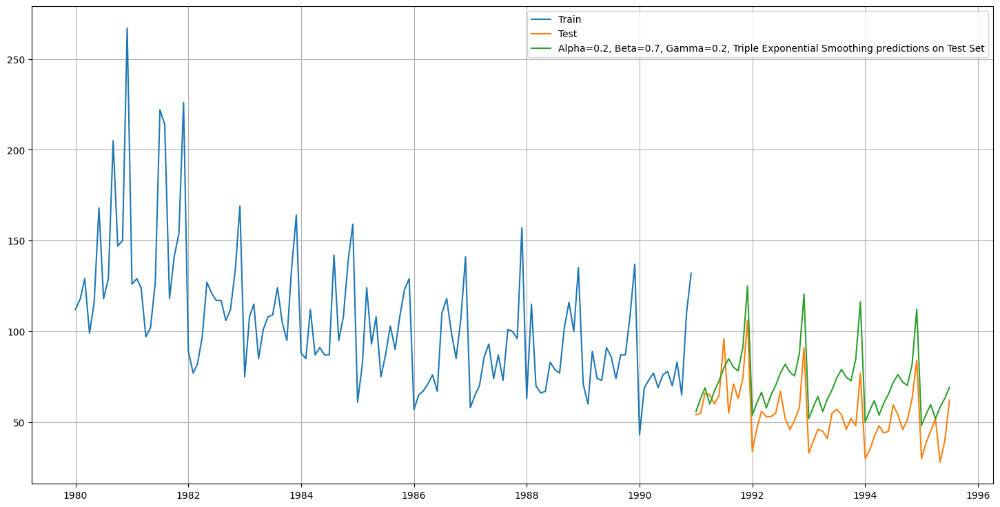

In [296]:
#  Best figures obtained for Trend = Multiplicative and Seasonality = Multiplicative
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination

plt.figure(figsize=(18, 9))

# Plotting the actual training and test data
plt.plot(TES_train['Sales'], label='Train')
plt.plot(TES_test['Sales'], label='Test')

# Ensure the column name for predictions is correct
plt.plot(TES_test['predict_tm_sm'], label='Alpha=0.2, Beta=0.7, Gamma=0.2, Triple Exponential Smoothing predictions on Test Set')


# Adding legend and grid
plt.legend(loc='best')
plt.grid()

# Display the plot
plt.show()


## Check for Stationarity

Check for stationarity of the whole Time Series data.
The Augmented Dickey-Fuller test is an unit root test which determines whether there is a unit root and subsequently whether the series is non-stationary.

The hypothesis in a simple form for the ADF test is:


H0 : The Time Series has a unit root and is thus non-stationary.

H1 : The Time Series does not have a unit root and is thus stationary.


In [297]:
from statsmodels.tsa.stattools import adfuller

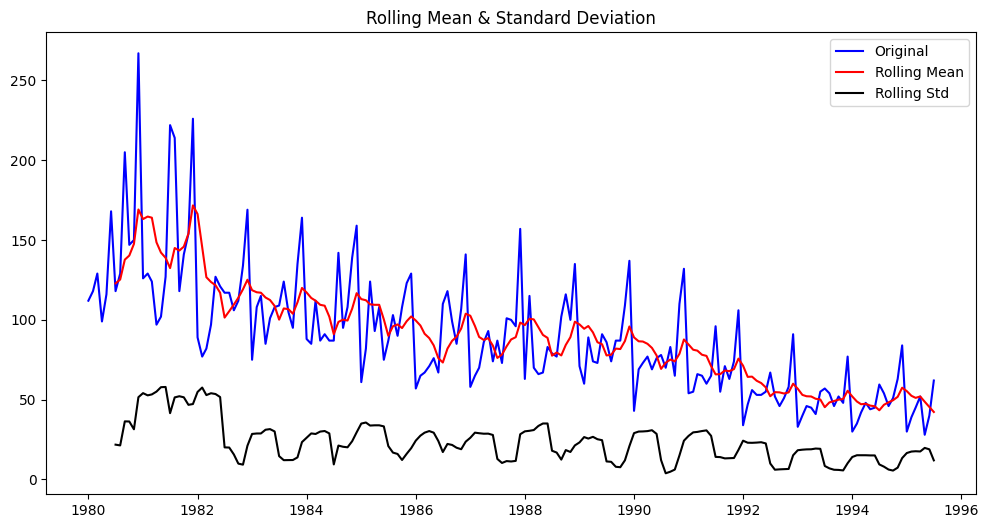

Results of Dickey-Fuller Test:
Test Statistic                  -1.892338
p-value                          0.335674
#Lags Used                      13.000000
Number of Observations Used    173.000000
Critical Value (1%)             -3.468726
Critical Value (5%)             -2.878396
Critical Value (10%)            -2.575756
dtype: float64 



In [298]:
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean()   # determining the rolling mean
    rolstd = timeseries.rolling(window=7).std()     # determining the rolling standard deviation

    # Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    # Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')
test_stationarity(df['Sales'])

We see that at 5% significant level the Time Series is non-stationary.

##### Let us take a difference of order 1 and check whether the Time Series is stationary or not.

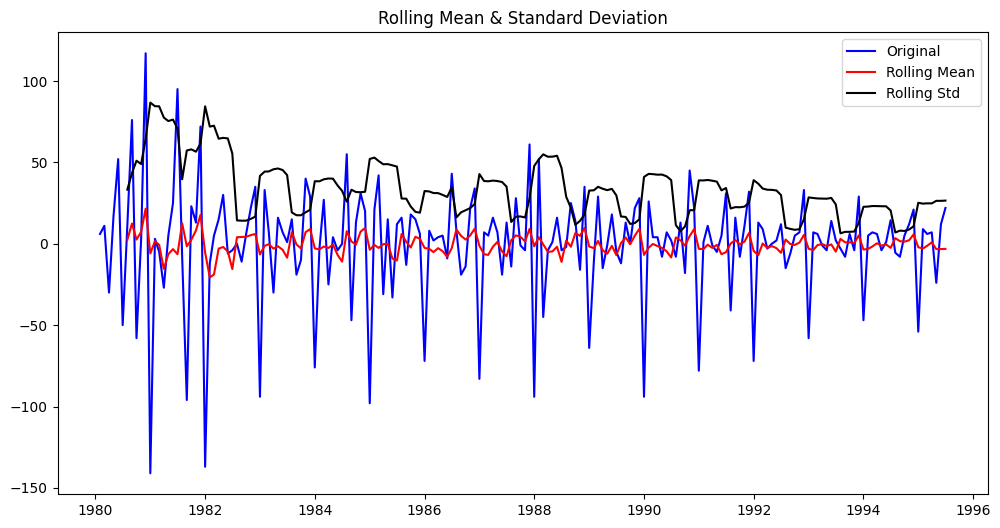

Results of Dickey-Fuller Test:
Test Statistic                -8.032729e+00
p-value                        1.938803e-12
#Lags Used                     1.200000e+01
Number of Observations Used    1.730000e+02
Critical Value (1%)           -3.468726e+00
Critical Value (5%)           -2.878396e+00
Critical Value (10%)          -2.575756e+00
dtype: float64 



In [299]:
test_stationarity(df['Sales'].diff().dropna())

We observe that the p-value (α) is less than 0.05. Therefore, we reject the null hypothesis. This result suggests that the time series is stationary, meaning its statistical properties such as mean, variance, and autocorrelation remain constant over time.

## Model Building - Stationary Data

Generate ACF & PACF Plot and find the AR, MA values

ACF and PACF Plots

In [300]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

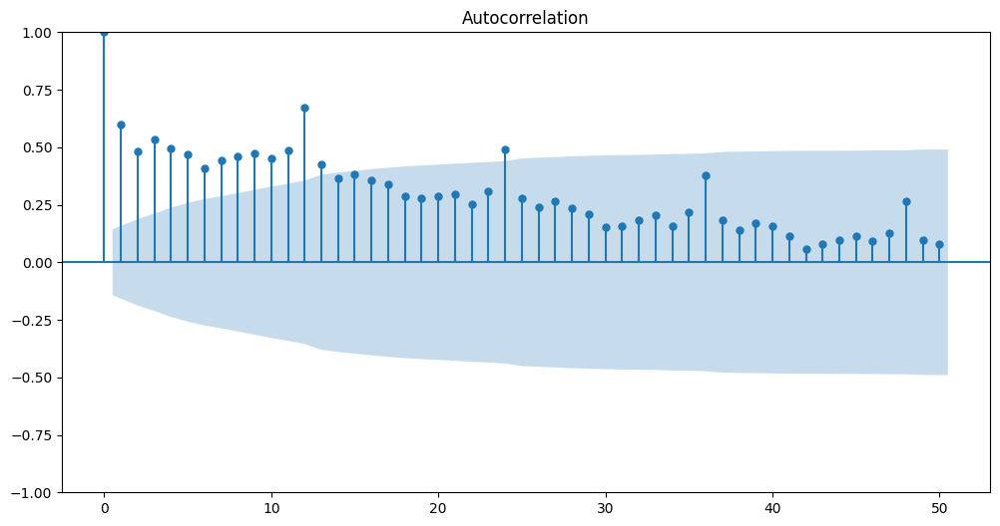

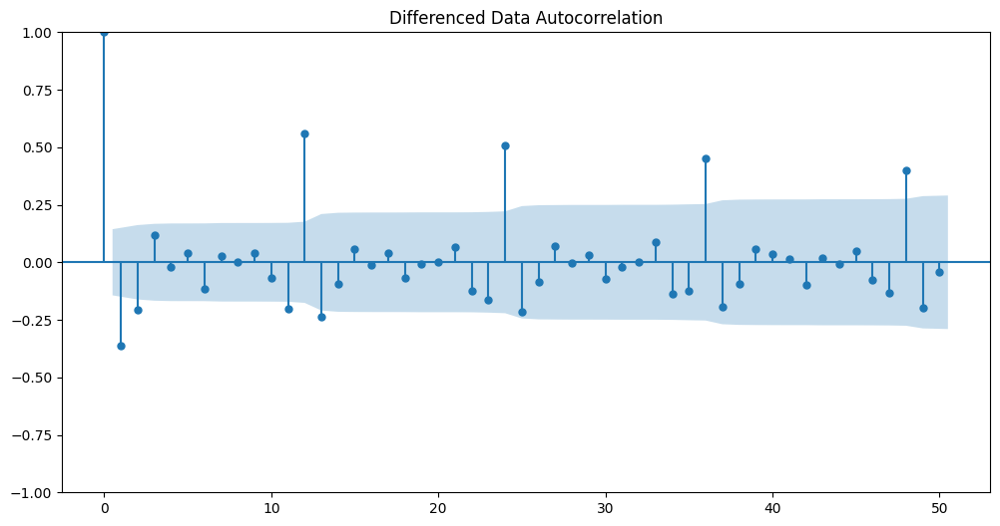

In [301]:
plot_acf(df['Sales'],lags=50)
plot_acf(df['Sales'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.show()

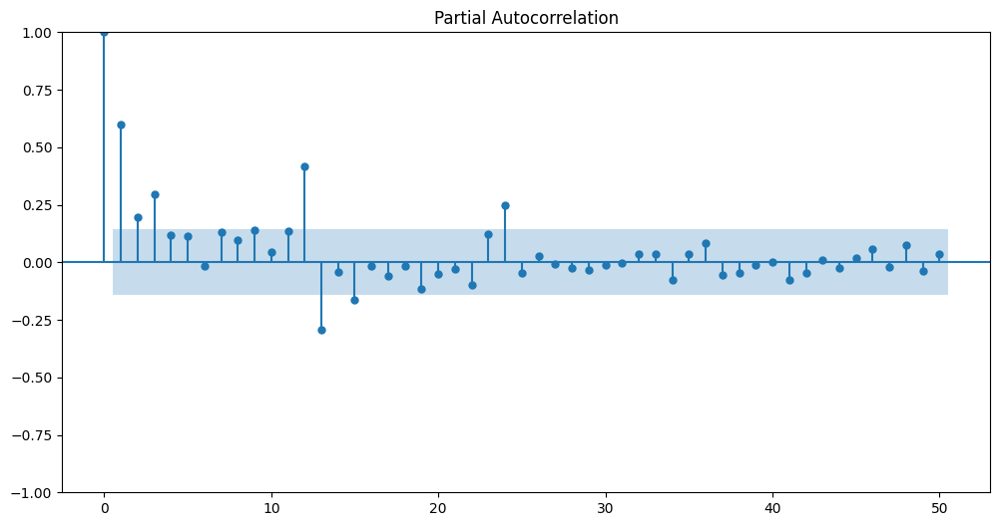

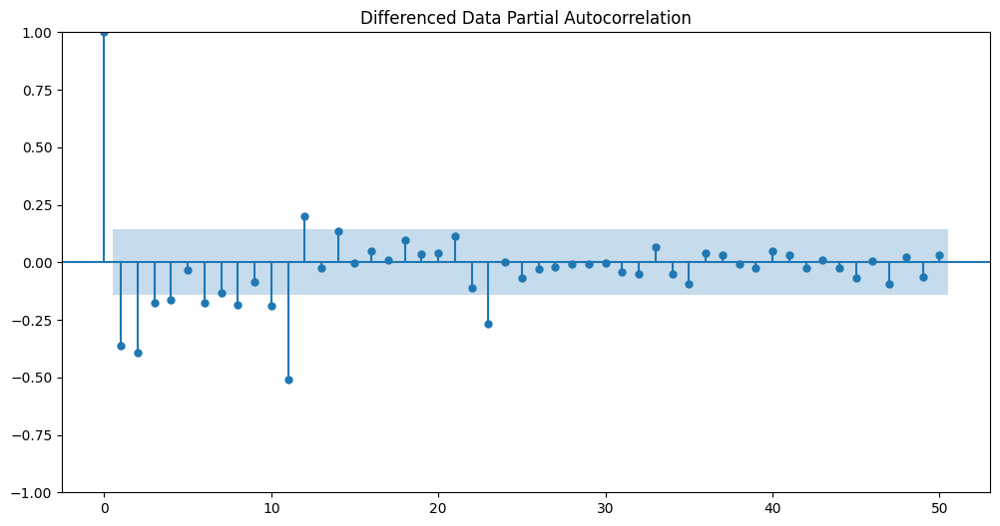

In [302]:
plot_pacf(df['Sales'],lags=50)
plot_pacf(df['Sales'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

#### Split the data into train and test and plot the training and test data.

Training Data is till the end of 1990. Test Data is from the beginning of 1991 to the last time stamp provided.

In [303]:
train = df[df.index < '1991']
test = df[df.index >= '1991']

In [304]:
from IPython.display import display

print('First few rows of Training Data')  # Display the first five rows of the training data
display(train.head())

print('Last few rows of Training Data')   # Display the Last five rows of the training data
display(train.tail())

print('First few rows of Test Data')     # Display the first five rows of the test data
display(test.head())

print('Last few rows of Test Data')      # Display the Last five rows of the test data
display(test.tail())

First few rows of Training Data


,Sales
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


Last few rows of Training Data


,Sales
YearMonth,
1990-08-01,70.0
1990-09-01,83.0
1990-10-01,65.0
1990-11-01,110.0
1990-12-01,132.0


First few rows of Test Data


,Sales
YearMonth,
1991-01-01,54.0
1991-02-01,55.0
1991-03-01,66.0
1991-04-01,65.0
1991-05-01,60.0


Last few rows of Test Data


,Sales
YearMonth,
1995-03-01,45.0
1995-04-01,52.0
1995-05-01,28.0
1995-06-01,40.0
1995-07-01,62.0


In [305]:
# Check the Shape of Data
print(train.shape)
print(test.shape)

(132, 1)
(55, 1)


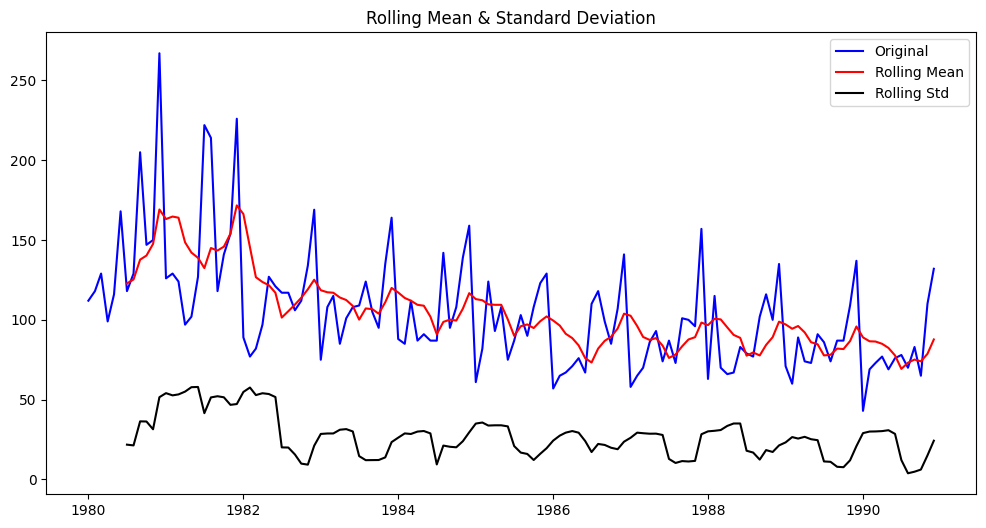

Results of Dickey-Fuller Test:
Test Statistic                  -2.164250
p-value                          0.219476
#Lags Used                      13.000000
Number of Observations Used    118.000000
Critical Value (1%)             -3.487022
Critical Value (5%)             -2.886363
Critical Value (10%)            -2.580009
dtype: float64 



In [306]:
test_stationarity(train['Sales'])  # Check the stationarity of the training data

We observe that the p-value (α) is greater than 0.05. Therefore, we fail to reject the null hypothesis. This result suggests that the time series is not stationary, meaning its statistical properties, such as mean, variance, and autocorrelation, change over time.

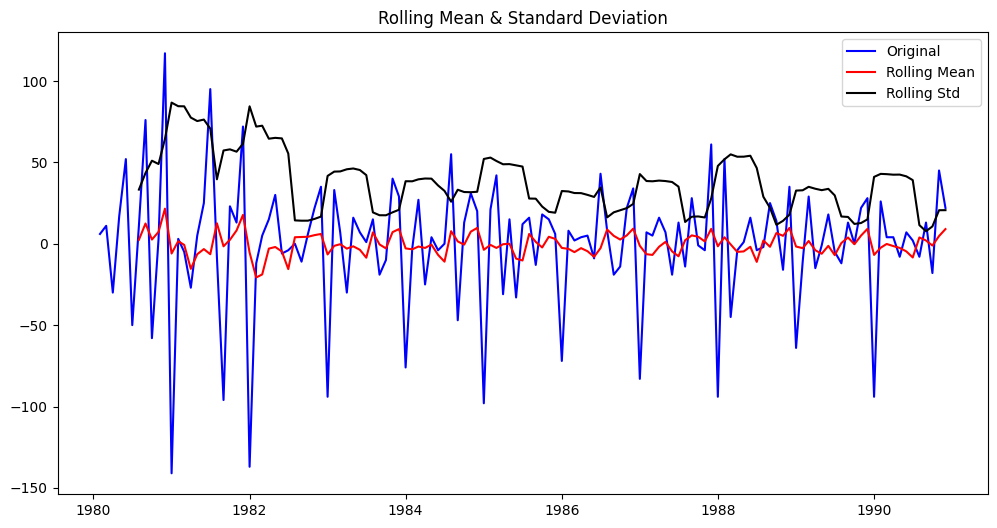

Results of Dickey-Fuller Test:
Test Statistic                -6.592372e+00
p-value                        7.061944e-09
#Lags Used                     1.200000e+01
Number of Observations Used    1.180000e+02
Critical Value (1%)           -3.487022e+00
Critical Value (5%)           -2.886363e+00
Critical Value (10%)          -2.580009e+00
dtype: float64 



In [307]:
test_stationarity(train['Sales'].diff().dropna())  # Check the stationarity of the differenced training data

We see that after taking a difference of order 1 the series have become stationary at $\alpha$ = 0.05.

#### Build an Automated version of an <font color='blue'>ARIMA model</font> for which the best parameters are selected in accordance with the lowest Akaike Information Criteria (AIC).


<font color='darkgreen'>Build the Auto ARIMA</font>

In [308]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

# Parameters for ARIMA
import itertools
p = q = range(0, 4)
d = [1]                         # d=1 to ensure stationarity
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1, len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)


In [309]:
# Creating an empty DataFrame with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [310]:
# Looping through parameter combinations to fit the ARIMA model

for param in pdq:
    ARIMA_model = ARIMA(train['Sales'], order=param).fit()    # Fit the ARIMA model
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model.aic))  # Find the AIC values
    ARIMA_AIC = pd.concat([ARIMA_AIC, pd.DataFrame([{'param': param, 'AIC': ARIMA_model.aic}])], ignore_index=True)

ARIMA(0, 1, 0) - AIC:1333.1546729124348
ARIMA(0, 1, 1) - AIC:1282.309831974832
ARIMA(0, 1, 2) - AIC:1279.6715288535784
ARIMA(0, 1, 3) - AIC:1280.545376173466
ARIMA(1, 1, 0) - AIC:1317.350310538146
ARIMA(1, 1, 1) - AIC:1280.5742295380046
ARIMA(1, 1, 2) - AIC:1279.8707234231929
ARIMA(1, 1, 3) - AIC:1281.8707223309984
ARIMA(2, 1, 0) - AIC:1298.6110341604945
ARIMA(2, 1, 1) - AIC:1281.5078621868563
ARIMA(2, 1, 2) - AIC:1281.870722226456
ARIMA(2, 1, 3) - AIC:1274.6951271827177
ARIMA(3, 1, 0) - AIC:1297.481091727167
ARIMA(3, 1, 1) - AIC:1282.4192776271927
ARIMA(3, 1, 2) - AIC:1283.7207405977094
ARIMA(3, 1, 3) - AIC:1278.6580044819445


In [311]:
# Sort the AIC values to find the best parameters
ARIMA_AIC.sort_values(by='AIC', ascending=True).head(10)

,param,AIC
11,"(2, 1, 3)",1274.695127
15,"(3, 1, 3)",1278.658004
2,"(0, 1, 2)",1279.671529
6,"(1, 1, 2)",1279.870723
3,"(0, 1, 3)",1280.545376
5,"(1, 1, 1)",1280.574230
9,"(2, 1, 1)",1281.507862
10,"(2, 1, 2)",1281.870722
7,"(1, 1, 3)",1281.870722
1,"(0, 1, 1)",1282.309832


In [312]:
from statsmodels.tsa.arima.model import ARIMA

train = train.asfreq('MS')

# Building the ARIMA model based on the best AIC values
auto_ARIMA = ARIMA(train['Sales'], order=param)

# Fit the Auto ARIMA model
results_auto_ARIMA = auto_ARIMA.fit()

# Print the summary result
print(results_auto_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  132
Model:                 ARIMA(3, 1, 3)   Log Likelihood                -632.329
Date:                Sun, 18 Aug 2024   AIC                           1278.658
Time:                        07:24:09   BIC                           1298.784
Sample:                    01-01-1980   HQIC                          1286.836
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.5838      0.088    -17.939      0.000      -1.757      -1.411
ar.L2         -0.6387      0.142     -4.497      0.000      -0.917      -0.360
ar.L3          0.1336      0.090      1.492      0.1

In [313]:
# Predict on the Test Set using this model
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test))  # Forecast using the auto ARIMA

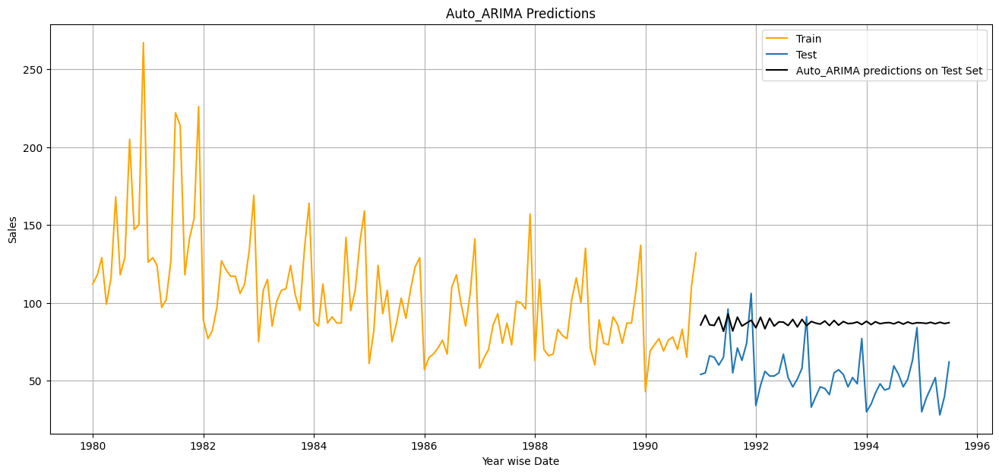

In [314]:
# Plotting on both the Training and Test data using autofit
plt.figure(figsize=(16, 7))
plt.plot(TES_train['Sales'], label='Train', color ='orange')
plt.plot(TES_test['Sales'], label='Test')

# Plot predictions made by the Auto ARIMA model
plt.plot(predicted_auto_ARIMA, label='Auto_ARIMA predictions on Test Set', color = 'black')

plt.legend(loc='best')
plt.title('Auto_ARIMA Predictions')
plt.ylabel('Sales')
plt.xlabel('Year wise Date')
plt.grid()
plt.show()

#### Diagnostics plot

<Figure size 1800x800 with 0 Axes>

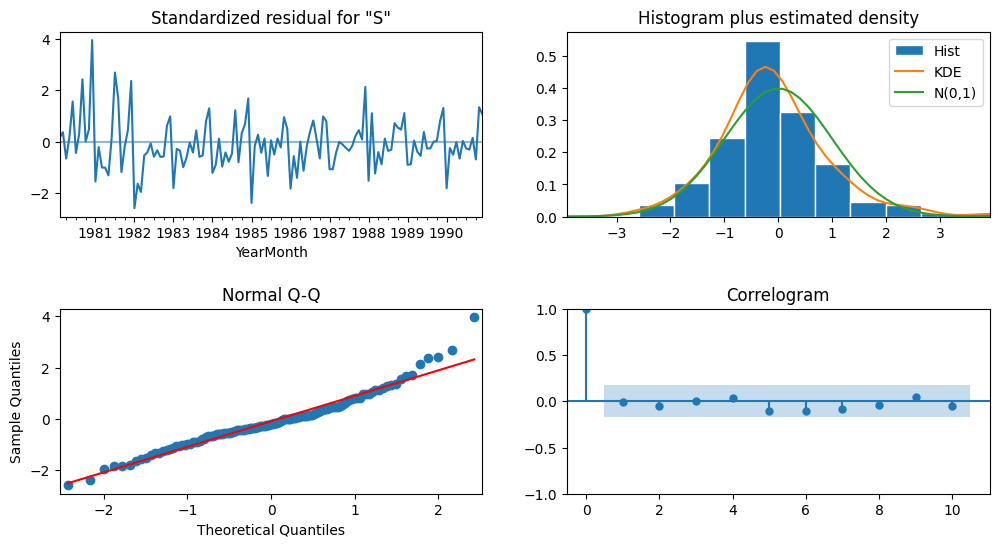

In [315]:
plt.figure(figsize=(18, 8));
results_auto_ARIMA.plot_diagnostics()
plt.subplots_adjust(hspace=0.5)  # Adjusts the height spacing between the subplots
plt.show();

In [316]:
# Calculate RMSE on test data
rmse = mean_squared_error(test['Sales'], predicted_auto_ARIMA, squared=False)
print(rmse)

36.30942762993939


In [317]:
# Assuming 'rmse' has already been calculated for the Auto ARIMA model
resultsDf_temp_1 = pd.DataFrame({'Test RMSE': [rmse]}, index=['Auto ARIMA'])

# Concatenate the new results with the existing resultsDf
resultsDf = pd.concat([resultsDf, resultsDf_temp_1])

# Display the updated DataFrame
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623
"Alpha=0.1,SimpleExponentialSmoothing",36.429535
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",36.510010
"Alpha=0.08621,Beta=1.3722,Gamma=0.4763,TrippleExponentialSmoothing_Auto_Fit",14.127706


#### <font color='red'>Build the Manual ARIMA </font>

Let us look at the ACF and the PACF plots once more.

ACF plot

---



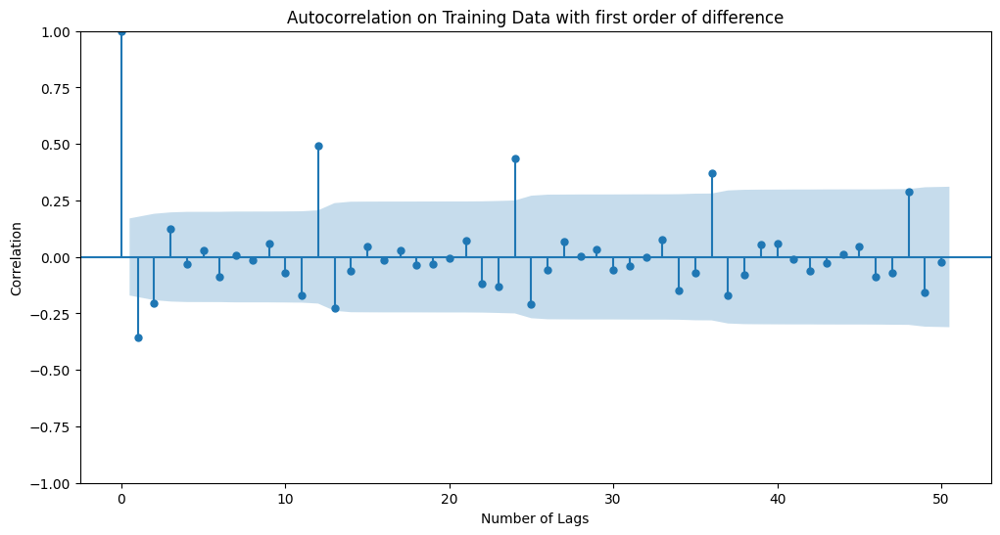

In [318]:
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

PACF plot

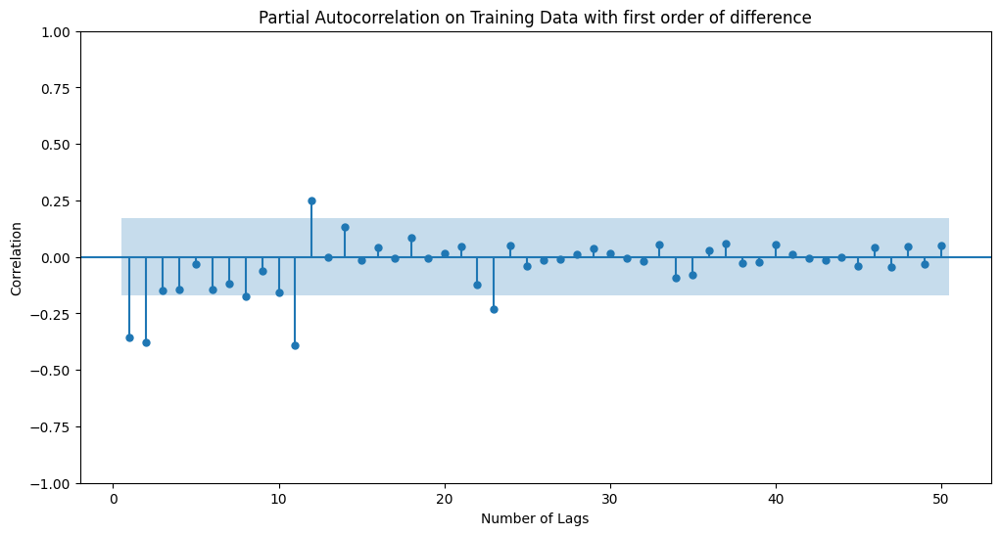

In [319]:
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,zero=False,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

Predict on the Test Set using this model and evaluate the model.
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

In [320]:
# Fit the Manual ARIMA model

manual_ARIMA = ARIMA(train['Sales'], order=(0,1,2))
results_manual_ARIMA = manual_ARIMA.fit()
print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  132
Model:                 ARIMA(0, 1, 2)   Log Likelihood                -636.836
Date:                Sun, 18 Aug 2024   AIC                           1279.672
Time:                        07:24:11   BIC                           1288.297
Sample:                    01-01-1980   HQIC                          1283.176
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6970      0.072     -9.689      0.000      -0.838      -0.556
ma.L2         -0.2042      0.073     -2.794      0.005      -0.347      -0.061
sigma2       965.8407     88.305     10.938      0.0

##### Create the diagnostic Plot for Manual ARIMA

<Figure size 1600x800 with 0 Axes>

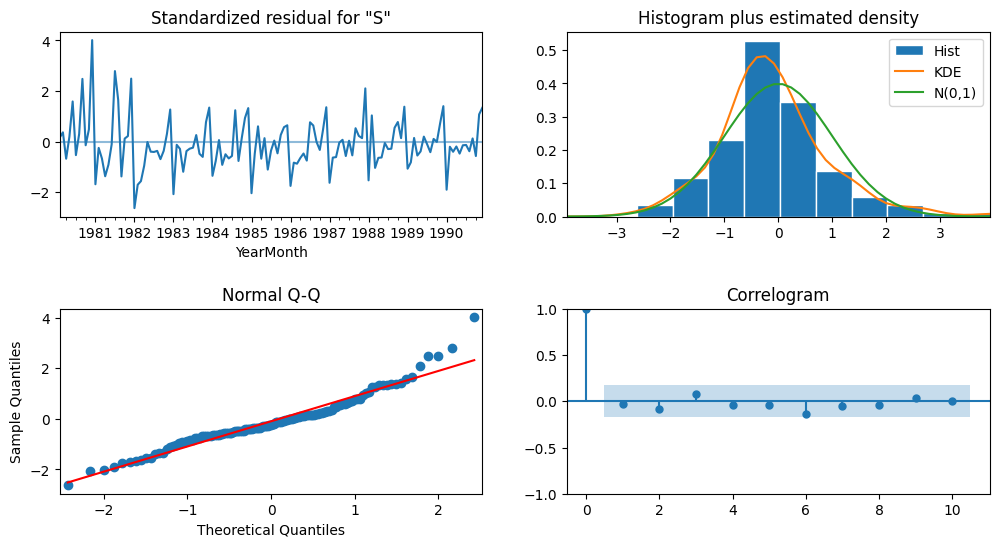

In [321]:
plt.figure(figsize=(16, 8))
results_manual_ARIMA.plot_diagnostics();
plt.subplots_adjust(hspace=0.5)  # Adjusts the height spacing between the subplots
plt.show()

Predict on the Test Set using this model and evaluate the model.

In [322]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

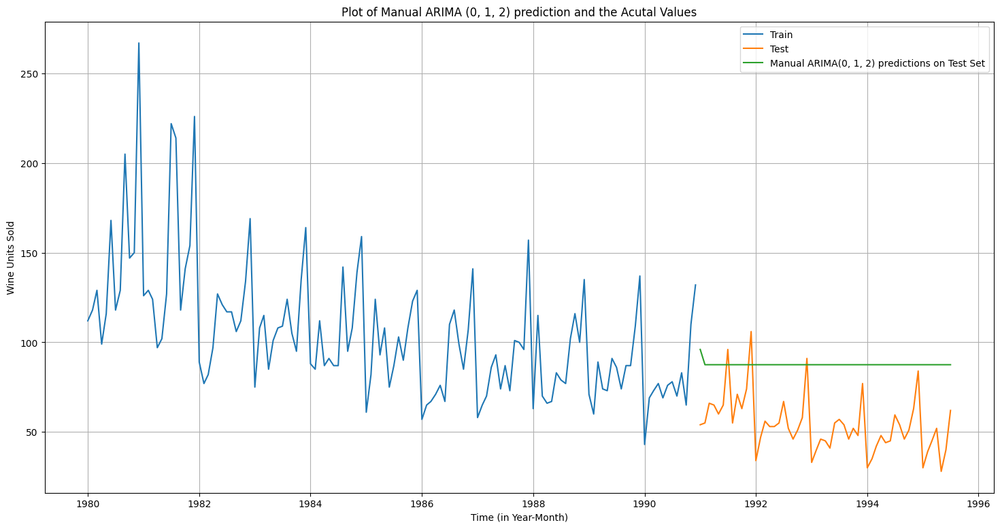

In [323]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA(0, 1, 2) predictions on Test Set')

plt.legend(loc='best')
plt.title('Plot of Manual ARIMA (0, 1, 2) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

In [324]:
rmse = mean_squared_error(test['Sales'],predicted_manual_ARIMA,squared=False)
print('RMSE:',rmse)

RMSE: 36.90921366109911


In [325]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['Manual ARIMA(0,1,2)'])

resultsDf = pd.concat([resultsDf, temp_resultsDf])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623
"Alpha=0.1,SimpleExponentialSmoothing",36.429535
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",36.510010
"Alpha=0.08621,Beta=1.3722,Gamma=0.4763,TrippleExponentialSmoothing_Auto_Fit",14.127706


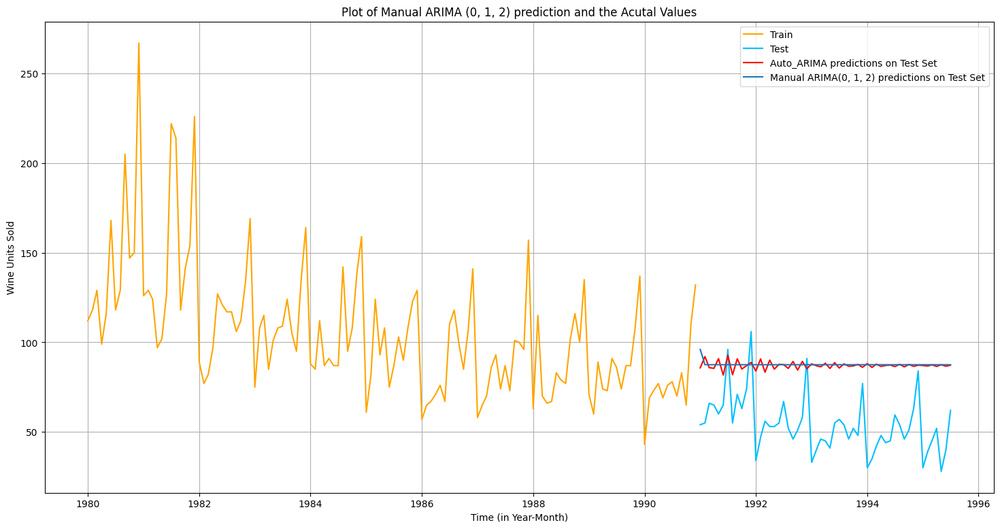

In [326]:
# Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sales'], label='Train', color='orange')
plt.plot(test['Sales'], label='Test',color='deepskyblue')
plt.plot(predicted_auto_ARIMA, label='Auto_ARIMA predictions on Test Set',color='red')
plt.plot(predicted_manual_ARIMA, label='Manual ARIMA(0, 1, 2) predictions on Test Set')
plt.legend(loc='best')
plt.title('Plot of Manual ARIMA (0, 1, 2) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

#### <font color='Green'>Build the Auto SARIMA </font>

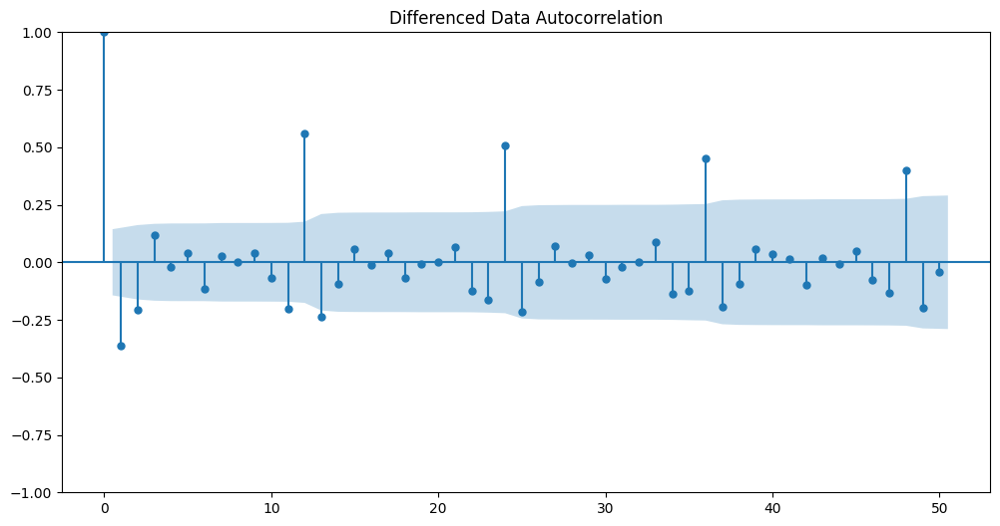

In [327]:
plot_acf(df['Sales'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.show()

In [328]:
import itertools
import statsmodels.api as sm
import pandas as pd


# Define the range of p, d, q, and seasonal parameters
p = q = range(0, 4)
d = [1]
D = range(0, 1)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]

# Print some parameter combinations for SARIMA
print('Examples of some parameter combinations for the Model...')
for i in range(1, len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))


Examples of some parameter combinations for the Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [329]:
# Create an empty DataFrame to store AIC values
SARIMA_AIC = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])


In [330]:
# Loop through all parameter combinations
for param in pdq:
    for param_seasonal in model_pdq:
        try:
            # Fit the SARIMA model
            SARIMA_model = sm.tsa.statespace.SARIMAX(
                train['Sales'],
                order=param,
                seasonal_order=param_seasonal,
                enforce_stationarity=False,
                enforce_invertibility=False
            ).fit(disp=False)

            # Store the AIC value in the DataFrame
            SARIMA_AIC = pd.concat([
                SARIMA_AIC,
                pd.DataFrame({'param': [param], 'seasonal': [param_seasonal], 'AIC': [SARIMA_model.aic]})
            ], ignore_index=True)

            print(f"SARIMA{param}x{param_seasonal} - AIC: {SARIMA_model.aic}")

        except Exception as e:
            print(f"SARIMA{param}x{param_seasonal} - Failed: {e}")
            continue

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC: 1323.9657875279158
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC: 1145.4230827207298
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC: 976.4375296380895
SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC: 3537.579168905919
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC: 1139.921738995602
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC: 1116.0207869386172
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC: 969.691363575225
SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC: 4554.32909051064
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC: 960.8812220353041
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC: 962.8794540697556
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC: 955.5735408945757
SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC: 4397.822817992214
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC: 850.7535403931095
SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC: 851.7482702748039
SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC: 850.53041361288
SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC: 3467.855628476979
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC: 1263.5369097383966
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC: 1098.5554825918337
SARIMA(0,

In [331]:
# Sort by AIC to find the best parameters
SARIMA_AIC = SARIMA_AIC.sort_values(by='AIC', ascending=True)
print(SARIMA_AIC.head())

         param       seasonal         AIC
222  (3, 1, 1)  (3, 0, 2, 12)  774.400287
238  (3, 1, 2)  (3, 0, 2, 12)  774.894960
220  (3, 1, 1)  (3, 0, 0, 12)  775.426699
221  (3, 1, 1)  (3, 0, 1, 12)  775.495330
252  (3, 1, 3)  (3, 0, 0, 12)  775.561018


In [332]:
import statsmodels.api as sm

auto_SARIMA = sm.tsa.statespace.SARIMAX(train['Sales'].values,
                                order=param,
                                seasonal_order=param_seasonal,
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA = auto_SARIMA.fit(maxiter=1000)
print(results_auto_SARIMA.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(3, 1, 3)x(3, 0, 3, 12)   Log Likelihood               -1911.627
Date:                            Sun, 18 Aug 2024   AIC                           3849.255
Time:                                    07:30:42   BIC                           3881.896
Sample:                                         0   HQIC                          3862.423
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7770         -0        inf      0.000      -0.777      -0.777
ar.L2         -0.1311         -0   

<Figure size 1600x800 with 0 Axes>

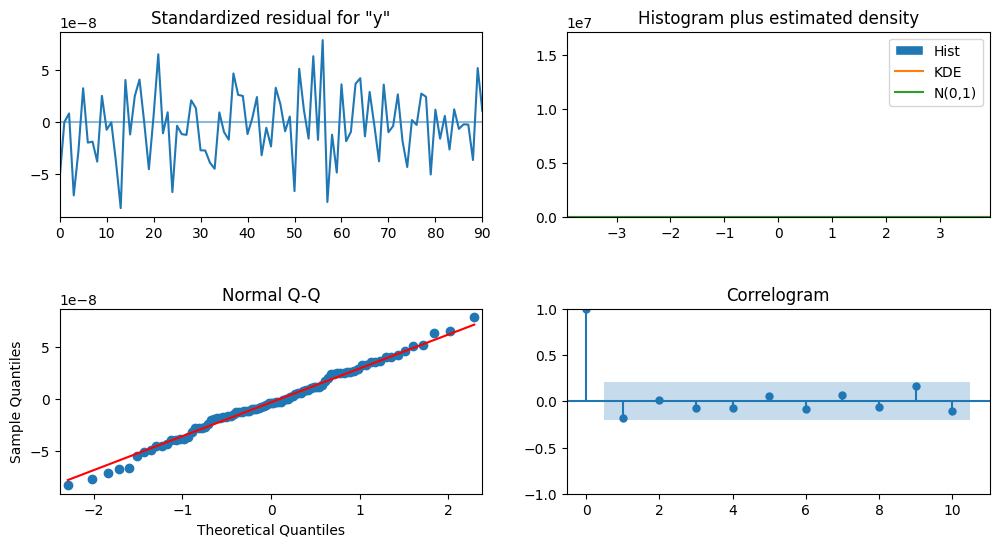

In [333]:
plt.figure(figsize=(16, 8))
results_auto_SARIMA.plot_diagnostics();
plt.subplots_adjust(hspace=0.5)  # Adjusts the height spacing between the subplots
plt.show();

In [334]:
# Generate predictions on the test set
predictions_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(test))

# Extract the predicted mean values
predicted_mean = predictions_auto_SARIMA.predicted_mean

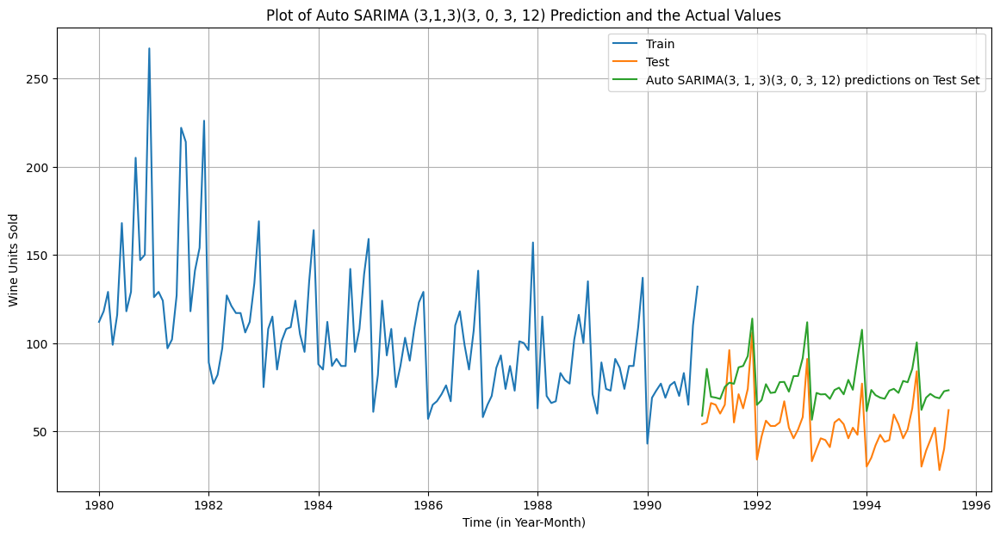

In [335]:
# Plotting on both the Training and Test data

plt.figure(figsize=(14, 7))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(test.index, predicted_mean, label='Auto SARIMA(3, 1, 3)(3, 0, 3, 12) predictions on Test Set')
plt.legend(loc='best')
plt.title('Plot of Auto SARIMA (3,1,3)(3, 0, 3, 12) Prediction and the Actual Values')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid()
plt.show()

#### Predict on the Test Set using this model and Evaluate the model.

In [336]:
rmse = mean_squared_error(test['Sales'], predictions_auto_SARIMA.predicted_mean,squared=False)
print('RMSE:',rmse)

RMSE: 24.615886853688487


In [337]:
temp_resultsDf_AS  = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['Auto_SARIMA(3,1,3)(3, 0, 3, 12)'])

resultsDf = pd.concat([resultsDf, temp_resultsDf_AS ])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623
"Alpha=0.1,SimpleExponentialSmoothing",36.429535
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",36.510010
"Alpha=0.08621,Beta=1.3722,Gamma=0.4763,TrippleExponentialSmoothing_Auto_Fit",14.127706


#### Manual SARIMA Model

Let us look at the ACF and the PACF plots once more.

ACF plot

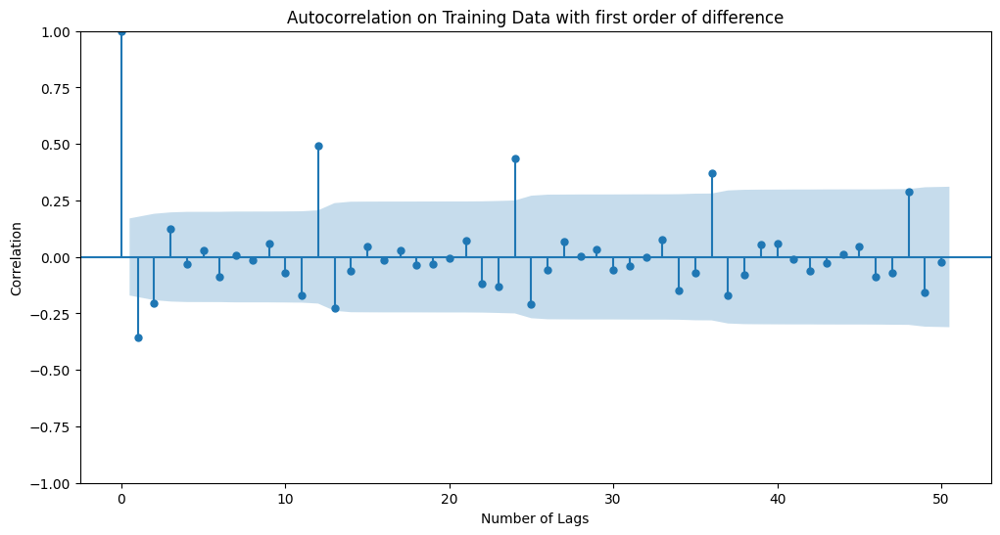

In [338]:
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

PACF plot

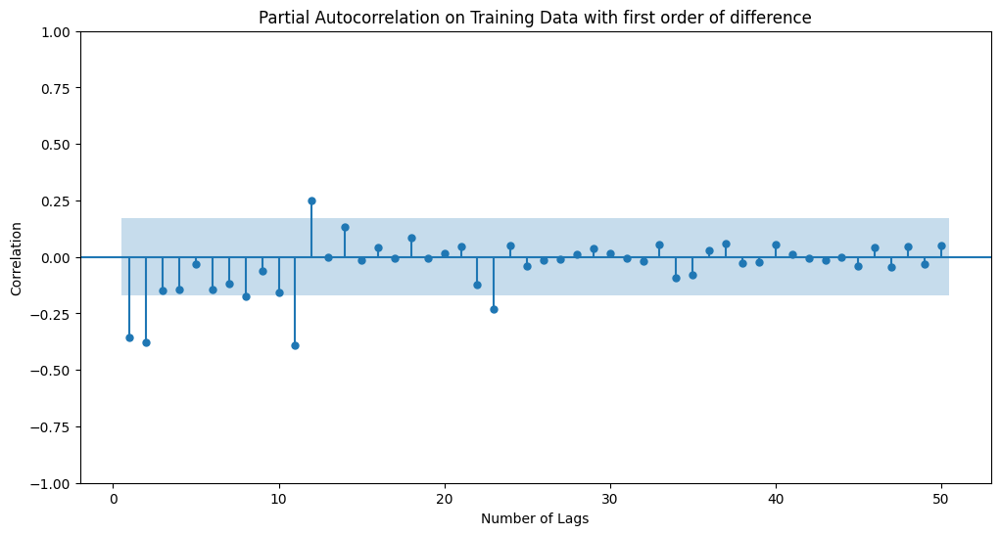

In [339]:
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,zero=False,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

In [340]:
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])  # Create an empty DataFrame to store AIC values
SARIMA_AIC


,param,seasonal,AIC


In [341]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(train['Sales'].values,
                                order=(3, 1, 2),
                                seasonal_order=(3, 0, 2, 12),
                                enforc1e_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(3, 1, 2)x(3, 0, 2, 12)   Log Likelihood                -595.323
Date:                            Sun, 18 Aug 2024   AIC                           1212.645
Time:                                    07:30:55   BIC                           1244.272
Sample:                                         0   HQIC                          1225.497
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8496      3.077     -0.276      0.782      -6.881       5.182
ar.L2         -0.0275      0.484   

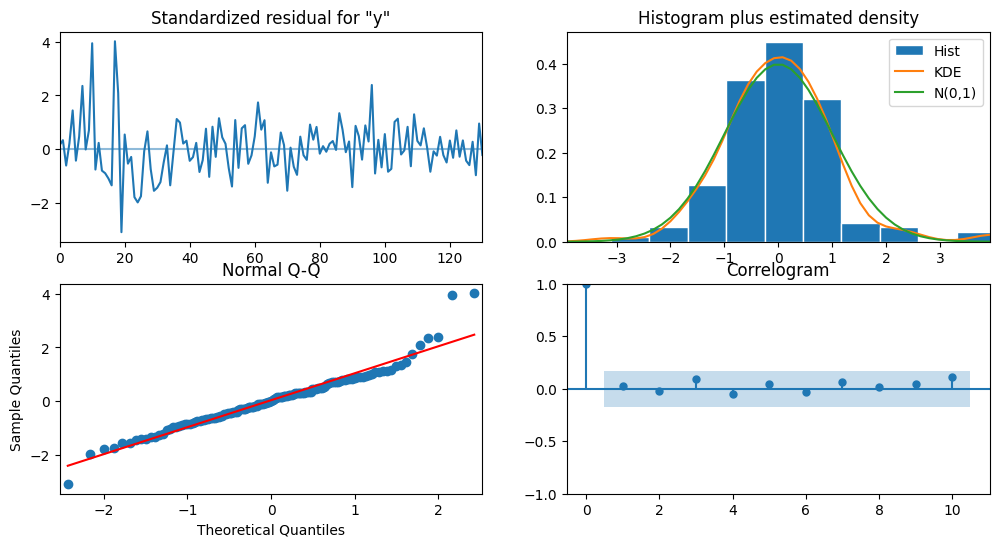

In [342]:
results_manual_SARIMA.plot_diagnostics()   # Create the diagnostics plot of Manual SARIMA
plt.show()

In [343]:
# Generate predictions on the test set
predicted_manual_SARIMA_6 = results_manual_SARIMA.get_forecast(steps=len(test))
predicted_manual_SARIMA_6.summary_frame(alpha=0.05).head()

# Extract the predicted mean values
predicted_mean_1 = predicted_manual_SARIMA_6.predicted_mean

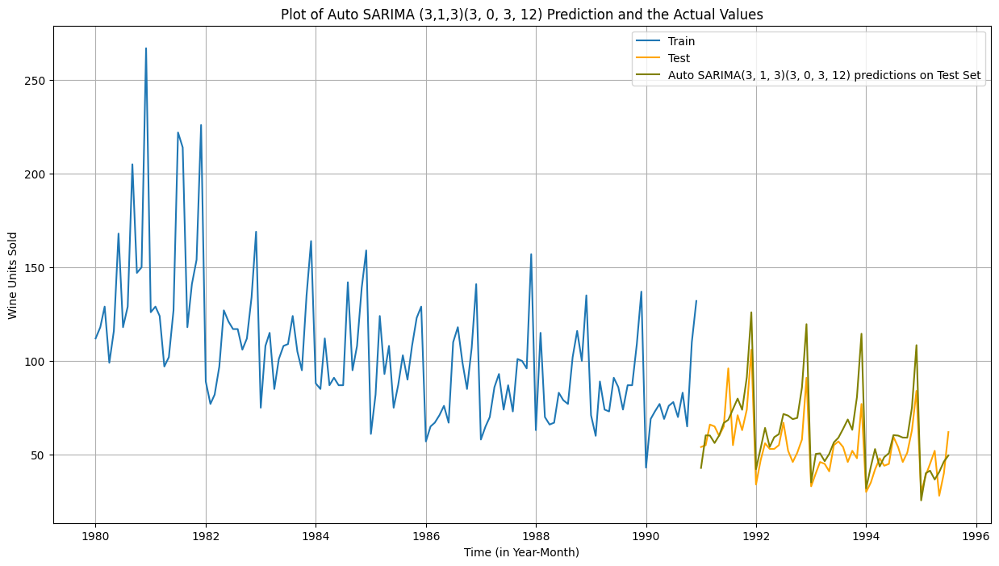

In [344]:
# Plotting on both the Training and Test data

plt.figure(figsize=(15, 8))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test', color='orange')
plt.plot(test.index, predicted_mean_1, color='olive',label='Auto SARIMA(3, 1, 3)(3, 0, 3, 12) predictions on Test Set')
plt.legend(loc='best')
plt.title('Plot of Auto SARIMA (3,1,3)(3, 0, 3, 12) Prediction and the Actual Values')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid()
plt.show()

In [345]:
# Calculate RMSE on test data
rmse_manual_sarima = mean_squared_error(test['Sales'],predicted_mean_1, squared=False)
print(rmse_manual_sarima)

13.963901796173486


In [346]:
# Add into the DataFrame with the results
resultsDf_10_1 = pd.DataFrame({'Test RMSE': rmse_manual_sarima}
                           ,index=['Manual_SARIMA(3, 1, 2)(3, 0, 2, 12)'])

resultsDf = pd.concat([resultsDf, resultsDf_10_1])
resultsDf

,Test RMSE
RegressionOnTime,15.278158
Simple Average Model,53.049755
2pointTrailingMovingAverage,11.589082
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
"Alpha = 0.12362, SimpleExponentialSmoothing",37.192623
"Alpha=0.1,SimpleExponentialSmoothing",36.429535
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",36.510010
"Alpha=0.08621,Beta=1.3722,Gamma=0.4763,TrippleExponentialSmoothing_Auto_Fit",14.127706


## Compare the performance of all the models built

#### Sort the DataFrame by RMSE in ascending order for ALL created Model

In [347]:
resultsDf = resultsDf.sort_values(by=['Test RMSE'],ascending=True)
resultsDf

,Test RMSE
"Alpha=0.2,Beta=0.7,Gamma=0.2,TripleExponentialSmoothing",8.992350
2pointTrailingMovingAverage,11.589082
"Manual_SARIMA(3, 1, 2)(3, 0, 2, 12)",13.963902
"Alpha=0.08621,Beta=1.3722,Gamma=0.4763,TrippleExponentialSmoothing_Auto_Fit",14.127706
4pointTrailingMovingAverage,14.506190
6pointTrailingMovingAverage,14.558008
9pointTrailingMovingAverage,14.797139
RegressionOnTime,15.278158
"Auto_SARIMA(3,1,3)(3, 0, 3, 12)",24.615887
Auto ARIMA,36.309428


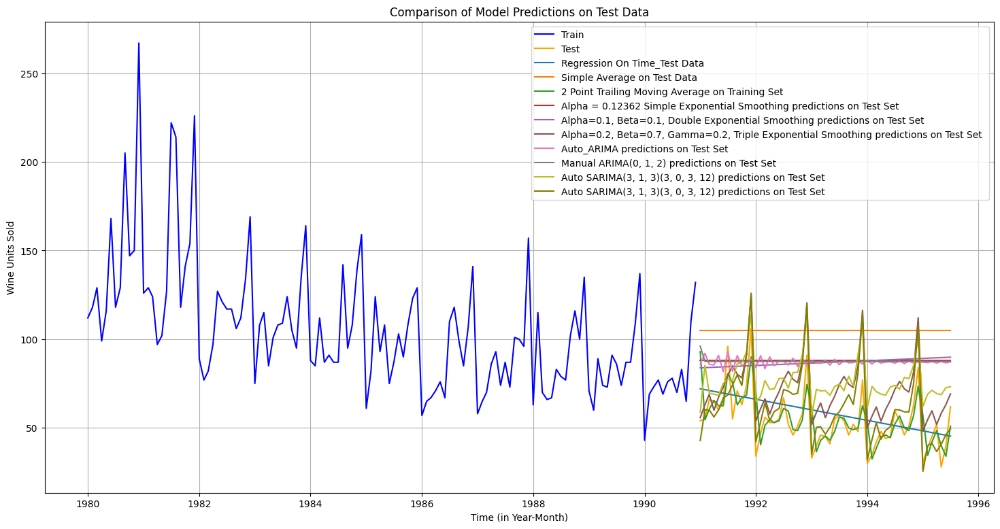

In [348]:
# Set the Figure Size
plt.figure(figsize=(18, 9))

# Plot Train and Test Data
plt.plot(train['Sales'], label='Train', color='blue')
plt.plot(test['Sales'], label='Test', color='orange')

# Plot Various Model Predictions

plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time_Test Data')

plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on Test Data')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')

plt.plot(SES_test['predict'], label='Alpha = 0.12362 Simple Exponential Smoothing predictions on Test Set')

plt.plot(DES_test['predict_0.1_0.1'], label='Alpha=0.1, Beta=0.1, Double Exponential Smoothing predictions on Test Set')

plt.plot(TES_test['predict_tm_sm'], label='Alpha=0.2, Beta=0.7, Gamma=0.2, Triple Exponential Smoothing predictions on Test Set ')

plt.plot(predicted_auto_ARIMA, label='Auto_ARIMA predictions on Test Set')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA(0, 1, 2) predictions on Test Set')

plt.plot(test.index, predicted_mean, label='Auto SARIMA(3, 1, 3)(3, 0, 3, 12) predictions on Test Set')

plt.plot(test.index, predicted_mean_1, color='olive',label='Auto SARIMA(3, 1, 3)(3, 0, 3, 12) predictions on Test Set')


# Add legend, title, and labels
plt.legend(loc='best')
plt.title('Comparison of Model Predictions on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid()
plt.show()



##### Analysis Summary
After evaluating various time series forecasting models, the model that exhibited the best performance is the Triple Exponential Smoothing model with parameters Alpha=0.2, Beta=0.7, and Gamma=0.2. This model achieved the lowest Root Mean Square Error (RMSE) of 8.99.




##### Best Model
The Triple Exponential Smoothing (Alpha=0.2, Beta=0.7, Gamma=0.2) model demonstrated superior accuracy in predicting the dataset, outperforming other models such as Auto ARIMA, Manual ARIMA, and various moving average techniques. The low RMSE value indicates that this model has the best fit, making it the most reliable choice for forecasting in this context.

#### Rebuild the best model using the entire data - Make a forecast for the next 12 months

In [349]:
# Set the frequency to monthly (or whatever is appropriate for your data)
df = df.asfreq('MS')

# Fit the Triple Exponential Smoothing model on the entire dataset
model_TES_full = ExponentialSmoothing(
    df['Sales'],
    trend='multiplicative',
    seasonal='multiplicative',
    seasonal_periods=12
)

In [350]:
# Set the parameters Alpha, Beta, and Gamma
alpha = 0.2
beta = 0.7
gamma = 0.2

In [351]:
# Fit the model
model_TES_fitted = model_TES_full.fit(
    smoothing_level=alpha,
    smoothing_slope=beta,
    smoothing_seasonal=gamma,
    optimized=False,
    use_brute=True
)

In [352]:
# Forecast the next 12 months
forecast = model_TES_fitted.forecast(steps=12)
print(forecast)

1995-08-01    37.765009
1995-09-01    35.565255
1995-10-01    35.942844
1995-11-01    41.159755
1995-12-01    56.859748
1996-01-01    21.698798
1996-02-01    27.087773
1996-03-01    31.374379
1996-04-01    32.198521
1996-05-01    27.023700
1996-06-01    30.422915
1996-07-01    33.927989
Freq: MS, dtype: float64


In [353]:
# Calculate confidence intervals (95% confidence interval as an example)
forecast_std_error = np.std(model_TES_fitted.resid, ddof=1)
confidence_interval = 1.96 * forecast_std_error  # 95% confidence interval

lower_bound = forecast - confidence_interval
upper_bound = forecast + confidence_interval

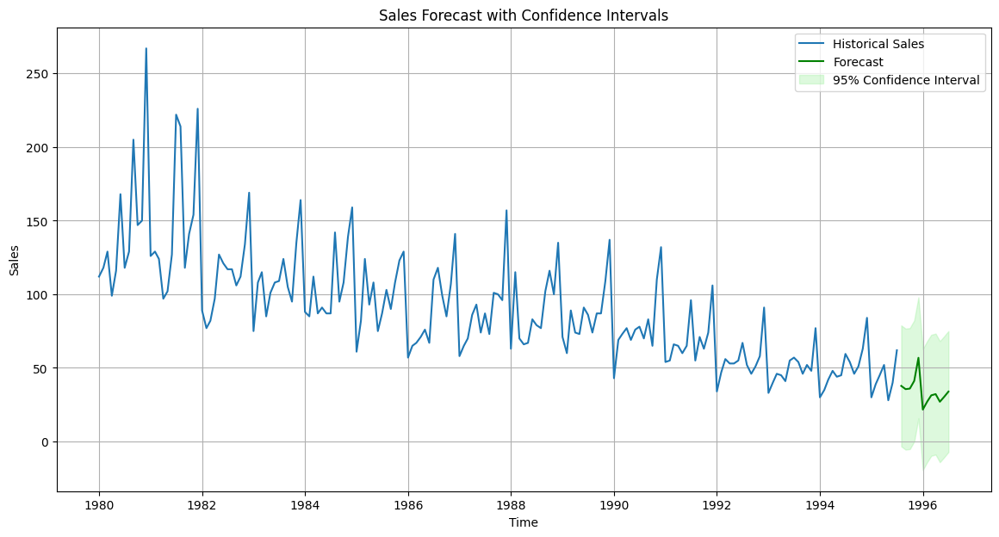

In [354]:
# Plotting the forecast with confidence intervals
plt.figure(figsize=(14, 7))
plt.plot(df['Sales'], label='Historical Sales')
plt.plot(forecast, label='Forecast', color='green')

# Plot the confidence intervals
plt.fill_between(
    forecast.index,
    lower_bound,
    upper_bound,
    color='lightgreen',
    alpha=0.3,
    label='95% Confidence Interval'
)

plt.title('Sales Forecast with Confidence Intervals')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend(loc='best')
plt.grid(True)

plt.show()

In [358]:
import plotly.graph_objects as go

# Initialize the figure
fig = go.Figure()

# Plot the historical sales
fig.add_trace(go.Scatter(
    x=df_1.index,
    y=df['Sales'],
    mode='lines',
    name='Historical Sales'
))

# Plot the forecast
fig.add_trace(go.Scatter(
    x=forecast.index,
    y=forecast,
    mode='lines',
    name='Forecast',
    line=dict(color='green')
))

# Plot the confidence intervals
fig.add_trace(go.Scatter(
    x=forecast.index.tolist() + forecast.index.tolist()[::-1],
    y=lower_bound.tolist() + upper_bound.tolist()[::-1],
    fill='toself',
    fillcolor='lightgreen',
    line=dict(color='lightgreen'),
    opacity=0.4,
    name='95% Confidence Interval'
))

# Customize the layout
fig.update_layout(
    title='Sales Forecast with Confidence Intervals',
    xaxis_title='Time (in Year-Month)',
    yaxis_title='Wine Units Sold',
    legend_title='Legend',
    hovermode="x unified",
    width=1250,
    height=700
)

# Add a grid
fig.update_xaxes(showgrid=True)
fig.update_yaxes(showgrid=True)

# Show the plot
fig.show()


In [359]:
# Combine the forecast data with confidence intervals into a single DataFrame
forecast_df = pd.DataFrame({
    'Forecast': forecast,
    'Lower Bound': lower_bound,
    'Upper Bound': upper_bound
})

# Convert the index to a more readable format (e.g., YYYY-MM)
forecast_df.index = forecast_df.index.strftime('%Y-%m')

# Display the data month-wise
print(forecast_df)


          Forecast  Lower Bound  Upper Bound
1995-08  37.765009    -3.324099    78.854118
1995-09  35.565255    -5.523853    76.654364
1995-10  35.942844    -5.146265    77.031953
1995-11  41.159755     0.070647    82.248864
1995-12  56.859748    15.770639    97.948857
1996-01  21.698798   -19.390311    62.787907
1996-02  27.087773   -14.001335    68.176882
1996-03  31.374379    -9.714730    72.463488
1996-04  32.198521    -8.890588    73.287630
1996-05  27.023700   -14.065409    68.112809
1996-06  30.422915   -10.666194    71.512023
1996-07  33.927989    -7.161120    75.017097


In [360]:
import plotly.graph_objects as go

# Filter the forecast data to only include August 1995 to July 1996
forecast_filtered = forecast['1995-08-01':'1996-07-31']
lower_bound_filtered = lower_bound['1995-08-01':'1996-07-31']
upper_bound_filtered = upper_bound['1995-08-01':'1996-07-31']

# Initialize the figure
fig = go.Figure()

# Plot the filtered forecast
fig.add_trace(go.Scatter(
    x=forecast_filtered.index,
    y=forecast_filtered,
    mode='lines+markers',
    name='Forecast',
    line=dict(color='seagreen')
))

# Plot the confidence intervals for the filtered data
fig.add_trace(go.Scatter(
    x=forecast_filtered.index.tolist() + forecast_filtered.index.tolist()[::-1],
    y=lower_bound_filtered.tolist() + upper_bound_filtered.tolist()[::-1],
    fill='toself',
    fillcolor='lightgreen',
    line=dict(color='lightblue'),
    opacity=0.4,
    name='95% Confidence Interval'
))

# Customize the layout
fig.update_layout(
    title='Sales Forecast with Confidence Intervals (Aug 1995 - Jul 1996)',
    xaxis_title='Month',
    yaxis_title='Wine Units Sold',
    legend_title='Legend',
    hovermode="x unified",
    width=1300,
    height=700,
)

# Ensure that the x-axis displays month-wise ticks
fig.update_xaxes(
    tickmode='array',
    tickvals=forecast_filtered.index,
    ticktext=[date.strftime('%b-%Y') for date in forecast_filtered.index]
)

# Add a grid
fig.update_xaxes(showgrid=True)
fig.update_yaxes(showgrid=True)

# Show the plot
fig.show()


**Forecast:** The predicted sales values for the next 12 months.

**Confidence Intervals:** The range within which the actual values are expected to fall with 95% confidence. The confidence intervals are calculated as the forecasted values ± 1.96 times the standard error of the residuals.

**Plot:** This shows the historical sales data, the forecasted sales, and the shaded area representing the confidence intervals.

## Actionable Insights & Recommendations

Conclude with the key takeaways (actionable insights and recommendations) for the business

#### Key Findings

* Seasonal Pattern: The sales data exhibits a clear seasonal pattern with higher sales during the holiday season (November-December) and a subsequent decline in January.

* Moderate Growth: Overall, the forecast indicates a moderate growth trend in wine sales throughout the year.

* Forecast Uncertainty: The confidence intervals suggest a degree of uncertainty in the forecast, particularly during the peak and off-peak seasons.

### Conclusion Based on the Analysis:

* Sales Performance: The historical data shows volatility in sales, with significant spikes followed by declines. The forecasted trend suggests that future sales are likely to be more stable but at a lower level compared to earlier highs.

* Strategic Insights: ABC Estate Wines may need to investigate the factors behind the earlier peaks in sales to understand what drove higher demand during those periods. Additionally, understanding the causes of the subsequent decline could help in developing strategies to boost future sales.

* Forecast Confidence: The relatively narrow confidence intervals suggest that the forecast is reliable, but the downward trend indicates a need for intervention if the company wishes to see growth.


### Recommendations:

* Market Analysis: Further analysis into market conditions, consumer preferences, and competitive factors during the periods of peak sales could provide insights into how to replicate past successes.

* Promotional Strategies: Considering targeted marketing and promotional efforts to re-ignite interest in this wine variety could help to reverse the downward trend in sales.

* New Opportunities: Exploring new markets or introducing innovative products may also provide avenues for growth.


In summary, the forecast suggests stable but subdued sales in the near future, prompting a need for strategic actions to enhance performance and capitalize on potential market opportunities.

### Conclusion

By carefully analyzing the sales forecast and identifying key trends, businesses can implement strategic initiatives to optimize operations, increase sales, and mitigate risks. A data-driven approach, coupled with a deep understanding of customer behavior and market dynamics, will be instrumental in achieving sustained growth and profitability.

**To further enhance decision-making, consider conducting a more in-depth analysis of:**

* Customer behavior: Identify factors influencing purchasing decisions and preferences.

* Competitive landscape: Analyze competitor strategies and market share.

*Economic indicators: Assess the impact of economic factors on sales.

By incorporating these additional insights, businesses can refine their strategies and gain a competitive advantage.

# **END**

# **Time Series Forecasting Project - 2**

**Context**

As an analyst at ABC Estate Wines, we are presented with historical data encompassing the sales of different types of wines throughout the 20th century. These datasets originate from the same company but represent sales figures for distinct wine varieties. Our objective is to delve into the data, analyze trends, patterns, and factors influencing wine sales over the course of the century. By leveraging data analytics and forecasting techniques, we aim to gain actionable insights that can inform strategic decision-making and optimize sales strategies for the future.

---

**Objective**

The primary objective of this project is to analyze and forecast wine sales trends for the 20th century based on historical data provided by ABC Estate Wines. We aim to equip ABC Estate Wines with the necessary insights and foresight to enhance sales performance, capitalize on emerging market opportunities, and maintain a competitive edge in the wine industry.


##### Import the Libraries

In [3]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Command to tell Python to actually display the graphs
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.linear_model import LinearRegression
from sklearn import metrics
import statsmodels.api as sm
from  IPython.display import display
from  pylab import rcParams
import statsmodels.tools.eval_measures as em
from sklearn.metrics import  mean_squared_error
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

import pmdarima as pm
from pmdarima import model_selection

import itertools

##### Load the data into DataFrame

In [4]:
df_1 = pd.read_csv('Sparkling.csv', parse_dates=True,index_col='YearMonth')

## Define the problem and perform Exploratory Data Analysis

##### Check the Shape of Data

In [5]:
df_1.shape

(187, 1)

#### Check the data type and columns details

In [6]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Sparkling  187 non-null    int64
dtypes: int64(1)
memory usage: 2.9 KB


##### Check the Top 5 and Last 5 rows details.

In [7]:
print('Top 5 Rows in dataset \n', df_1.head(),'\n')
print('Last 5 Rows in dataset \n', df_1.tail())

Top 5 Rows in dataset 
             Sparkling
YearMonth            
1980-01-01       1686
1980-02-01       1591
1980-03-01       2304
1980-04-01       1712
1980-05-01       1471 

Last 5 Rows in dataset 
             Sparkling
YearMonth            
1995-03-01       1897
1995-04-01       1862
1995-05-01       1670
1995-06-01       1688
1995-07-01       2031


#### Plot the graph

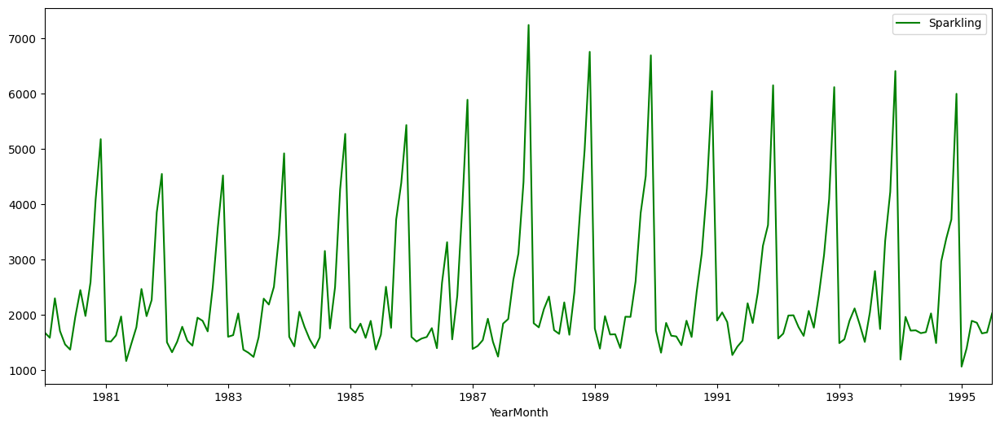

In [8]:
rcParams['figure.figsize'] = 15,6
df_1.plot(color='green')
plt.show()

Plot a boxplot to understand the spread of sales across different years and within different months across years.

#### Yearly Boxplot

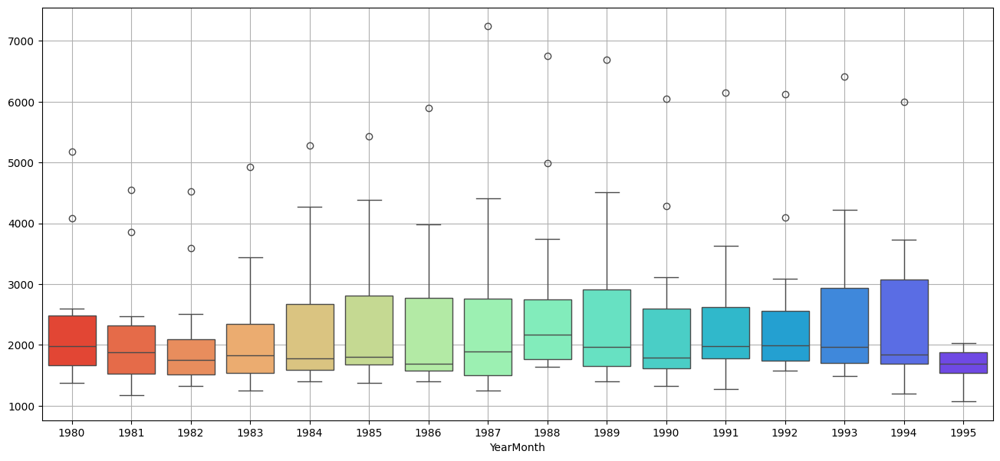

In [9]:
_, ax = plt.subplots(figsize=(16,7))
sns.boxplot(x = df_1.index.year, y = df_1.values[:,0], ax=ax, palette='rainbow_r')
plt.grid();
plt.show();

#### Monthly Boxplot

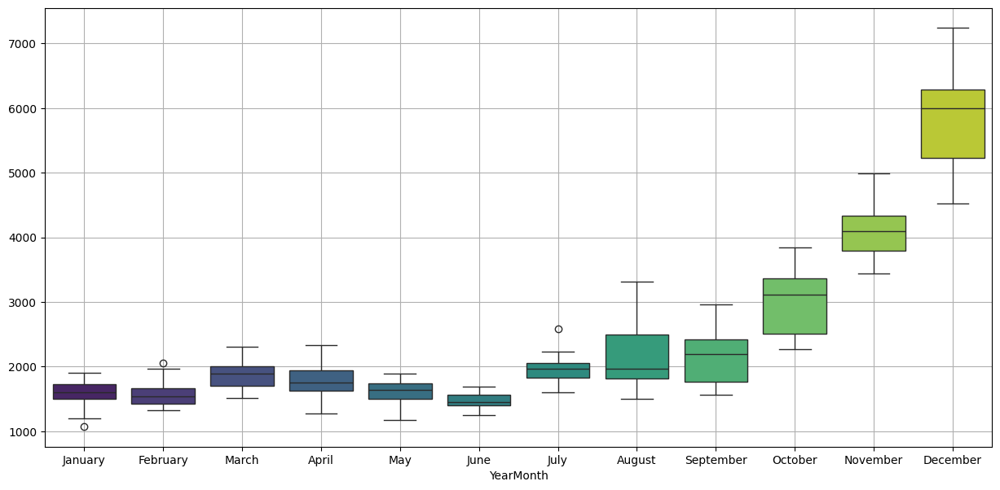

In [10]:
_, ax = plt.subplots(figsize=(15,7))
sns.boxplot(x = df_1.index.month_name(),y = df_1.values[:,0],ax=ax, palette='viridis')
plt.grid();

#### Convert into Date and Month

In [11]:
df_1['Month'] = df_1.index.month
df_1['Year'] = df_1.index.year
df_1.head()

,Sparkling,Month,Year
YearMonth,,,
1980-01-01,1686,1,1980
1980-02-01,1591,2,1980
1980-03-01,2304,3,1980
1980-04-01,1712,4,1980
1980-05-01,1471,5,1980


##### Check the Missing Value

In [12]:
df_1.isna().sum()

,0
Sparkling,0
Month,0
Year,0


#### Plot the Data after Treating



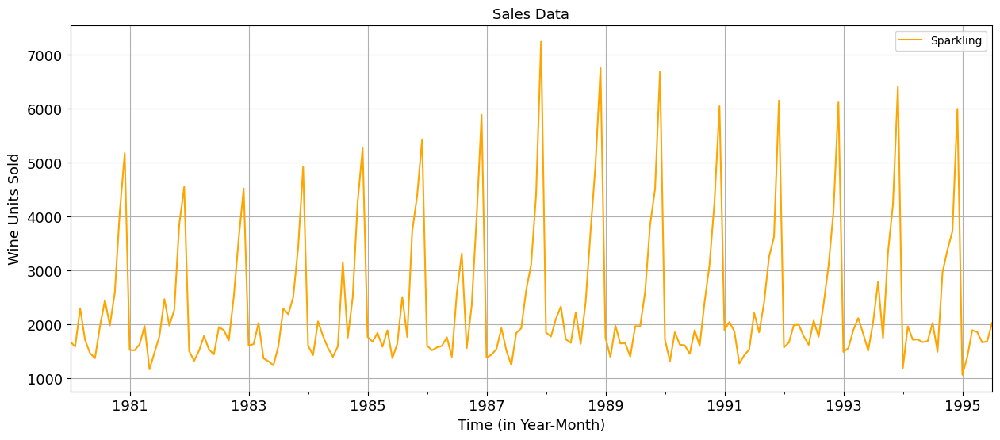

In [13]:
df_1['Sparkling'].plot(color='orange', figsize=(15,6), grid=True, title='Sales', fontsize=13, legend=True)
plt.xlabel('Time (in Year-Month)', fontsize=13)
plt.ylabel('Wine Units Sold', fontsize=13)
plt.title('Sales Data', fontsize=13)
plt.show()

### Trend Analysis

* Upward Trend: The overall direction of the data is upward, indicating an increasing trend in sparkling wine sales over the years.

* Non-Linearity: The upward movement is not perfectly linear. There are periods of faster growth and periods of slower growth, suggesting a non-linear trend.

#### Seasonality Analysis

* Presence of Seasonality: The data exhibits a clear seasonal pattern with peaks and troughs recurring at regular intervals.

* Magnitude: The magnitude of the peaks and troughs appears to be relatively constant throughout the time series.

#### Plot the Time Series according to different Months for Different Years

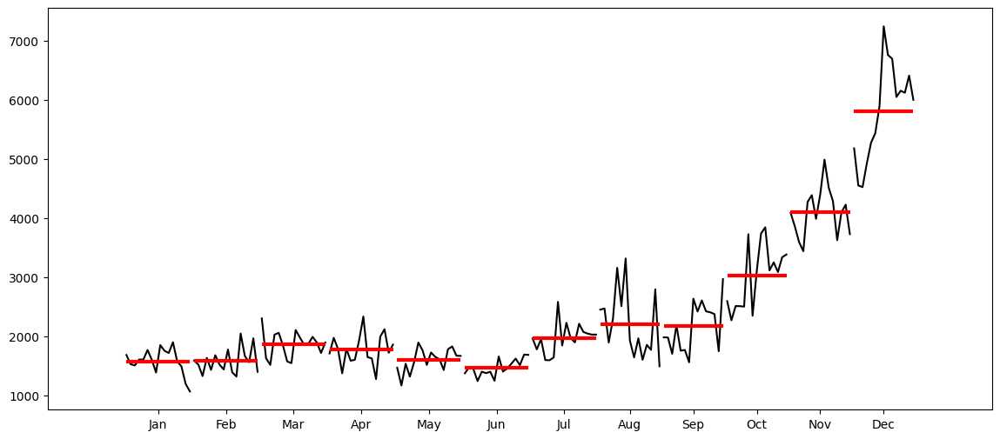

In [14]:
from statsmodels.graphics.tsaplots import month_plot

fig, ax = plt.subplots(figsize=(14,6))
month_plot(df_1['Sparkling'], ax=ax)
plt.show()

In [15]:
import plotly.express as px

fig = px.line(df_1, x=df_1.index, y='Sparkling', title='Monthly Sales Data',
              labels={'Date': 'Month', 'Sparkling': 'Sparkling'},
              markers=True, color_discrete_sequence=['orange'])

# Update layout for better presentation
fig.update_layout(xaxis_title='Month', yaxis_title='Sparkling', template = 'plotly_dark')

# Show the interactive plot
fig.show();

#### Graph of Monthly Sales across Years

In [16]:
# Make the Pivot Table
monthly_sales_across_years = pd.pivot_table(df_1, values='Sparkling', columns=df_1.index.month_name(), index=df_1.index.year)

# Sort Columns by Month Order
monthly_sales_across_years = monthly_sales_across_years[['January', 'February', 'March', 'April', 'May', 'June',
     'July', 'August', 'September', 'October', 'November', 'December']]

# Convert Pivot Table to Long format for Plotly
monthly_sales_across_years_long = monthly_sales_across_years.reset_index().melt(id_vars='YearMonth',
                                                                                var_name='Month', value_name='Sparkling')
monthly_sales_across_years_long.rename(columns={'Year': 'Year'}, inplace=True)

# Create interactive line plot using Plotly
fig = px.line(monthly_sales_across_years_long, x='YearMonth', y='Sparkling', color='Month',
              title='Monthly Sales Across Years', labels={'Sparkling': 'Sparkling', 'Year': 'Year'})

# Update the Layout for better Visualization
fig.update_layout( legend_title_text='Month', xaxis_title='Year', yaxis_title='Sparkling', template='plotly_dark',
    title_font=dict(size=24, family='Arial'), font=dict(size=16))

# Adjust the figure size
fig.update_layout(autosize=False, width=1200, height=600)

# Show the plot
fig.show();

#### Plot the average sales per month and the month on month percentage change of sales.

In [17]:
df_1.groupby(by=df_1.index)["Sparkling"].mean().head()

,Sparkling
YearMonth,
1980-01-01,1686.0
1980-02-01,1591.0
1980-03-01,2304.0
1980-04-01,1712.0
1980-05-01,1471.0


In [18]:
df_1.groupby(by=df_1.index)["Sparkling"].sum().pct_change().head()

,Sparkling
YearMonth,
1980-01-01,NaN
1980-02-01,-0.056346
1980-03-01,0.448146
1980-04-01,-0.256944
1980-05-01,-0.140771


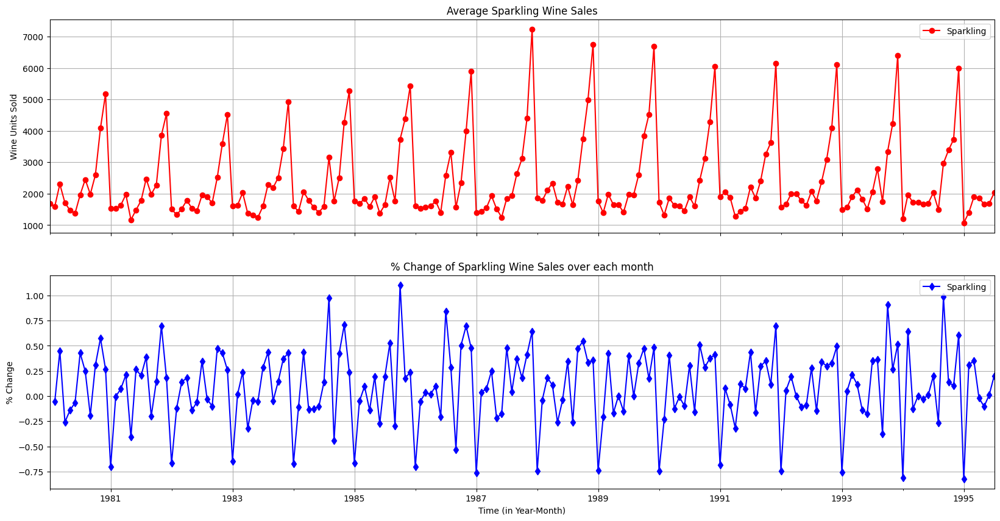

In [19]:
# group by date and get average RetailSales, and percent change
average    = df_1.groupby(by=df_1.index)["Sparkling"].mean()
pct_change = df_1.groupby(by=df_1.index)["Sparkling"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(20,10))

# plot average RetailSales over time(year-month)
ax1 = average.plot(legend=True,ax=axis1, marker='o', colormap='autumn', title="Average Sparkling Wine Sales", grid=True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
ax1.set_ylabel('Wine Units Sold')

# plot precent change for RetailSales over time(year-month)
ax2 = pct_change.plot(legend=True,ax=axis2, marker='d', colormap="winter", title="% Change of Sparkling Wine Sales over each month",grid=True)
plt.xlabel('Time (in Year-Month)')
ax2.set_ylabel('% Change')
plt.show()

In [20]:
import plotly.graph_objs as go
import plotly.subplots as sp

# Group by date and calculate the average and percent change
average = df_1.groupby(by=df_1.index)["Sparkling"].mean()
pct_change = df_1.groupby(by=df_1.index)["Sparkling"].sum().pct_change()

# Create subplots: two rows, one column
fig = sp.make_subplots(rows=2, cols=1, shared_xaxes=True,
                       subplot_titles=("Average Sparkling Wine Sales", "% Change of Sparkling Wine Sales over Each Month"),
                       vertical_spacing=0.1)

# Add the average Sparkling Wine Sales over time
fig.add_trace(go.Scatter(
    x=average.index,
    y=average,
    mode='lines+markers',
    marker=dict(color='aqua'),
    name='Average Sales'
), row=1, col=1)

# Add the percent change of Sparkling Wine Sales over time
fig.add_trace(go.Scatter(
    x=pct_change.index,
    y=pct_change,
    mode='lines+markers',
    marker=dict(color='lime'),
    name='% Change'
), row=2, col=1)

# Update the layout
fig.update_layout(
    width=1200,
    height=700,
    title_text="Sparkling Wine Sales Analysis",
    showlegend=True,
    xaxis=dict(title='Time (in Year-Month)'),
    yaxis=dict(title='Wine Units Sold'),
    yaxis2=dict(title='% Change'),
    template='plotly_dark')

# Show plot
fig.show();





1 - Average Sparkling wine sales graph shows us a no trend however yearly seasonality present in it.

2 - Percentage change graph shows us the seasonality of the change in sales to be constant throghout the lifetime of sales



#### Perform Decomposition
##### Additive Decomposition

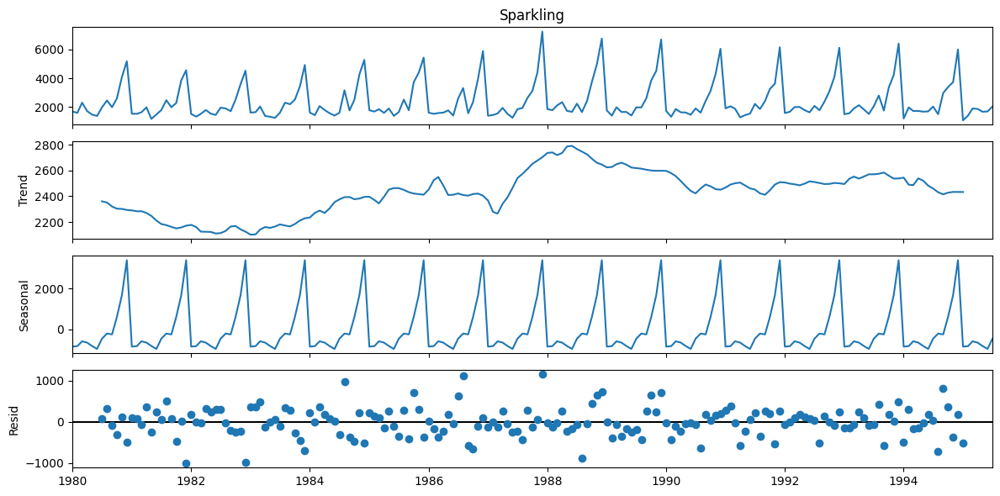

In [21]:
from statsmodels.tsa.seasonal import seasonal_decompose
rcParams['figure.figsize'] = 12,6
decompostion = seasonal_decompose(df_1['Sparkling'], model='additive')
decompostion.plot()
plt.show()

In [22]:
trend = decompostion.trend
seasonality = decompostion.seasonal
residual = decompostion.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 YearMonth
1980-01-01            NaN
1980-02-01            NaN
1980-03-01            NaN
1980-04-01            NaN
1980-05-01            NaN
1980-06-01            NaN
1980-07-01    2360.666667
1980-08-01    2351.333333
1980-09-01    2320.541667
1980-10-01    2303.583333
1980-11-01    2302.041667
1980-12-01    2293.791667
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    -854.260599
1980-02-01    -830.350678
1980-03-01    -592.356630
1980-04-01    -658.490559
1980-05-01    -824.416154
1980-06-01    -967.434011
1980-07-01    -465.502265
1980-08-01    -214.332821
1980-09-01    -254.677265
1980-10-01     599.769957
1980-11-01    1675.067179
1980-12-01    3386.983846
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01           NaN
1980-02-01           NaN
1980-03-01           NaN
1980-04-01           NaN
1980-05-01           NaN
1980-06-01           NaN
1980-07-01     70.835599
1980-08-01    315.999487
1980-09-01    -81.864401
1980-10-01   -307.353290


##### Multiplicative Decomposition

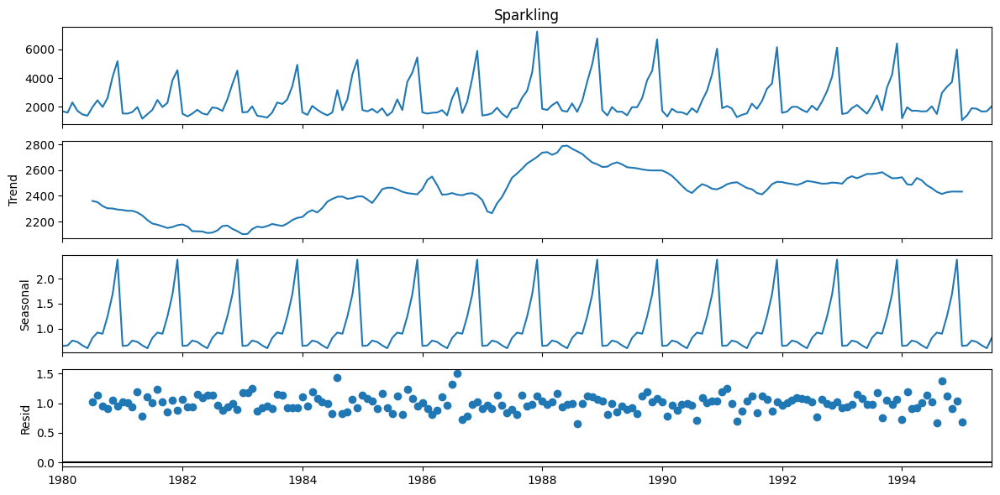

In [23]:
result_multiplicative = seasonal_decompose(df_1['Sparkling'], model='multiplicative', period=12)
result_multiplicative.plot()
plt.show()

In [24]:
trend = result_multiplicative.trend
seasonality = result_multiplicative.seasonal
residual = result_multiplicative.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 YearMonth
1980-01-01            NaN
1980-02-01            NaN
1980-03-01            NaN
1980-04-01            NaN
1980-05-01            NaN
1980-06-01            NaN
1980-07-01    2360.666667
1980-08-01    2351.333333
1980-09-01    2320.541667
1980-10-01    2303.583333
1980-11-01    2302.041667
1980-12-01    2293.791667
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    0.649843
1980-02-01    0.659214
1980-03-01    0.757440
1980-04-01    0.730351
1980-05-01    0.660609
1980-06-01    0.603468
1980-07-01    0.809164
1980-08-01    0.918822
1980-09-01    0.894367
1980-10-01    1.241789
1980-11-01    1.690158
1980-12-01    2.384776
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01         NaN
1980-02-01         NaN
1980-03-01         NaN
1980-04-01         NaN
1980-05-01         NaN
1980-06-01         NaN
1980-07-01    1.029230
1980-08-01    1.135407
1980-09-01    0.955954
1980-10-01    0.907513
1980-11-01    1.050423
1980-12-01    0.946770
Name: resi

#### Additive vs. Multiplicative Model

* Multiplicative Model: Given that the magnitude of the seasonal fluctuations appears to be proportional to the level of the time series, a multiplicative model would be more appropriate. This is because the amplitude of the seasonal peaks and troughs increases as the overall level of sales increases.

#### In Summary:

* The time series displays an upward, non-linear trend.

* Seasonality is present with relatively constant magnitude.

* A multiplicative model is suitable due to the changing amplitude of the seasonal fluctuations.

#### Drop the 'Year' and 'Month' Columns

In [25]:
df_1.drop(columns=['Month', 'Year'], inplace=True)
df_1.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


## Data Pre-processing

#### Split the Data into Training and Test

In [26]:
# Split the data into training and testing sets
train = df_1[df_1.index < '1991']
test = df_1[df_1.index >= '1991']

In [27]:
print('Shape of datasets:')
print("train dataset: ",train.shape)
print("test dataset: ",test.shape,'\n')
print('Rows of dataset: ')
print('First few rows of Training Data','\n',train.head(),'\n')
print('Last few rows of Training Data','\n',train.tail(),'\n')
print('First few rows of Test Data','\n',test.head(),'\n')
print('Last few rows of Test Data','\n',test.tail(),'\n')

Shape of datasets:
train dataset:  (132, 1)
test dataset:  (55, 1) 

Rows of dataset: 
First few rows of Training Data 
             Sparkling
YearMonth            
1980-01-01       1686
1980-02-01       1591
1980-03-01       2304
1980-04-01       1712
1980-05-01       1471 

Last few rows of Training Data 
             Sparkling
YearMonth            
1990-08-01       1605
1990-09-01       2424
1990-10-01       3116
1990-11-01       4286
1990-12-01       6047 

First few rows of Test Data 
             Sparkling
YearMonth            
1991-01-01       1902
1991-02-01       2049
1991-03-01       1874
1991-04-01       1279
1991-05-01       1432 

Last few rows of Test Data 
             Sparkling
YearMonth            
1995-03-01       1897
1995-04-01       1862
1995-05-01       1670
1995-06-01       1688
1995-07-01       2031 



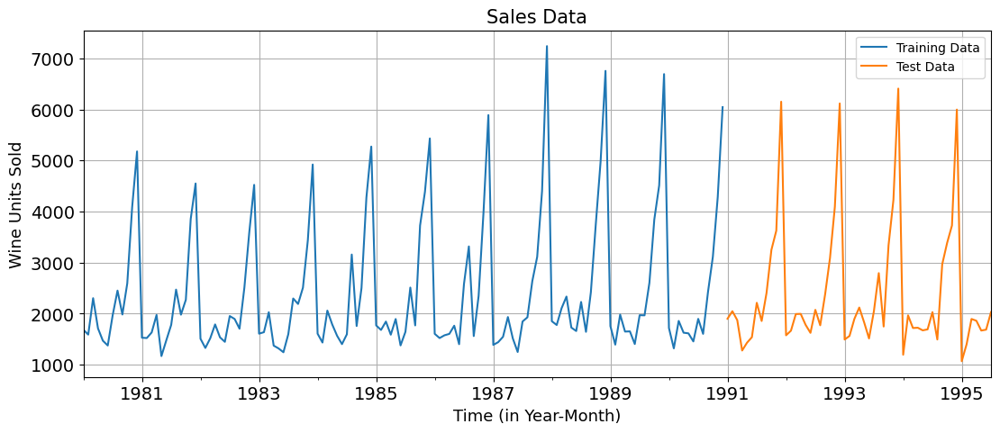

In [28]:
# Plot the Train and Test
plt.figure(figsize=(14,6))
train['Sparkling'].plot(figsize=(13,5), fontsize=14)
test['Sparkling'].plot(figsize=(13,5), fontsize=14)
plt.grid()
plt.legend(['Training Data','Test Data'])
plt.xlabel('Time (in Year-Month)', fontsize=13)
plt.ylabel('Wine Units Sold', fontsize=13)
plt.title('Sales Data', fontsize=15)
plt.show()

Note: It is difficult to predict the future observations if such an instance has not happened in the past. From our train-test split we are predicting likewise behaviour as compared to the past years.

## Model Building And Check the Performance of the Models Built

### Build Forecasting Models

*   Model 1: Linear Regression
*   Model 2: Simple Average
*   Model 3: Moving Average(MA)
*   Model 4: Simple Exponential Smoothing
*   Model 5: Double Exponential Smoothing (Holt's Model)
*   Model 6: Triple Exponential Smoothing (Holt - Winter's Model)

### Model 1: Linear Regression

For this particular linear regression, we are going to regress the 'Sales' variable against the order of the occurrence. For this we need to modify our training data before fitting it into a linear regression.

In [29]:
train_time = [i+1 for i in range(len(train))]
test_time = [i+133 for i in range(len(test))]
print('Training Time instance','\n',train_time,'\n')
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132] 

Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [30]:
LinearRegression_train = train.copy()
LinearRegression_test = test.copy()

In [31]:
LinearRegression_train['time'] = train_time
LinearRegression_test['time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Sparkling  time
YearMonth                  
1980-01-01       1686     1
1980-02-01       1591     2
1980-03-01       2304     3
1980-04-01       1712     4
1980-05-01       1471     5 

Last few rows of Training Data 
             Sparkling  time
YearMonth                  
1990-08-01       1605   128
1990-09-01       2424   129
1990-10-01       3116   130
1990-11-01       4286   131
1990-12-01       6047   132 

First few rows of Test Data 
             Sparkling  time
YearMonth                  
1991-01-01       1902   133
1991-02-01       2049   134
1991-03-01       1874   135
1991-04-01       1279   136
1991-05-01       1432   137 

Last few rows of Test Data 
             Sparkling  time
YearMonth                  
1995-03-01       1897   183
1995-04-01       1862   184
1995-05-01       1670   185
1995-06-01       1688   186
1995-07-01       2031   187 



Now that our training and test data has been modified, let us go ahead use  **Linear Regression**  to build the model on the training data and test the model on the test data.

In [32]:
from sklearn.linear_model import LinearRegression

In [33]:
lr = LinearRegression()

In [34]:
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Sparkling'].values)

LinearRegression()

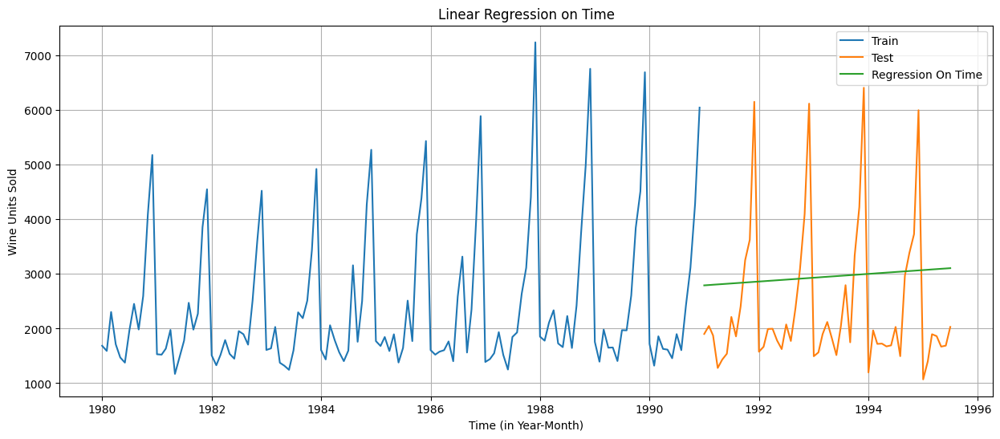

In [35]:
test_predictions_model1  = lr.predict(LinearRegression_test[['time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

plt.figure(figsize=(15,6))
plt.plot( train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time')
plt.legend(loc='best')
plt.title('Linear Regression on Time')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

#### Defining the Accuracy Metrics

In [36]:
## Test Data - RMSE

rmse_model1_test = metrics.mean_squared_error(test['Sparkling'],test_predictions_model1,squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.2f" %(rmse_model1_test))

For RegressionOnTime forecast on the Test Data,  RMSE is 1389.14


In [37]:
resultsDf = pd.DataFrame({'Test RMSE': [rmse_model1_test]},index=['RegressionOnTime'])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175


### Model 2: Simple Average

In [38]:
SimpleAverage_train = train.copy()
SimpleAverage_test = test.copy()

In [39]:
SimpleAverage_test['mean_forecast'] = train['Sparkling'].mean()
SimpleAverage_test.head()

,Sparkling,mean_forecast
YearMonth,,
1991-01-01,1902,2403.780303
1991-02-01,2049,2403.780303
1991-03-01,1874,2403.780303
1991-04-01,1279,2403.780303
1991-05-01,1432,2403.780303


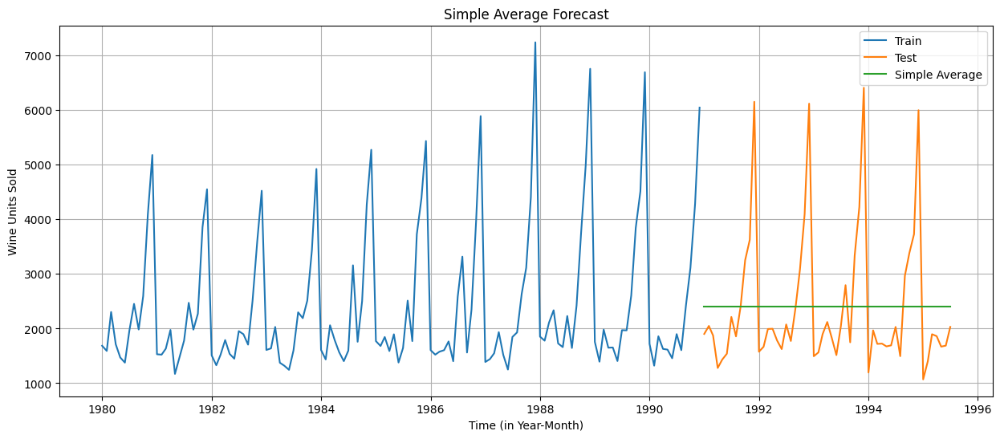

In [40]:
plt.figure(figsize=(15,6))
plt.plot(SimpleAverage_train['Sparkling'], label='Train')
plt.plot(SimpleAverage_test['Sparkling'], label='Test')
plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average')
plt.legend(loc='best')
plt.title("Simple Average Forecast")
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

#### Model Evaluation

In [41]:
## Test Data - RMSE

rmse_model3_test = metrics.mean_squared_error(test['Sparkling'],SimpleAverage_test['mean_forecast'],squared=False)
resultsDf_3 = pd.DataFrame({'Test RMSE': [rmse_model3_test]},index=['Simple Average Model'])

resultsDf = pd.concat([resultsDf, resultsDf_3])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804


### Model 3: Moving Average (MA)

##### For the Moving Average Model, We are going to calculate rolling means (or moving averages) for different intervals. The best interval can be determined by the maximum accuracy (or the minimum error) over here.

###### For Moving Average, We are going to average over the entire data.

In [42]:
MovingAverage = df_1.copy()
MovingAverage.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


#### Trailing Moving Averages

In [43]:
MovingAverage['Trailing_2'] = MovingAverage['Sparkling'].rolling(2).mean()
MovingAverage['Trailing_4'] = MovingAverage['Sparkling'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Sparkling'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Sparkling'].rolling(9).mean()

MovingAverage.head(9)

,Sparkling,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,1686,NaN,NaN,NaN,NaN
1980-02-01,1591,1638.5,NaN,NaN,NaN
1980-03-01,2304,1947.5,NaN,NaN,NaN
1980-04-01,1712,2008.0,1823.25,NaN,NaN
1980-05-01,1471,1591.5,1769.50,NaN,NaN
1980-06-01,1377,1424.0,1716.00,1690.166667,NaN
1980-07-01,1966,1671.5,1631.50,1736.833333,NaN
1980-08-01,2453,2209.5,1816.75,1880.500000,NaN
1980-09-01,1984,2218.5,1945.00,1827.166667,1838.222222


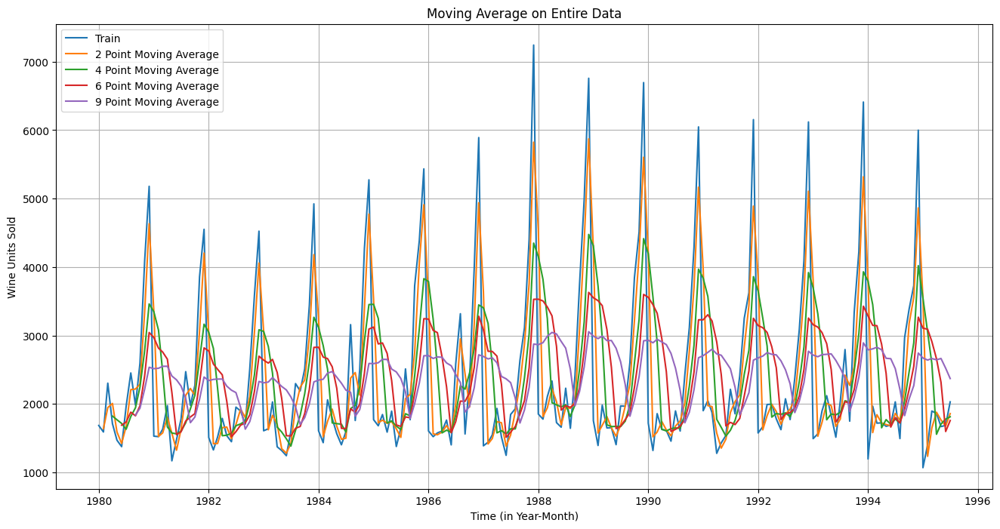

In [44]:
#Plotting on the whole data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage['Sparkling'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label = '2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'], label = '4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'], label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'], label = '9 Point Moving Average')
plt.title('Moving Average on Entire Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

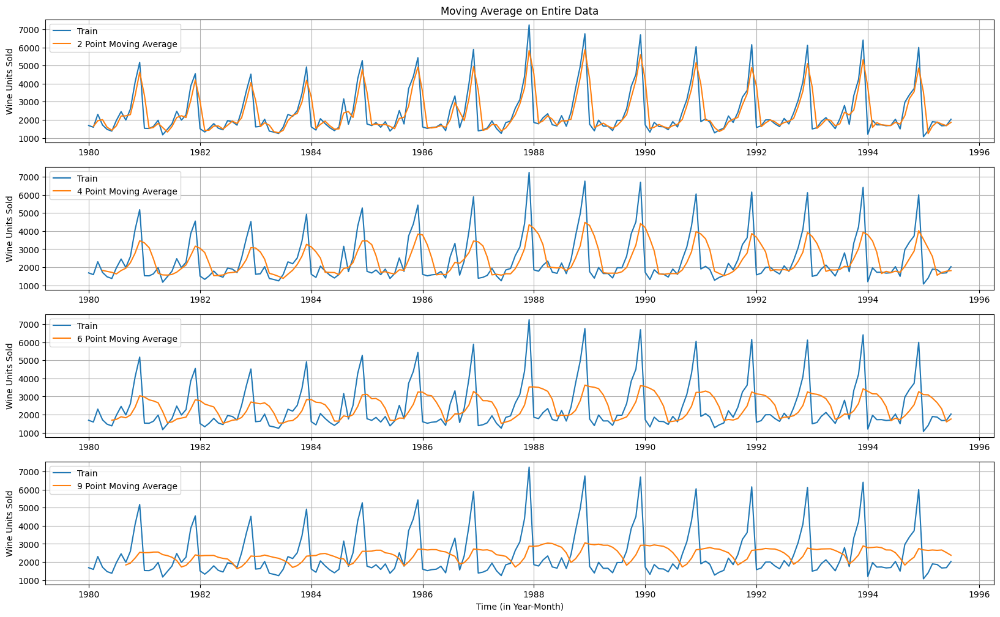

In [45]:
#Plotting on the whole data separately

plt.figure(figsize=(20,12))


plt.subplot(4,1,1)
plt.plot(MovingAverage['Sparkling'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.title('Moving Average on Entire Data')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,2)
plt.plot(MovingAverage['Sparkling'], label='Train')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,3)
plt.plot(MovingAverage['Sparkling'], label='Train')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,4)
plt.plot(MovingAverage['Sparkling'], label='Train')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.xlabel('Time (in Year-Month)')
plt.legend(loc = 'best')

plt.grid();

Let us split the data into train and test and plot this Time Series. The window of the moving average is need to be carefully selected as too big a window will result in not having any test set as the whole series might get averaged over.

In [46]:
# Creating train and test set

#Creating train and test set
trailing_MovingAverage_train=MovingAverage[MovingAverage.index < '1991-01-01']
trailing_MovingAverage_test=MovingAverage[MovingAverage.index >= '1991-01-01']

print(trailing_MovingAverage_test.shape)
print(trailing_MovingAverage_train.shape)

(55, 5)
(132, 5)


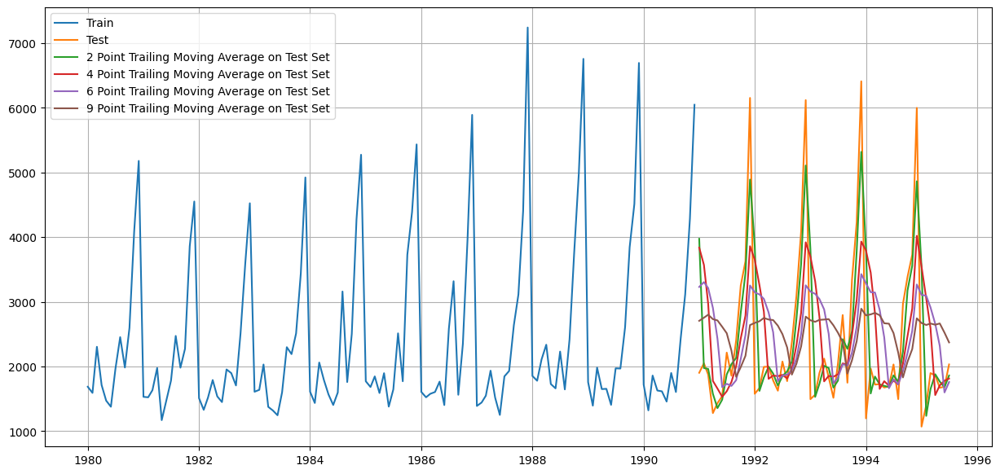

In [47]:
## Plotting on both the Training and Test data

plt.figure(figsize=(15,7))
plt.plot(trailing_MovingAverage_train['Sparkling'], label='Train')
plt.plot(trailing_MovingAverage_test['Sparkling'], label='Test')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label = '2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label = '4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'], label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'], label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.grid();

##### Model Evaluation

RMSE Calculation as below

In [48]:
## Test Data - RMSE --> 2 point Trailing MA
rmse_model4_test_2 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Trailing_2'],squared=False)
print("For 2 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_model4_test_2))


## Test Data - RMSE  --> 4 point Trailing MA
rmse_model4_test_4 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_model4_test_4))


## Test Data - RMSE --> 6 point Trailing MA
rmse_model4_test_6 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_model4_test_6))


## Test Data - RMSE  --> 9 point Trailing MA
rmse_model4_test_9 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Trailing_9'],squared=False)
print('For 9 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f' %(rmse_model4_test_9))

For 2 point Moving Average Model forecast on the Training Data,  RMSE is 813.401
For 4 point Moving Average Model forecast on the Training Data,  RMSE is 1156.590
For 6 point Moving Average Model forecast on the Training Data,  RMSE is 1283.927
For 9 point Moving Average Model forecast on the Training Data,  RMSE is 1346.278


In [49]:
resultsDf_4 = pd.DataFrame({'Test RMSE': [rmse_model4_test_2,rmse_model4_test_4
                                          ,rmse_model4_test_6,rmse_model4_test_9]}
                           ,index=['2 Point Trailing Moving Average','4 Point Trailing Moving Average'
                                   ,'6 Point Trailing Moving Average','9 Point Trailing Moving Average'])

resultsDf = pd.concat([resultsDf, resultsDf_4])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315


#### Before we go on to build the various Exponential Smoothing models, let us plot all the models and compare the Time Series plots.

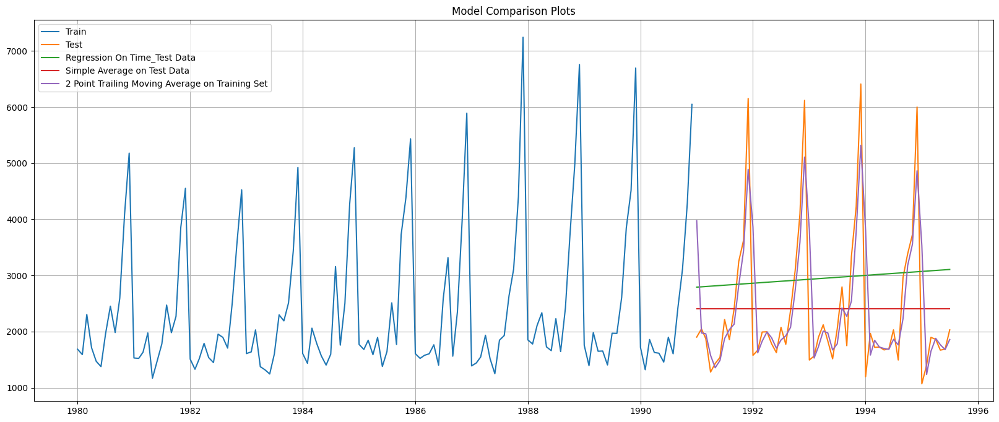

In [50]:
## Plotting on both Training and Test data

plt.figure(figsize=(20,8))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time_Test Data')

plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on Test Data')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')

plt.legend(loc='best')
plt.title("Model Comparison Plots")
plt.grid();

#### Model 4: Simple Exponential Smoothing

In [51]:
SES_train = train.copy()
SES_test = test.copy()

In [52]:
model_SES = SimpleExpSmoothing(SES_train['Sparkling'])

In [53]:
# Fitting the Simple Exponential Smoothing model and asking python to choose the optimal parameters
model_SES_autofit = model_SES.fit(optimized=True)

In [54]:
model_SES_autofit.params

{'smoothing_level': 0.03953488372093023,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [55]:
SES_test['predict'] = model_SES_autofit.forecast(steps=len(test))
SES_test.head()

,Sparkling,predict
YearMonth,,
1991-01-01,1902,2676.676366
1991-02-01,2049,2676.676366
1991-03-01,1874,2676.676366
1991-04-01,1279,2676.676366
1991-05-01,1432,2676.676366


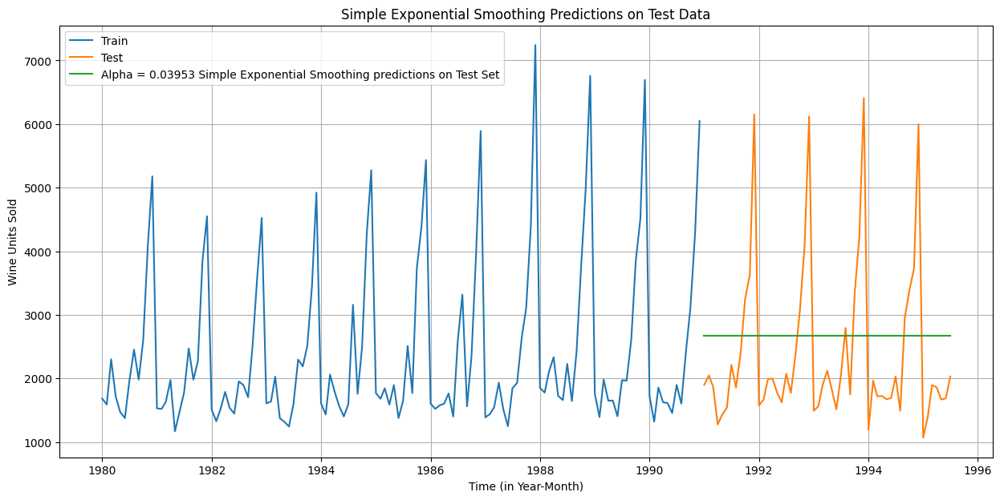

In [56]:
## Plotting on both the Training and Test data

plt.figure(figsize=(15,7))

plt.plot(SES_train['Sparkling'], label='Train')
plt.plot(SES_test['Sparkling'], label='Test')

plt.plot(SES_test['predict'], label='Alpha = 0.03953 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')

plt.title('Simple Exponential Smoothing Predictions on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid()
plt.show()


#### Model Evaluation for  Alpha = 0.03953 Simple Exponential Smoothing


In [57]:
# Test Data

rmse_model5_test_1 = metrics.mean_squared_error(SES_test['Sparkling'],SES_test['predict'],squared=False)
print("For Alpha = 0.03953 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_model5_test_1))


For Alpha = 0.03953 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is 1304.927


In [58]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_model5_test_1]},index=['Alpha = 0.03953, Simple Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_5])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405


#### Setting different alpha values.

###### Remember, the higher the alpha value more weightage is given to the more recent observation. That means, what happened recently will happen again.


##### We will run a loop with different alpha values to understand which particular value works best for alpha on the test set.

In [59]:
from sklearn import metrics

# First we will define an empty dataframe (resultsDf_6) to store our values from the loop
resultsDf_6 = pd.DataFrame(columns=['Alpha Values', 'Train RMSE', 'Test RMSE'])

# Loop counter
l = 0

for i in np.arange(0.1,1,0.1):
    model_SES_alpha_i = model_SES.fit(smoothing_level=i, optimized=False, use_brute=True)

    # Predict on train and test sets
    SES_train.loc[:, f'predict_{i}'] = model_SES_alpha_i.fittedvalues
    SES_test.loc[:, f'predict_{i}'] = model_SES_alpha_i.forecast(steps=len(SES_test))

    # Check for NaN values
    if SES_train[f'predict_{i}'].isna().sum() == 0 and SES_test[f'predict_{i}'].isna().sum() == 0:
        # Calculate RMSE
        rmse_model5_train_i = metrics.mean_squared_error(SES_train['Sparkling'], SES_train[f'predict_{i}'], squared=False)
        rmse_model5_test_i = metrics.mean_squared_error(SES_test['Sparkling'], SES_test[f'predict_{i}'], squared=False)

        # Store results in a DataFrame
        resultsDf_alpha = pd.DataFrame({
            'Alpha Values': [i],
            'Train RMSE': [rmse_model5_train_i],
            'Test RMSE': [rmse_model5_test_i]
        }, index=[l])

        # Increment loop counter
        l += 1

        # Concatenate the current results with the main DataFrame
        resultsDf_6 = pd.concat([resultsDf_6, resultsDf_alpha])
    else:
        print(f"Warning: NaN values found for alpha={i}. Skipping this iteration.")

# Display the final results DataFrame
resultsDf_6


,Alpha Values,Train RMSE,Test RMSE
0,0.1,1333.873836,1375.393398
1,0.2,1356.042987,1595.206839
2,0.3,1359.511747,1935.507132
3,0.4,1352.588879,2311.919615
4,0.5,1344.004369,2666.351413
5,0.6,1338.805381,2979.204388
6,0.7,1338.844308,3249.944092
7,0.8,1344.462091,3483.801006
8,0.9,1355.723518,3686.794285


#### Model Evaluation

In [60]:
resultsDf_6.sort_values(by=['Test RMSE'],ascending=True)

,Alpha Values,Train RMSE,Test RMSE
0,0.1,1333.873836,1375.393398
1,0.2,1356.042987,1595.206839
2,0.3,1359.511747,1935.507132
3,0.4,1352.588879,2311.919615
4,0.5,1344.004369,2666.351413
5,0.6,1338.805381,2979.204388
6,0.7,1338.844308,3249.944092
7,0.8,1344.462091,3483.801006
8,0.9,1355.723518,3686.794285


Index(['Sparkling', 'predict', 'predict_0.1', 'predict_0.2',
       'predict_0.30000000000000004', 'predict_0.4', 'predict_0.5',
       'predict_0.6', 'predict_0.7000000000000001', 'predict_0.8',
       'predict_0.9'],
      dtype='object')
['predict_0.1', 'predict_0.2', 'predict_0.30000000000000004', 'predict_0.4', 'predict_0.5', 'predict_0.6', 'predict_0.7000000000000001', 'predict_0.8', 'predict_0.9']


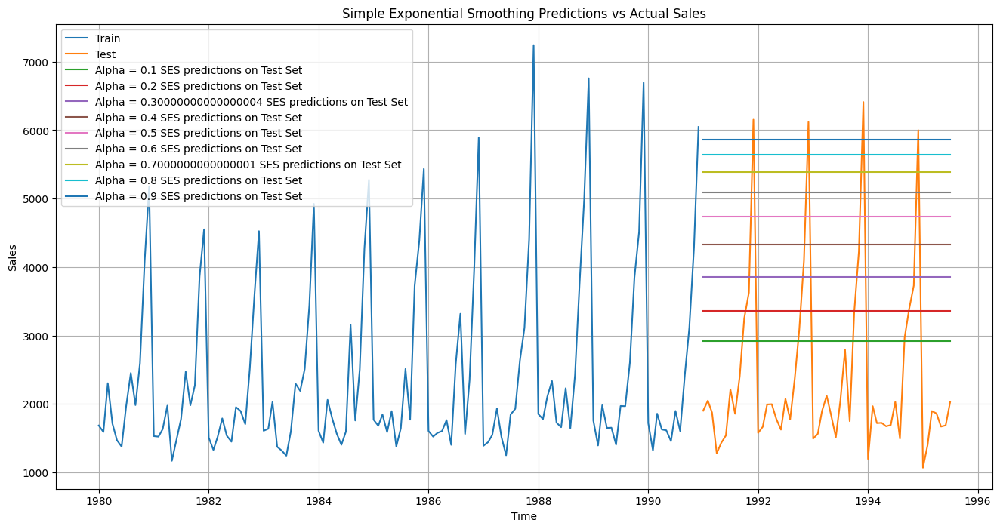

In [61]:
# Inspect the columns of SES_test
print(SES_test.columns)

# Check for columns starting with 'predict_'
predict_columns = [col for col in SES_test.columns if col.startswith('predict_')]
print(predict_columns)

# Plotting on both the Training and Test data
plt.figure(figsize=(16, 8))
plt.plot(SES_train['Sparkling'], label='Train')
plt.plot(SES_test['Sparkling'], label='Test')

# Plot predictions for available alpha values
for col in predict_columns:
    alpha = col.split('_')[1]  # Extract the alpha value from the column name
    plt.plot(SES_test[col], label=f'Alpha = {alpha} SES predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple Exponential Smoothing Predictions vs Actual Sales')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.show()

In [62]:
resultsDf_6_1 = pd.DataFrame({'Test RMSE': [resultsDf_6.sort_values(by=['Test RMSE'],ascending=True).values[0][2]]}
                           ,index=['Alpha=0.1,SimpleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_6_1])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405
"Alpha=0.1,SimpleExponentialSmoothing",1375.393398


#### Method 5: Double Exponential Smoothing (Holt's Model)

##### Two parameters $\alpha$ and $\beta$ are estimated in this model. Level and Trend are accounted for in this model.

In [63]:
DES_train = train.copy()
DES_test = test.copy()

In [64]:
model_DES = Holt(DES_train['Sparkling'])

In [65]:
# First we will define an empty dataframe to store our values from the loop

resultsDf_6 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Test RMSE': []})
model_DES_autofit = model_DES.fit(optimized=True)

model_DES_autofit.params

{'smoothing_level': 0.6885714285714285,
 'smoothing_trend': 9.999999999999999e-05,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': -95.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [66]:
DES_test['predict'] = model_DES_autofit.forecast(steps=len(test))
DES_test.head()

,Sparkling,predict
YearMonth,,
1991-01-01,1902,5221.278699
1991-02-01,2049,5127.886554
1991-03-01,1874,5034.494409
1991-04-01,1279,4941.102264
1991-05-01,1432,4847.710119


In [67]:
# Initialize results DataFrame
resultsDf_7 = pd.DataFrame(columns=['Alpha Values', 'Beta Values', 'Train RMSE', 'Test RMSE'])

l = 0

for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        # Fit the Double Exponential Smoothing model with alpha and beta values
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i, smoothing_trend=j, optimized=False, use_brute=True)

        # Generate column names based on alpha and beta values
        col_name_train = f'predict_{i:.1f}_{j:.1f}'
        col_name_test = f'predict_{i:.1f}_{j:.1f}'

        # Store predictions
        DES_train[col_name_train] = model_DES_alpha_i_j.fittedvalues
        DES_test[col_name_test] = model_DES_alpha_i_j.forecast(steps=len(DES_test))

        # Calculate RMSE if there are no NaN values in predictions
        if not DES_train[col_name_train].isna().any() and not DES_test[col_name_test].isna().any():
            rmse_model6_train = metrics.mean_squared_error(DES_train['Sparkling'], DES_train[col_name_train], squared=False)
            rmse_model6_test = metrics.mean_squared_error(DES_test['Sparkling'], DES_test[col_name_test], squared=False)

            # Store results in a DataFrame
            resultsDf_alpha2 = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Train RMSE': [rmse_model6_train],
                'Test RMSE': [rmse_model6_test]
            }, index=[l])

            # Increment loop counter
            l += 1

            # Concatenate the current results with the main DataFrame
            resultsDf_7 = pd.concat([resultsDf_7, resultsDf_alpha2])
        else:
            print(f"Warning: NaN values found for alpha={i}, beta={j}. Skipping this iteration.")

# Display the final results DataFrame
resultsDf_7.sort_values(by=['Test RMSE'],ascending=True)

,Alpha Values,Beta Values,Train RMSE,Test RMSE
0,0.1,0.1,1382.520870,1778.564670
1,0.1,0.2,1413.598835,2599.439986
10,0.2,0.1,1418.041591,3611.763322
2,0.1,0.3,1445.762015,4293.084674
20,0.3,0.1,1431.169601,5908.185554
...,...,...,...,...
98,1.0,0.9,1985.368445,57823.177011
79,0.8,1.0,1872.711054,57990.117908
89,0.9,1.0,1948.020916,59008.254331
99,1.0,1.0,2077.672157,59877.076519


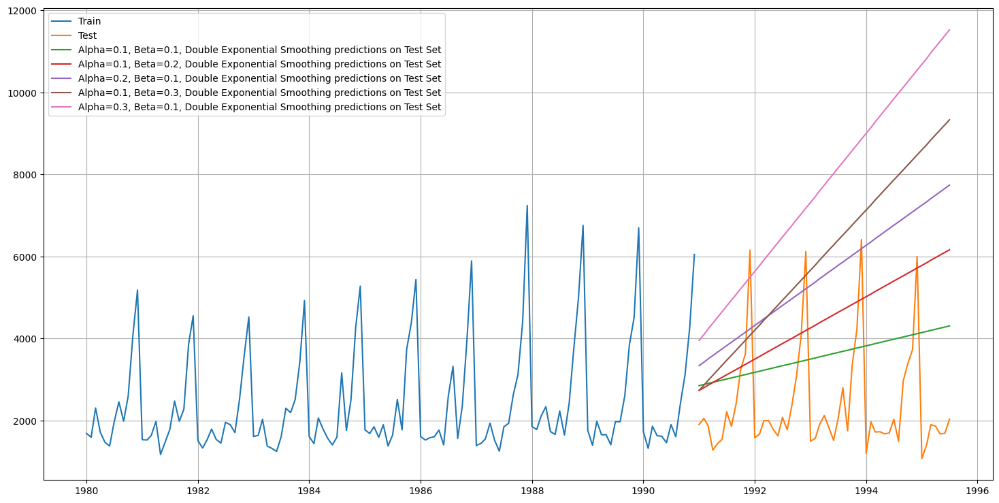

In [68]:
# Plotting on both the Training and Test data
plt.figure(figsize=(18, 9))

# Plot the actual sales data for training and test sets
plt.plot(DES_train['Sparkling'], label='Train')
plt.plot(DES_test['Sparkling'], label='Test')

# Plot the predictions for specific alpha and beta values
plt.plot(DES_test['predict_0.1_0.1'], label='Alpha=0.1, Beta=0.1, Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict_0.1_0.2'], label='Alpha=0.1, Beta=0.2, Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict_0.2_0.1'], label='Alpha=0.2, Beta=0.1, Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict_0.1_0.3'], label='Alpha=0.1, Beta=0.3, Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict_0.3_0.1'], label='Alpha=0.3, Beta=0.1, Double Exponential Smoothing predictions on Test Set')

# Add legend and grid
plt.legend(loc='best')
plt.grid()

# Show the plot
plt.show()

#### Model Evaluation

In [69]:
resultsDf_7.sort_values(by=['Test RMSE'],ascending=True).head(5)

,Alpha Values,Beta Values,Train RMSE,Test RMSE
0,0.1,0.1,1382.520870,1778.564670
1,0.1,0.2,1413.598835,2599.439986
10,0.2,0.1,1418.041591,3611.763322
2,0.1,0.3,1445.762015,4293.084674
20,0.3,0.1,1431.169601,5908.185554


In [70]:
resultsDf_7 = pd.DataFrame({'Test RMSE': [resultsDf_7.sort_values(by=['Test RMSE']).values[0][3]]}
                           ,index=['Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_7])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405
"Alpha=0.1,SimpleExponentialSmoothing",1375.393398
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",1778.564670


#### Method 5: Triple Exponential Smoothing (Holt - Winter's Model)

##### Three parameters $\alpha$, $\beta$ and $\gamma$ are estimated in this model. Level, Trend and Seasonality are accounted for in this model.

In [71]:
TES_train = train.copy()
TES_test = test.copy()

In [72]:
model_TES_ta_sa = ExponentialSmoothing(TES_train['Sparkling'],trend='additive',seasonal='additive')
model_TES_ta_sm = ExponentialSmoothing(TES_train['Sparkling'],trend='additive',seasonal='multiplicative')
model_TES_tm_sm = ExponentialSmoothing(TES_train['Sparkling'],trend='multiplicative',seasonal='multiplicative')
model_TES_tm_sa = ExponentialSmoothing(TES_train['Sparkling'],trend='multiplicative',seasonal='additive')

In [73]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_7 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_7

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE


In [74]:
model_TES_autofit_ta_sa = model_TES_ta_sa.fit(optimized=True)
model_TES_autofit_ta_sm = model_TES_ta_sm.fit(optimized=True)
model_TES_autofit_tm_sm = model_TES_tm_sm.fit(optimized=True)
model_TES_autofit_tm_sa = model_TES_tm_sa.fit(optimized=True)

In [75]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_7_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_7_2

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE


In [76]:
model_TES_autofit_ta_sa.params

{'smoothing_level': 0.11127217859992398,
 'smoothing_trend': 0.01236078328796452,
 'smoothing_seasonal': 0.4607177642170641,
 'damping_trend': nan,
 'initial_level': 2356.578308185137,
 'initial_trend': -0.01853556812789492,
 'initial_seasons': array([-636.23360535, -722.98363367, -398.6436108 , -473.43084469,
        -808.42525514, -815.35024951, -384.23066987,   72.99508063,
        -237.44272911,  272.32584554, 1541.3782103 , 2590.0775386 ]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [77]:
model_TES_autofit_ta_sm.params

{'smoothing_level': 0.11119949831569428,
 'smoothing_trend': 0.049430920023313805,
 'smoothing_seasonal': 0.3620525701498937,
 'damping_trend': nan,
 'initial_level': 2356.5264391986907,
 'initial_trend': -9.443690175376352,
 'initial_seasons': array([0.71325627, 0.68332509, 0.90537798, 0.80561841, 0.65639659,
        0.65451508, 0.88690241, 1.13423953, 0.91927727, 1.21396745,
        1.86941738, 2.3734461 ]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [78]:
model_TES_autofit_tm_sm.params

{'smoothing_level': 0.11107188540711412,
 'smoothing_trend': 0.049365309949742364,
 'smoothing_seasonal': 0.3621557605717753,
 'damping_trend': nan,
 'initial_level': 2356.541814724122,
 'initial_trend': 0.9987259871980313,
 'initial_seasons': array([0.73133608, 0.69868555, 0.90031567, 0.81016953, 0.66861198,
        0.66938193, 0.87905698, 1.11657177, 0.91556679, 1.18173667,
        1.84612803, 2.34747359]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [79]:
model_TES_autofit_tm_sa.params

{'smoothing_level': 0.11525926167295093,
 'smoothing_trend': 0.013289249637018248,
 'smoothing_seasonal': 0.4565935865353621,
 'damping_trend': nan,
 'initial_level': 2357.2388893517714,
 'initial_trend': 0.9994606442736722,
 'initial_seasons': array([-636.77003546, -723.38956008, -397.61934462, -473.71510371,
        -808.95039309, -815.85988383, -384.23255231,   73.66806555,
        -238.14788586,  272.17070913, 1542.70950197, 2591.09596332]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [80]:
TES_test['predict_ta_sa'] = model_TES_autofit_ta_sa.forecast(steps=len(test))
TES_test.head()

,Sparkling,predict_ta_sa
YearMonth,,
1991-01-01,1902,1490.574426
1991-02-01,2049,1204.714325
1991-03-01,1874,1688.941106
1991-04-01,1279,1551.450810
1991-05-01,1432,1461.440427


In [81]:
TES_test['predict_ta_sm'] = model_TES_autofit_ta_sm.forecast(steps=len(test))
TES_test.head()

,Sparkling,predict_ta_sa,predict_ta_sm
YearMonth,,,
1991-01-01,1902,1490.574426,1587.685845
1991-02-01,2049,1204.714325,1356.590237
1991-03-01,1874,1688.941106,1763.121866
1991-04-01,1279,1551.450810,1656.379813
1991-05-01,1432,1461.440427,1542.186697


In [82]:
TES_test['predict_tm_sm'] = model_TES_autofit_tm_sm.forecast(steps=len(test))
TES_test.head()

,Sparkling,predict_ta_sa,predict_ta_sm,predict_tm_sm
YearMonth,,,,
1991-01-01,1902,1490.574426,1587.685845,1591.454098
1991-02-01,2049,1204.714325,1356.590237,1360.482080
1991-03-01,1874,1688.941106,1763.121866,1767.997947
1991-04-01,1279,1551.450810,1656.379813,1661.667528
1991-05-01,1432,1461.440427,1542.186697,1547.440667


In [83]:
TES_test['predict_tm_sa'] = model_TES_autofit_tm_sa.forecast(steps=len(test))
TES_test.head()

,Sparkling,predict_ta_sa,predict_ta_sm,predict_tm_sm,predict_tm_sa
YearMonth,,,,,
1991-01-01,1902,1490.574426,1587.685845,1591.454098,1484.431732
1991-02-01,2049,1204.714325,1356.590237,1360.482080,1200.192764
1991-03-01,1874,1688.941106,1763.121866,1767.997947,1683.864662
1991-04-01,1279,1551.450810,1656.379813,1661.667528,1547.844914
1991-05-01,1432,1461.440427,1542.186697,1547.440667,1457.652829


In [84]:
# Test Data

rmse_model_temp_ta_sa = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict_ta_sa'],squared=False)
print("For α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential (Trend = Add, Seasonality = Add) forecast on the Test Data, RMSE is %3.3f"
      %(rmse_model_temp_ta_sa))

# Test Data

rmse_model_temp_ta_sm = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict_ta_sm'],squared=False)
print("For α = 0.111199, β = 0.049430, γ = 0.362052 Tripple Exponential (Trend = Add, Seasonality = Multi) forecast on the Test Data, RMSE is %3.3f"
      %(rmse_model_temp_ta_sm))


# Test Data

rmse_model_temp_tm_sm = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict_tm_sm'],squared=False)
print("For α = 0.111071, β = 0.049365, γ = 0.362155 Tripple Exponential (Trend = Multi, Seasonality = Multi) forecast on the Test Data, RMSE is %3.3f"
      %(rmse_model_temp_tm_sm))

# Test Data

rmse_model_temp_tm_sa = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict_tm_sa'],squared=False)
print("For α = 0.115259, β = 0.013289, γ = 0.45659  Tripple Exponential (Trend = Multi, Seasonality = Add) forecast on the Test Data, RMSE is %3.3f"
      %(rmse_model_temp_tm_sa))


For α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential (Trend = Add, Seasonality = Add) forecast on the Test Data, RMSE is 378.626
For α = 0.111199, β = 0.049430, γ = 0.362052 Tripple Exponential (Trend = Add, Seasonality = Multi) forecast on the Test Data, RMSE is 403.706
For α = 0.111071, β = 0.049365, γ = 0.362155 Tripple Exponential (Trend = Multi, Seasonality = Multi) forecast on the Test Data, RMSE is 380.393
For α = 0.115259, β = 0.013289, γ = 0.45659  Tripple Exponential (Trend = Multi, Seasonality = Add) forecast on the Test Data, RMSE is 379.646


In [85]:
resultsDf_temp = pd.DataFrame({'Test RMSE': rmse_model_temp_ta_sa}
                           ,index=['α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential_auto_fit(Trend = Add, Seasonality = Add)'])

resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405
"Alpha=0.1,SimpleExponentialSmoothing",1375.393398
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",1778.564670
"α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential_auto_fit(Trend = Add, Seasonality = Add)",378.626241


In [86]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_7_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Test RMSE': [],
                             'Method' : []})
resultsDf_7_2

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE,Method


In [148]:
# Initialize the DataFrame to store results
resultsDf_7_2 = pd.DataFrame()

# Loop through different combinations of alpha, beta, and gamma values
for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        for k in np.arange(0.1, 1.1, 0.1):
            # Fit the Triple Exponential Smoothing model
            model_TES_alpha_i_j_k = model_TES_ta_sa.fit(smoothing_level=i,
                                                        smoothing_slope=j,
                                                        smoothing_seasonal=k,
                                                        optimized=False,
                                                        use_brute=True)

            # Generate predictions for train and test sets
            TES_train[('predict_ta_sa', i, j, k)] = model_TES_alpha_i_j_k.fittedvalues
            TES_test[('predict_ta_sa', i, j, k)] = model_TES_alpha_i_j_k.forecast(steps=len(TES_test))

            # Calculate RMSE for train and test sets
            rmse_model7_train = metrics.mean_squared_error(TES_train['Sparkling'], TES_train[('predict_ta_sa', i, j, k)], squared=False)
            rmse_model7_test = metrics.mean_squared_error(TES_test['Sparkling'], TES_test[('predict_ta_sa', i, j, k)].replace([np.inf, np.nan], 0).dropna(), squared=False)

            # Append the results to the DataFrame
            resultsDf_alpha3 = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Gamma Values': [k],
                'Train RMSE': [rmse_model7_train],
                'Test RMSE': [rmse_model7_test],
                'Method': ['ta_sa']
            })

            # Concatenate the current results with the existing DataFrame
            resultsDf_7_2 = pd.concat([resultsDf_7_2, resultsDf_alpha3], ignore_index=True)

# Display the results
print(resultsDf_7_2.head())


   Alpha Values  Beta Values  Gamma Values  Train RMSE   Test RMSE Method
0           0.1          0.1           0.1  428.933616  507.044779  ta_sa
1           0.1          0.1           0.2  400.948971  638.030690  ta_sa
2           0.1          0.1           0.3  385.679598  743.071158  ta_sa
3           0.1          0.1           0.4  378.958032  807.914545  ta_sa
4           0.1          0.1           0.5  378.168418  840.955870  ta_sa


In [147]:
# Loop through different combinations of alpha, beta, and gamma values
for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        for k in np.arange(0.1, 1.1, 0.1):
            # Fit the Triple Exponential Smoothing model
            model_TES_alpha_i_j_k = model_TES_ta_sm.fit(smoothing_level=i,
                                                        smoothing_slope=j,
                                                        smoothing_seasonal=k,
                                                        optimized=False,
                                                        use_brute=True)

            # Generate predictions for train and test sets
            TES_train[('predict_ta_sm', i, j, k)] = model_TES_alpha_i_j_k.fittedvalues
            TES_test[('predict_ta_sm', i, j, k)] = model_TES_alpha_i_j_k.forecast(steps=len(TES_test))

            # Calculate RMSE for train and test sets
            rmse_model7_train = metrics.mean_squared_error(TES_train['Sparkling'], TES_train[('predict_ta_sm', i, j, k)], squared=False)
            rmse_model7_test = metrics.mean_squared_error(TES_test['Sparkling'], TES_test[('predict_ta_sm', i, j, k)].replace([np.inf, np.nan], 0).dropna(), squared=False)

            # Create a temporary DataFrame to hold the current iteration's results
            resultsDf_temp = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Gamma Values': [k],
                'Train RMSE': [rmse_model7_train],
                'Test RMSE': [rmse_model7_test],
                'Method': ['ta_sm']
            })

            # Concatenate the temporary DataFrame with the results DataFrame
            resultsDf_7_2 = pd.concat([resultsDf_7_2, resultsDf_temp], ignore_index=True)

# Display the results
print(resultsDf_7_2.head())



   Alpha Values  Beta Values  Gamma Values  Train RMSE   Test RMSE Method
0           0.1          0.1           0.1  428.933616  507.044779  ta_sa
1           0.1          0.1           0.2  400.948971  638.030690  ta_sa
2           0.1          0.1           0.3  385.679598  743.071158  ta_sa
3           0.1          0.1           0.4  378.958032  807.914545  ta_sa
4           0.1          0.1           0.5  378.168418  840.955870  ta_sa


In [89]:
# Loop through different combinations of alpha, beta, and gamma values
for i in np.arange(0.1, 1.0, 0.1):
    for j in np.arange(0.1, 1.0, 0.1):
        for k in np.arange(0.1, 1.0, 0.1):
            # Fit the Triple Exponential Smoothing model
            model_TES_alpha_i_j_k = model_TES_tm_sm.fit(smoothing_level=i,
                                                        smoothing_slope=j,
                                                        smoothing_seasonal=k,
                                                        optimized=False,
                                                        use_brute=True)

            # Generate predictions for train and test sets
            TES_train[('predict_tm_sm', i, j, k)] = model_TES_alpha_i_j_k.fittedvalues
            TES_test[('predict_tm_sm', i, j, k)] = model_TES_alpha_i_j_k.forecast(steps=len(TES_test))

            # Calculate RMSE for train and test sets
            rmse_model7_train = metrics.mean_squared_error(TES_train['Sparkling'], TES_train[('predict_tm_sm', i, j, k)], squared=False)
            rmse_model7_test = metrics.mean_squared_error(TES_test['Sparkling'], TES_test[('predict_tm_sm', i, j, k)].replace([np.inf, np.nan], 0).dropna(), squared=False)

            # Create a temporary DataFrame to store the current iteration's results
            resultsDf_temp = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Gamma Values': [k],
                'Train RMSE': [rmse_model7_train],
                'Test RMSE': [rmse_model7_test],
                'Method': ['tm_sm']
            })

            # Concatenate the temporary DataFrame with the main results DataFrame
            resultsDf_7_2 = pd.concat([resultsDf_7_2, resultsDf_temp], ignore_index=True)

print(resultsDf_7_2.head())


   Alpha Values  Beta Values  Gamma Values  Train RMSE   Test RMSE Method
0           0.1          0.1           0.1  428.933616  507.044779  ta_sa
1           0.1          0.1           0.2  400.948971  638.030690  ta_sa
2           0.1          0.1           0.3  385.679598  743.071158  ta_sa
3           0.1          0.1           0.4  378.958032  807.914545  ta_sa
4           0.1          0.1           0.5  378.168418  840.955870  ta_sa


In [149]:
# Loop through different combinations of alpha, beta, and gamma values
for i in np.arange(0.1, 1.0, 0.1):
    for j in np.arange(0.1, 1.0, 0.1):
        for k in np.arange(0.1, 1.0, 0.1):
            # Fit the Triple Exponential Smoothing model
            model_TES_alpha_i_j_k = model_TES_tm_sa.fit(smoothing_level=i,
                                                        smoothing_slope=j,
                                                        smoothing_seasonal=k,
                                                        optimized=False,
                                                        use_brute=True)

            # Generate predictions for train and test sets
            TES_train[('predict_tm_sa', i, j, k)] = model_TES_alpha_i_j_k.fittedvalues
            TES_test[('predict_tm_sa', i, j, k)] = model_TES_alpha_i_j_k.forecast(steps=len(TES_test))

            # Calculate RMSE for train and test sets
            rmse_model7_train = metrics.mean_squared_error(TES_train['Sparkling'], TES_train[('predict_tm_sa', i, j, k)], squared=False)
            rmse_model7_test = metrics.mean_squared_error(TES_test['Sparkling'], TES_test[('predict_tm_sa', i, j, k)].replace([np.inf, np.nan], 0).dropna(), squared=False)

            # Create a temporary DataFrame to store the current iteration's results
            resultsDf_temp = pd.DataFrame({
                'Alpha Values': [i],
                'Beta Values': [j],
                'Gamma Values': [k],
                'Train RMSE': [rmse_model7_train],
                'Test RMSE': [rmse_model7_test],
                'Method': ['tm_sa']
            })

            # Concatenate the temporary DataFrame with the main results DataFrame
            resultsDf_7_2 = pd.concat([resultsDf_7_2, resultsDf_temp], ignore_index=True)

# Display the results
print(resultsDf_7_2.head())


   Alpha Values  Beta Values  Gamma Values  Train RMSE   Test RMSE Method
0           0.1          0.1           0.1  428.933616  507.044779  ta_sa
1           0.1          0.1           0.2  400.948971  638.030690  ta_sa
2           0.1          0.1           0.3  385.679598  743.071158  ta_sa
3           0.1          0.1           0.4  378.958032  807.914545  ta_sa
4           0.1          0.1           0.5  378.168418  840.955870  ta_sa


In [91]:
TES_test.head()

,Sparkling,predict_ta_sa,predict_ta_sm,predict_tm_sm,predict_tm_sa,"(predict_ta_sa, 0.1, 0.1, 0.1)","(predict_ta_sa, 0.1, 0.1, 0.2)","(predict_ta_sa, 0.1, 0.1, 0.30000000000000004)","(predict_ta_sa, 0.1, 0.1, 0.4)","(predict_ta_sa, 0.1, 0.1, 0.5)",...,"(predict_tm_sa, 0.9, 0.8, 0.9)","(predict_tm_sa, 0.9, 0.9, 0.1)","(predict_tm_sa, 0.9, 0.9, 0.2)","(predict_tm_sa, 0.9, 0.9, 0.30000000000000004)","(predict_tm_sa, 0.9, 0.9, 0.4)","(predict_tm_sa, 0.9, 0.9, 0.5)","(predict_tm_sa, 0.9, 0.9, 0.6)","(predict_tm_sa, 0.9, 0.9, 0.7000000000000001)","(predict_tm_sa, 0.9, 0.9, 0.8)","(predict_tm_sa, 0.9, 0.9, 0.9)"
YearMonth,,,,,,,,,,,,,,,,,,,,,
1991-01-01,1902,1490.574426,1587.685845,1591.454098,1484.431732,1671.894991,1540.529588,1472.827405,1444.947521,1440.100315,...,-5.868610e+20,1681.548575,1003.861817,1011.116778,-268.622873,-1267.416405,140057.792035,2.837339e+09,8.271367e+14,-5.212074e+23
1991-02-01,2049,1204.714325,1356.590237,1360.482080,1200.192764,1535.938082,1354.094081,1236.723426,1163.127303,1118.381068,...,-1.101754e+23,2493.688129,1469.309964,1145.238568,-2129.658709,-11966.222163,153448.955624,3.813138e+10,2.759949e+17,-2.662675e+26
1991-03-01,1874,1688.941106,1763.121866,1767.997947,1683.864662,1882.992874,1728.658127,1644.294990,1605.772780,1593.658780,...,-4.674701e+24,3209.508652,2499.957287,2962.569457,592.617998,-14594.985341,132162.891870,5.093329e+11,9.097558e+19,-8.209961e+27
1991-04-01,1279,1551.450810,1656.379813,1661.667528,1547.844914,1798.243923,1638.281580,1535.922824,1469.062420,1424.230588,...,-5.266723e+25,3046.434803,2171.122226,3050.550334,1923.737151,-785.194212,196998.771995,6.803179e+12,2.998699e+22,1.059273e+31
1991-05-01,1432,1461.440427,1542.186697,1547.440667,1457.652829,1576.572747,1470.697707,1394.544409,1347.223962,1324.218679,...,-1.636152e+26,2755.658417,1623.114204,2612.626803,1438.598738,472.443999,236196.434585,9.087032e+13,9.884186e+24,5.889733e+33


#### Model Evaluation

In [92]:
resultsDf_7_2.sort_values(by=['Test RMSE']).head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE,Method
1301,0.4,0.1,0.2,384.467709,317.434302,ta_sm
2245,0.4,0.1,0.3,381.106645,326.579641,tm_sm
1211,0.3,0.2,0.2,388.544148,329.037543,ta_sm
1200,0.3,0.1,0.1,388.220071,337.080969,ta_sm
1110,0.2,0.2,0.1,398.482510,340.186457,ta_sm


In [93]:
resultsDf_7_3 = pd.DataFrame({'Test RMSE': [resultsDf_7_2.sort_values(by=['Test RMSE']).values[0][4]]}
                           ,index=['α=0.4, β=0.1, γ=0.2,TripleExponentialSmoothing_ta_sm'])

resultsDf = pd.concat([resultsDf, resultsDf_7_3])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405
"Alpha=0.1,SimpleExponentialSmoothing",1375.393398
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",1778.564670
"α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential_auto_fit(Trend = Add, Seasonality = Add)",378.626241


##### Check the performance of the models built and Sort in Ascending Order

In [94]:
# Sort the RMSE values in asceding order
resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE
"α=0.4, β=0.1, γ=0.2,TripleExponentialSmoothing_ta_sm",317.434302
"α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential_auto_fit(Trend = Add, Seasonality = Add)",378.626241
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
Simple Average Model,1275.081804
6 Point Trailing Moving Average,1283.927428
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405
9 Point Trailing Moving Average,1346.278315
"Alpha=0.1,SimpleExponentialSmoothing",1375.393398
RegressionOnTime,1389.135175


####  Best figures obtained for Trend = Additive and Seasonality = Multiplicative
##### Plotting on both the Training and Test data using brute force Alpha(α), Beta(β), Gamma(γ) determination

In [95]:
predict_ta_sa_TripleExponentialSmoothing = resultsDf_7_2.sort_values(by=['Test RMSE']).values[0][4]

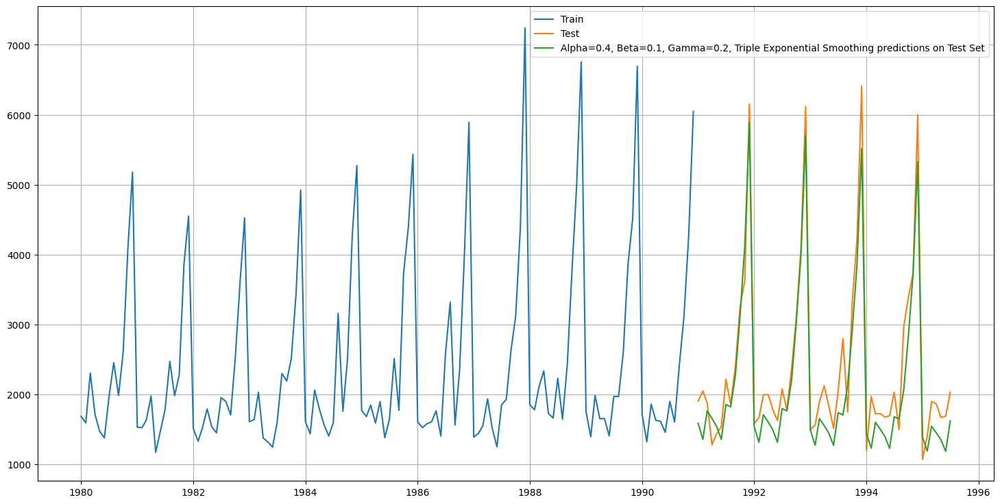

In [96]:
#  Best figures obtained for Trend = Multiplicative and Seasonality = Multiplicative
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination

plt.figure(figsize=(18, 9))

# Plotting the actual training and test data
plt.plot(TES_train['Sparkling'], label='Train')
plt.plot(TES_test['Sparkling'], label='Test')

# Ensure the column name for predictions is correct
plt.plot(TES_test['predict_ta_sm'], label='Alpha=0.4, Beta=0.1, Gamma=0.2, Triple Exponential Smoothing predictions on Test Set')

plt.plot(TES_test['predict_ta_sm'], label='Alpha=0.4, Beta=0.1, Gamma=0.2, Triple Exponential Smoothing predictions on Test Set')


# Adding legend and grid
plt.legend(loc='best')
plt.grid()

# Display the plot
plt.show()


In [97]:
import plotly.graph_objects as go

# Initialize the figure
fig = go.Figure()

# Add the actual training data
fig.add_trace(go.Scatter(
    x=TES_train.index,
    y=TES_train['Sparkling'],
    mode='lines',
    name='Train'
))

# Add the actual test data
fig.add_trace(go.Scatter(
    x=TES_test.index,
    y=TES_test['Sparkling'],
    mode='lines',
    name='Test'
))

# Add the predictions from the Triple Exponential Smoothing model
fig.add_trace(go.Scatter(
    x=TES_test.index,
    y=TES_test['predict_ta_sm'],
    mode='lines',
    name='α=0.4, β=0.1, γ=0.2, TES_TA_SM'
))

# Customize the layout
fig.update_layout(
    title='Triple Exponential Smoothing Predictions vs Actual Sales',
    xaxis_title='Time',
    yaxis_title='Sales',
    legend_title='Legend',
    hovermode="x unified",
    width=1200,
    height=700,
    template="plotly_dark"
)

# Add a grid
fig.update_xaxes(showgrid=True)
fig.update_yaxes(showgrid=True)

# Show the plot
fig.show()


## Check for Stationarity

Check for stationarity of the whole Time Series data.
The Augmented Dickey-Fuller test is an unit root test which determines whether there is a unit root and subsequently whether the series is non-stationary.

The hypothesis in a simple form for the ADF test is:


H0 : The Time Series has a unit root and is thus non-stationary.

H1 : The Time Series does not have a unit root and is thus stationary.


In [98]:
from statsmodels.tsa.stattools import adfuller

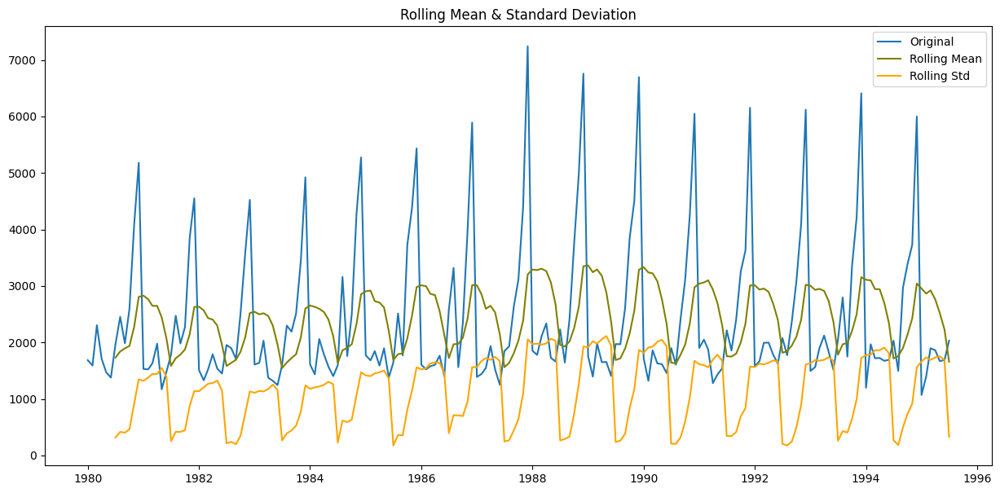

Results of Dickey-Fuller Test:
Test Statistic                  -1.360497
p-value                          0.601061
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [99]:
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean()   # determining the rolling mean
    rolstd = timeseries.rolling(window=7).std()     # determining the rolling standard deviation

    # Plot rolling statistics:
    plt.figure(figsize=(15, 7))
    orig = plt.plot(timeseries, label='Original')
    mean = plt.plot(rolmean, color='olive', label='Rolling Mean')
    std = plt.plot(rolstd, color='orange', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    # Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')
test_stationarity(df_1['Sparkling'])

We see that at 5% significant level the Time Series is non-stationary.

##### Let us take a difference of order 1 and check whether the Time Series is stationary or not.

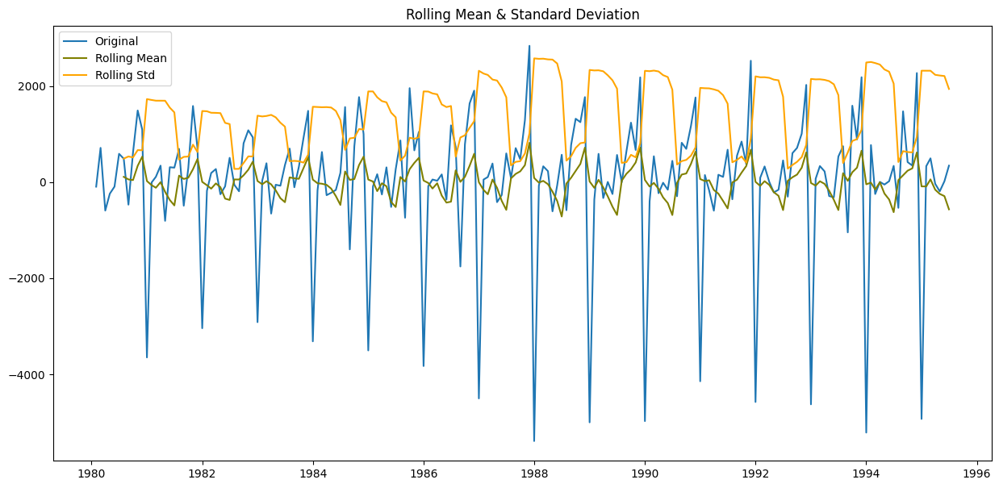

Results of Dickey-Fuller Test:
Test Statistic                 -45.050301
p-value                          0.000000
#Lags Used                      10.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [100]:
test_stationarity(df_1['Sparkling'].diff().dropna())

We observe that the p-value (α) is less than 0.05. Therefore, we reject the null hypothesis. This result suggests that the time series is stationary, meaning its statistical properties such as mean, variance, and autocorrelation remain constant over time.

## Model Building - Stationary Data

Generate ACF & PACF Plot and find the AR, MA values

ACF and PACF Plots

In [101]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

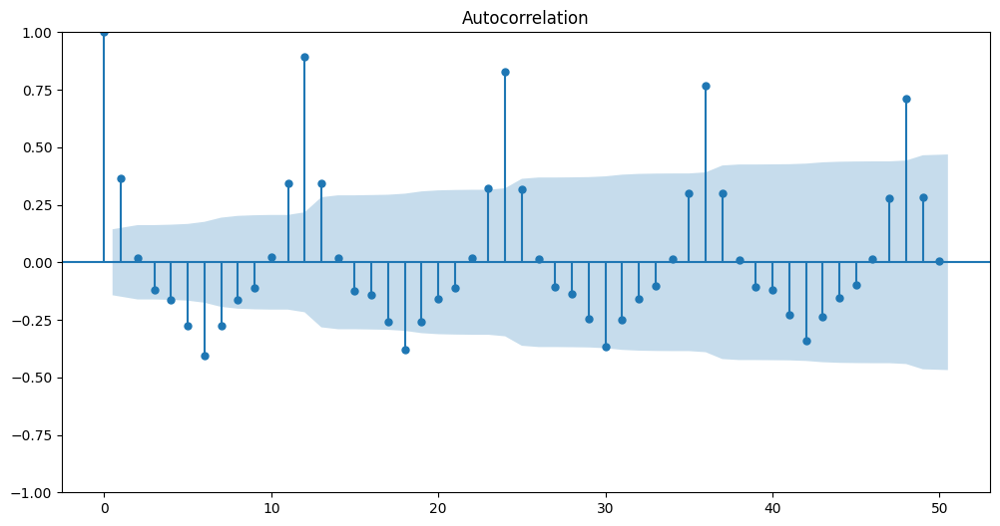

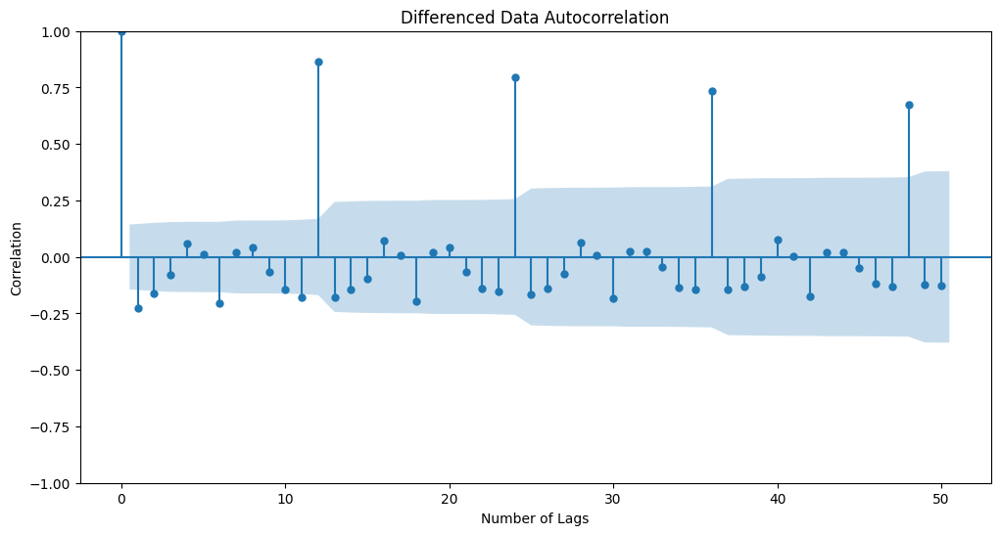

In [102]:
plot_acf(df_1['Sparkling'],lags=50)
plot_acf(df_1['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

PACF Plot

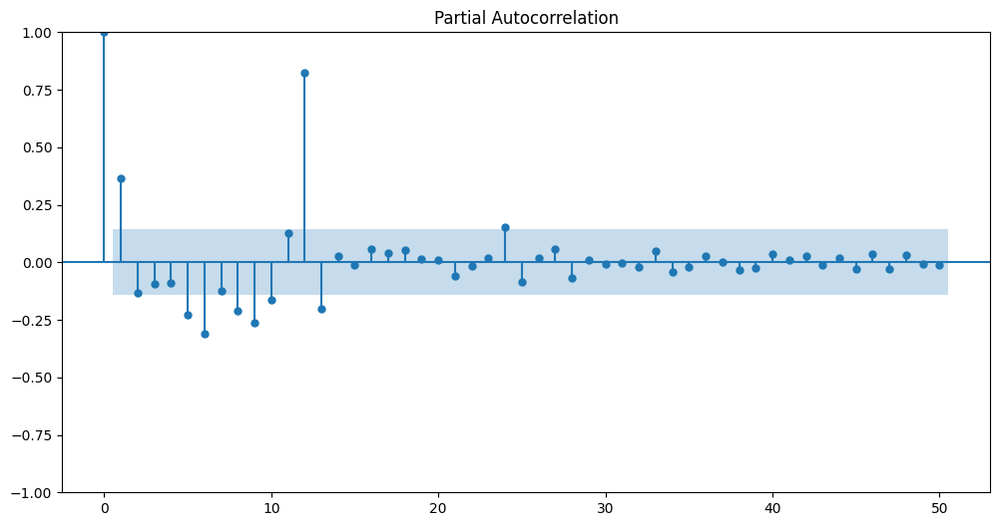

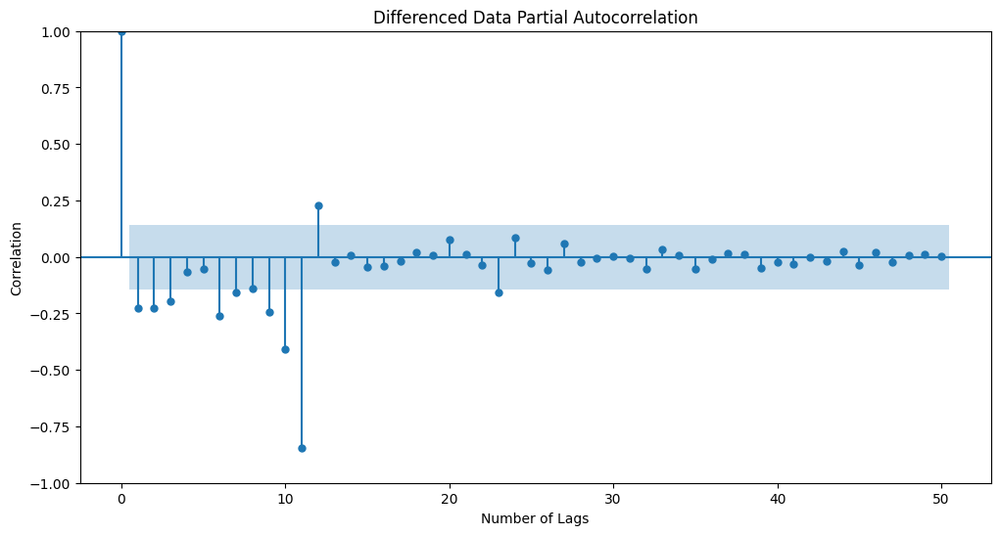

In [103]:
plot_pacf(df_1['Sparkling'],lags=50)
plot_pacf(df_1['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

#### Split the data into train and test and plot the training and test data.

Training Data is till the end of 1990. Test Data is from the beginning of 1991 to the last time stamp provided.

In [104]:
train = df_1[df_1.index < '1991']
test = df_1[df_1.index >= '1991']

In [105]:
from IPython.display import display

print('First few rows of Training Data')  # Display the first five rows of the training data
display(train.head())

print('Last few rows of Training Data')   # Display the Last five rows of the training data
display(train.tail())

print('First few rows of Test Data')     # Display the first five rows of the test data
display(test.head())

print('Last few rows of Test Data')      # Display the Last five rows of the test data
display(test.tail())

First few rows of Training Data


,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


Last few rows of Training Data


,Sparkling
YearMonth,
1990-08-01,1605
1990-09-01,2424
1990-10-01,3116
1990-11-01,4286
1990-12-01,6047


First few rows of Test Data


,Sparkling
YearMonth,
1991-01-01,1902
1991-02-01,2049
1991-03-01,1874
1991-04-01,1279
1991-05-01,1432


Last few rows of Test Data


,Sparkling
YearMonth,
1995-03-01,1897
1995-04-01,1862
1995-05-01,1670
1995-06-01,1688
1995-07-01,2031


In [106]:
# Check the Shape of Data
print(train.shape)
print(test.shape)

(132, 1)
(55, 1)


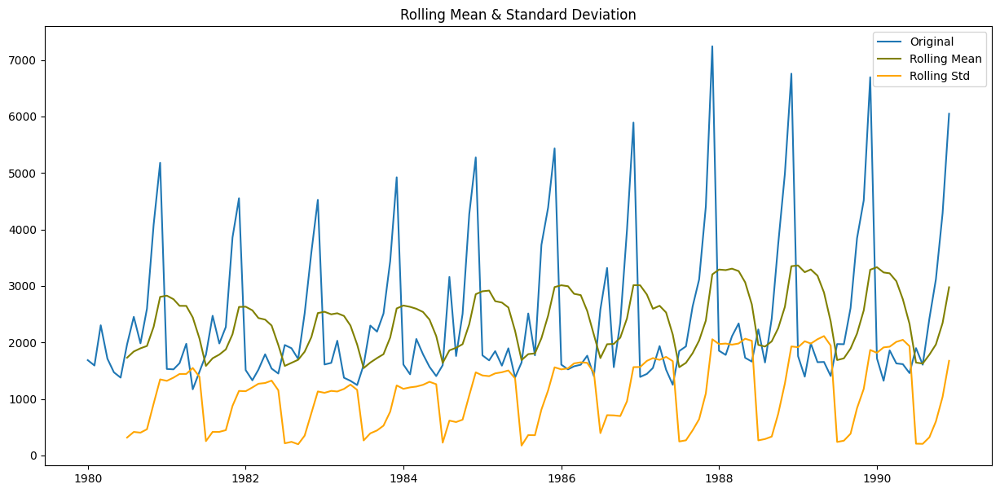

Results of Dickey-Fuller Test:
Test Statistic                  -1.208926
p-value                          0.669744
#Lags Used                      12.000000
Number of Observations Used    119.000000
Critical Value (1%)             -3.486535
Critical Value (5%)             -2.886151
Critical Value (10%)            -2.579896
dtype: float64 



In [107]:
test_stationarity(train['Sparkling'])       # Check the stationarity of the training data

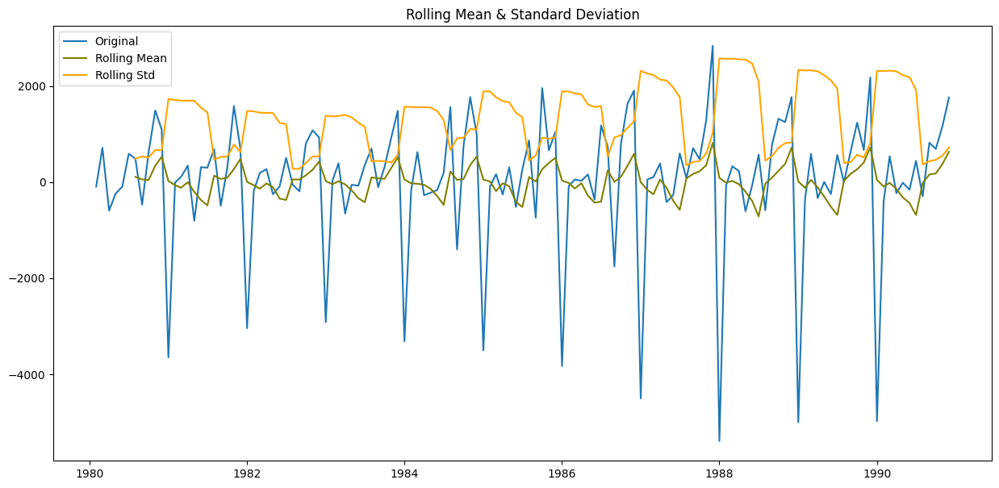

Results of Dickey-Fuller Test:
Test Statistic                -8.005007e+00
p-value                        2.280104e-12
#Lags Used                     1.100000e+01
Number of Observations Used    1.190000e+02
Critical Value (1%)           -3.486535e+00
Critical Value (5%)           -2.886151e+00
Critical Value (10%)          -2.579896e+00
dtype: float64 



In [108]:
test_stationarity(train['Sparkling'].diff().dropna())

We observe that the p-value (α) is greater than 0.05. Therefore, we fail to reject the null hypothesis. This result suggests that the time series is not stationary, meaning its statistical properties, such as mean, variance, and autocorrelation, change over time.

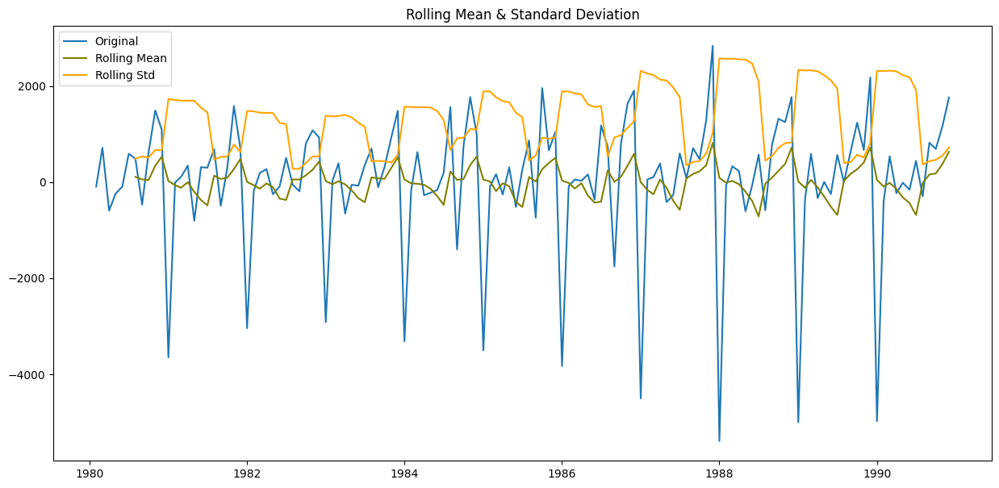

Results of Dickey-Fuller Test:
Test Statistic                -8.005007e+00
p-value                        2.280104e-12
#Lags Used                     1.100000e+01
Number of Observations Used    1.190000e+02
Critical Value (1%)           -3.486535e+00
Critical Value (5%)           -2.886151e+00
Critical Value (10%)          -2.579896e+00
dtype: float64 



In [109]:
# Check the stationarity of the differenced Training data
test_stationarity(train['Sparkling'].diff().dropna())

We see that after taking a difference of order 1 the series have become stationary at  α  = 0.05.

#### Build an Automated version of an <font color='blue'>ARIMA model</font> for which the best parameters are selected in accordance with the lowest Akaike Information Criteria (AIC).

###### Build the Auto ARIMA

In [110]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

# Parameters for ARIMA
import itertools
p = q = range(0, 4)
d = [1]                         # d=1 to ensure stationarity
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1, len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)


In [111]:
# Creating an empty DataFrame with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [112]:
# Looping through parameter combinations to fit the ARIMA model

for param in pdq:
    ARIMA_model = ARIMA(train['Sparkling'], order=param).fit()    # Fit the ARIMA model
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model.aic))  # Find the AIC values
    ARIMA_AIC = pd.concat([ARIMA_AIC, pd.DataFrame([{'param': param, 'AIC': ARIMA_model.aic}])], ignore_index=True)

ARIMA(0, 1, 0) - AIC:2267.6630357855465
ARIMA(0, 1, 1) - AIC:2263.0600155919765
ARIMA(0, 1, 2) - AIC:2234.4083231352784
ARIMA(0, 1, 3) - AIC:2233.994857751357
ARIMA(1, 1, 0) - AIC:2266.6085393190097
ARIMA(1, 1, 1) - AIC:2235.755094674255
ARIMA(1, 1, 2) - AIC:2234.5272004518056
ARIMA(1, 1, 3) - AIC:2235.607815816486
ARIMA(2, 1, 0) - AIC:2260.36574396809
ARIMA(2, 1, 1) - AIC:2233.777626238336
ARIMA(2, 1, 2) - AIC:2213.5092125741553
ARIMA(2, 1, 3) - AIC:2232.8129550828717
ARIMA(3, 1, 0) - AIC:2257.72337899794
ARIMA(3, 1, 1) - AIC:2235.5004238522542
ARIMA(3, 1, 2) - AIC:2230.789978305661
ARIMA(3, 1, 3) - AIC:2221.4573978076833


In [113]:
# Sort the AIC values to find the best parameters
ARIMA_AIC.sort_values(by='AIC', ascending=True).head(10)

,param,AIC
10,"(2, 1, 2)",2213.509213
15,"(3, 1, 3)",2221.457398
14,"(3, 1, 2)",2230.789978
11,"(2, 1, 3)",2232.812955
9,"(2, 1, 1)",2233.777626
3,"(0, 1, 3)",2233.994858
2,"(0, 1, 2)",2234.408323
6,"(1, 1, 2)",2234.527200
13,"(3, 1, 1)",2235.500424
7,"(1, 1, 3)",2235.607816


In [114]:
from statsmodels.tsa.arima.model import ARIMA

train = train.asfreq('MS')

# Building the ARIMA model based on the best AIC values
auto_ARIMA = ARIMA(train['Sparkling'], order=param)

# Fit the Auto ARIMA model
results_auto_ARIMA = auto_ARIMA.fit()

# Print the summary result
print(results_auto_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  132
Model:                 ARIMA(3, 1, 3)   Log Likelihood               -1103.729
Date:                Sun, 18 Aug 2024   AIC                           2221.457
Time:                        04:24:08   BIC                           2241.584
Sample:                    01-01-1980   HQIC                          2229.636
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4756      0.143      3.333      0.001       0.196       0.755
ar.L2         -0.9855      0.054    -18.100      0.000      -1.092      -0.879
ar.L3          0.4824      0.118      4.096      0.0

In [115]:
# Predict on the Test Set using this model
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test))  # Forecast the test data

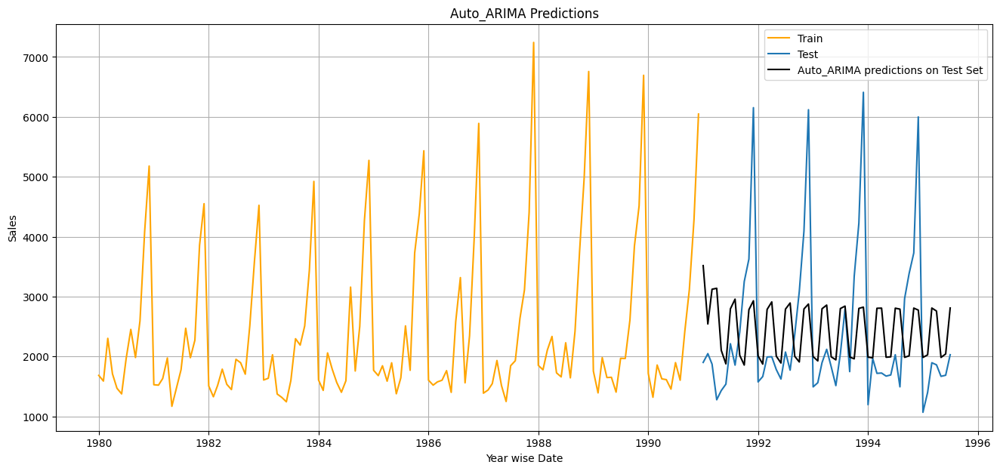

In [116]:
# Plotting on both the Training and Test data using autofit
plt.figure(figsize=(16, 7))

plt.plot(TES_train['Sparkling'], label='Train', color ='orange')
plt.plot(TES_test['Sparkling'], label='Test')

# Plot predictions made by the Auto ARIMA model
plt.plot(predicted_auto_ARIMA, label='Auto_ARIMA predictions on Test Set', color = 'black')

plt.legend(loc='best')
plt.title('Auto_ARIMA Predictions')
plt.ylabel('Sales')
plt.xlabel('Year wise Date')
plt.grid()
plt.show() # Forecast using the auto ARIMA

#### Diagnostics plot

<Figure size 1800x800 with 0 Axes>

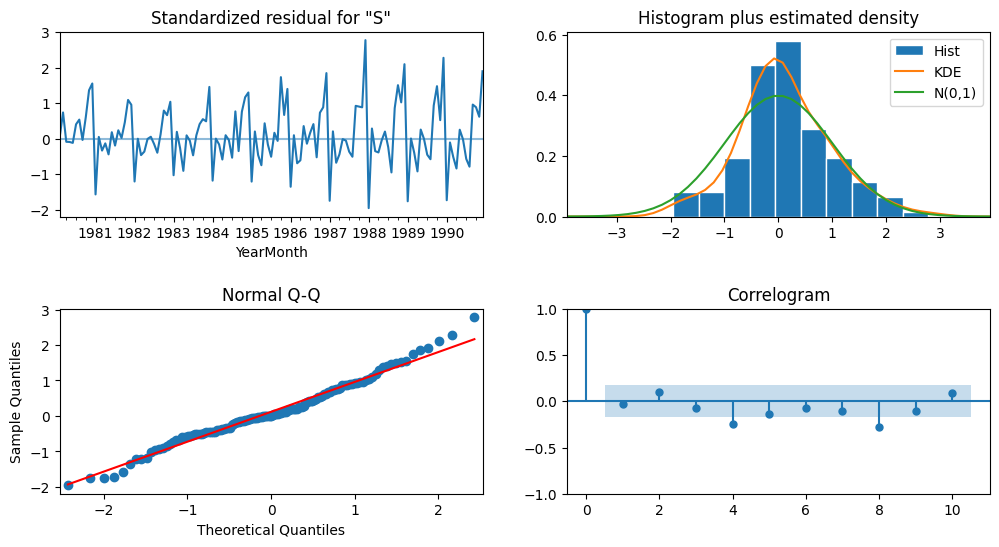

In [117]:
plt.figure(figsize=(18, 8));
results_auto_ARIMA.plot_diagnostics()
plt.subplots_adjust(hspace=0.5)  # Adjusts the height spacing between the subplots
plt.show();

In [118]:
# Calculate RMSE on test data
rmse = mean_squared_error(test['Sparkling'], predicted_auto_ARIMA, squared=False)
print(rmse)

1229.272591696495


In [119]:
# Assuming 'rmse' has already been calculated for the Auto ARIMA model
resultsDf_temp_1 = pd.DataFrame({'Test RMSE': [rmse]}, index=['Auto ARIMA'])

# Concatenate the new results with the existing resultsDf
resultsDf = pd.concat([resultsDf, resultsDf_temp_1])

# Display the updated DataFrame
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405
"Alpha=0.1,SimpleExponentialSmoothing",1375.393398
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",1778.564670
"α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential_auto_fit(Trend = Add, Seasonality = Add)",378.626241


#### <font color='Black'>Build the Manual ARIMA </font>

In [120]:
# Fit the Manual ARIMA model

manual_ARIMA = ARIMA(train['Sparkling'], order=(2,1,2))
results_manual_ARIMA = manual_ARIMA.fit()
print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  132
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -1101.755
Date:                Sun, 18 Aug 2024   AIC                           2213.509
Time:                        04:24:10   BIC                           2227.885
Sample:                    01-01-1980   HQIC                          2219.351
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3121      0.046     28.782      0.000       1.223       1.401
ar.L2         -0.5593      0.072     -7.740      0.000      -0.701      -0.418
ma.L1         -1.9917      0.109    -18.215      0.0

##### Create the diagnostic Plot for Manual ARIMA

<Figure size 1600x800 with 0 Axes>

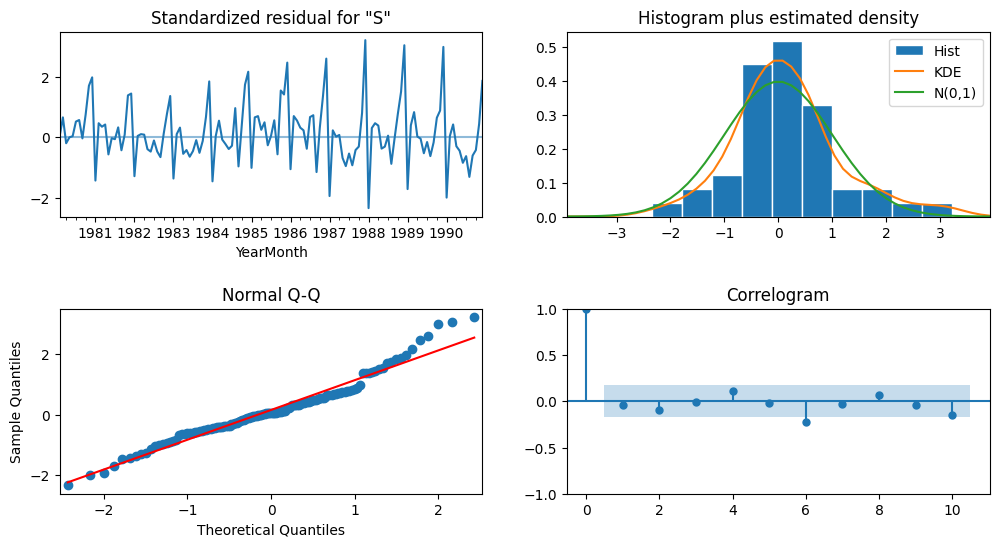

In [121]:
plt.figure(figsize=(16, 8))
results_manual_ARIMA.plot_diagnostics();
plt.subplots_adjust(hspace=0.5)  # Adjusts the height spacing between the subplots
plt.show()

Predict on the Test Set using this Model and Evaluate the model.

In [122]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

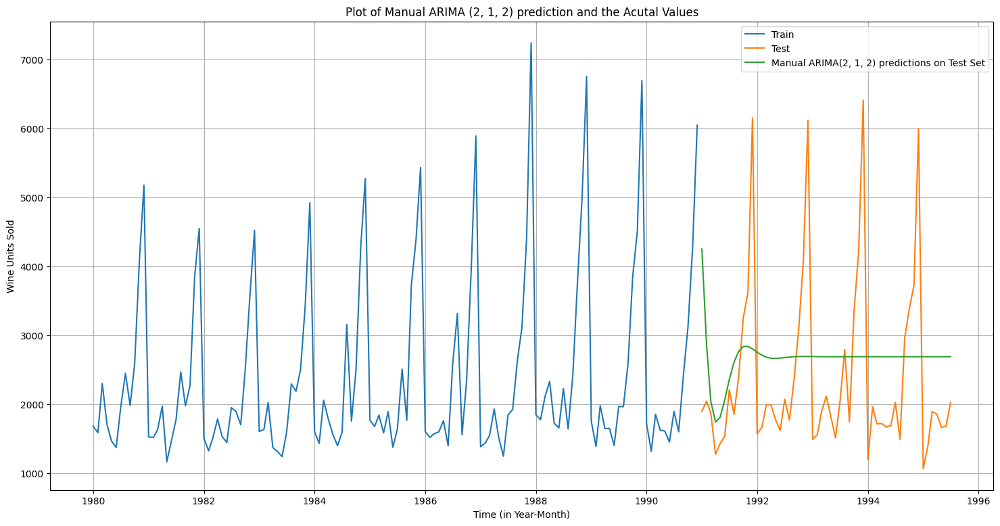

In [123]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA(2, 1, 2) predictions on Test Set')

plt.legend(loc='best')
plt.title('Plot of Manual ARIMA (2, 1, 2) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

In [124]:
rmse = mean_squared_error(test['Sparkling'],predicted_manual_ARIMA,squared=False)
print('RMSE:',rmse)

RMSE: 1299.9797494286825


In [125]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['Manual ARIMA(2,1,2)'])

resultsDf = pd.concat([resultsDf, temp_resultsDf])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405
"Alpha=0.1,SimpleExponentialSmoothing",1375.393398
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",1778.564670
"α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential_auto_fit(Trend = Add, Seasonality = Add)",378.626241


#### <font color='Green'>Build the Auto SARIMA </font>

Let us look at the ACF plot once more to understand the seasonal parameter for the SARIMA model.

Text(0, 0.5, 'Correlation')

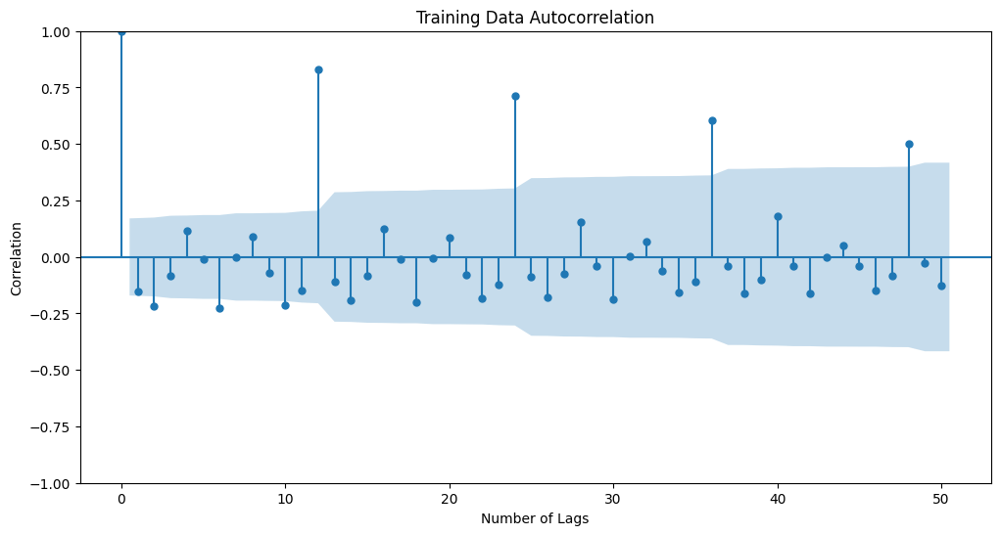

In [126]:
plot_acf(train.diff(),title='Training Data Autocorrelation',missing='drop',lags=50);
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

We can see that there is a seasonality.

In [127]:
import itertools
import statsmodels.api as sm
import pandas as pd


# Define the range of p, d, q, and seasonal parameters
p = q = range(0, 4)
d = [1]
D = range(0, 1)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 6) for x in list(itertools.product(p, D, q))]

# Print some parameter combinations for SARIMA
print('Examples of some parameter combinations for the Model...')
for i in range(1, len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))


Examples of some parameter combinations for the Model...
Model: (0, 1, 1)(0, 0, 1, 6)
Model: (0, 1, 2)(0, 0, 2, 6)
Model: (0, 1, 3)(0, 0, 3, 6)
Model: (1, 1, 0)(1, 0, 0, 6)
Model: (1, 1, 1)(1, 0, 1, 6)
Model: (1, 1, 2)(1, 0, 2, 6)
Model: (1, 1, 3)(1, 0, 3, 6)
Model: (2, 1, 0)(2, 0, 0, 6)
Model: (2, 1, 1)(2, 0, 1, 6)
Model: (2, 1, 2)(2, 0, 2, 6)
Model: (2, 1, 3)(2, 0, 3, 6)
Model: (3, 1, 0)(3, 0, 0, 6)
Model: (3, 1, 1)(3, 0, 1, 6)
Model: (3, 1, 2)(3, 0, 2, 6)
Model: (3, 1, 3)(3, 0, 3, 6)


In [128]:
# Create an empty DataFrame to store AIC values
SARIMA_AIC = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

In [129]:
# Loop through all parameter combinations
for param in pdq:
    for param_seasonal in model_pdq:
        try:
            # Fit the SARIMA model
            SARIMA_model = sm.tsa.statespace.SARIMAX(
                train['Sparkling'],
                order=param,
                seasonal_order=param_seasonal,
                enforce_stationarity=False,
                enforce_invertibility=False
            ).fit(disp=False)

            # Store the AIC value in the DataFrame
            SARIMA_AIC = pd.concat([
                SARIMA_AIC,
                pd.DataFrame({'param': [param], 'seasonal': [param_seasonal], 'AIC': [SARIMA_model.aic]})
            ], ignore_index=True)

            print(f"SARIMA{param}x{param_seasonal} - AIC: {SARIMA_model.aic}")

        except Exception as e:
            print(f"SARIMA{param}x{param_seasonal} - Failed: {e}")
            continue

SARIMA(0, 1, 0)x(0, 0, 0, 6) - AIC: 2251.3597196862966
SARIMA(0, 1, 0)x(0, 0, 1, 6) - AIC: 2152.3780761716284
SARIMA(0, 1, 0)x(0, 0, 2, 6) - AIC: 1955.6355536890958
SARIMA(0, 1, 0)x(0, 0, 3, 6) - AIC: 1863.7845154973188
SARIMA(0, 1, 0)x(1, 0, 0, 6) - AIC: 2164.4097581959904
SARIMA(0, 1, 0)x(1, 0, 1, 6) - AIC: 2079.5599844432804
SARIMA(0, 1, 0)x(1, 0, 2, 6) - AIC: 1926.9360110923017
SARIMA(0, 1, 0)x(1, 0, 3, 6) - AIC: 1803.39290949949
SARIMA(0, 1, 0)x(2, 0, 0, 6) - AIC: 1839.401298687227
SARIMA(0, 1, 0)x(2, 0, 1, 6) - AIC: 1841.1993617510464
SARIMA(0, 1, 0)x(2, 0, 2, 6) - AIC: 1810.9177805657741
SARIMA(0, 1, 0)x(2, 0, 3, 6) - AIC: 1725.537642554979
SARIMA(0, 1, 0)x(3, 0, 0, 6) - AIC: 1748.7622668155268
SARIMA(0, 1, 0)x(3, 0, 1, 6) - AIC: 1750.6879953816776
SARIMA(0, 1, 0)x(3, 0, 2, 6) - AIC: 1739.4489858032139
SARIMA(0, 1, 0)x(3, 0, 3, 6) - AIC: 1725.0143597901642
SARIMA(0, 1, 1)x(0, 0, 0, 6) - AIC: 2230.162907850583
SARIMA(0, 1, 1)x(0, 0, 1, 6) - AIC: 2130.5652859082816
SARIMA(0, 1, 1)

In [130]:
# Sort by AIC to find the best parameters
SARIMA_AIC = SARIMA_AIC.sort_values(by='AIC', ascending=True)
print(SARIMA_AIC.head())

         param      seasonal          AIC
59   (0, 1, 3)  (2, 0, 3, 6)  1633.630990
127  (1, 1, 3)  (3, 0, 3, 6)  1651.791660
47   (0, 1, 2)  (3, 0, 3, 6)  1653.691960
27   (0, 1, 1)  (2, 0, 3, 6)  1661.096259
220  (3, 1, 1)  (3, 0, 0, 6)  1663.279233


In [131]:
import statsmodels.api as sm

auto_SARIMA = sm.tsa.statespace.SARIMAX(train['Sparkling'].values,
                                order=param,
                                seasonal_order=param_seasonal,
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA = auto_SARIMA.fit(maxiter=1000)
print(results_auto_SARIMA.summary())

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  132
Model:             SARIMAX(3, 1, 3)x(3, 0, 3, 6)   Log Likelihood                -806.221
Date:                           Sun, 18 Aug 2024   AIC                           1638.441
Time:                                   04:27:20   BIC                           1673.429
Sample:                                        0   HQIC                          1652.630
                                           - 132                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.6064      0.182      8.818      0.000       1.249       1.963
ar.L2         -1.0375      0.278     -3.735

<Figure size 1600x800 with 0 Axes>

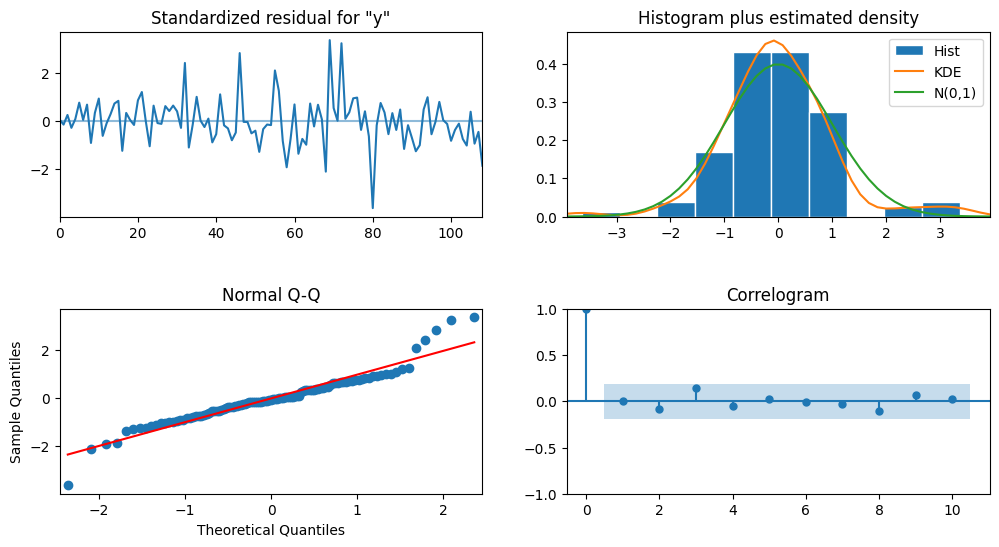

In [132]:
plt.figure(figsize=(16, 8))
results_auto_SARIMA.plot_diagnostics();
plt.subplots_adjust(hspace=0.5)  # Adjusts the height spacing between the subplots
plt.show();

In [133]:
# Generate predictions on the test set
predictions_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(test))

# Extract the predicted mean values
predicted_mean = predictions_auto_SARIMA.predicted_mean

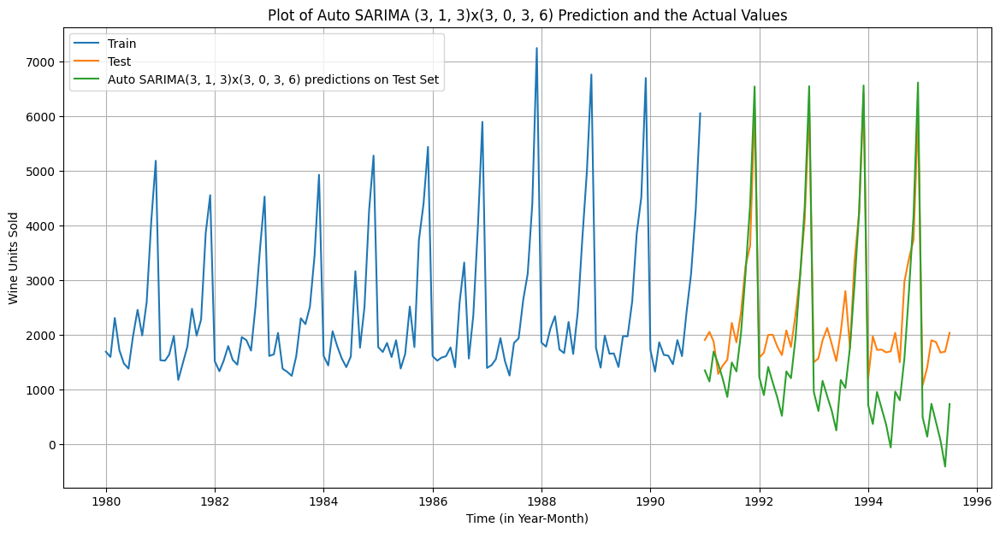

In [134]:
# Plotting on both the Training and Test data

plt.figure(figsize=(14, 7))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')
plt.plot(test.index, predicted_mean, label='Auto SARIMA(3, 1, 3)x(3, 0, 3, 6) predictions on Test Set')
plt.legend(loc='best')
plt.title('Plot of Auto SARIMA (3, 1, 3)x(3, 0, 3, 6) Prediction and the Actual Values')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid()
plt.show()

#### Predict on the Test Set using this model and Evaluate the model.

In [135]:
rmse = mean_squared_error(test['Sparkling'], predictions_auto_SARIMA.predicted_mean,squared=False)
print('RMSE:',rmse)

RMSE: 927.2277539348062


In [136]:
temp_resultsDf = pd.DataFrame({'Test RMSE': [rmse]}
                           ,index=['Auto_SARIMA(3, 1, 3)x(3, 0, 3, 6)'])


resultsDf = pd.concat([resultsDf,temp_resultsDf])

resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405
"Alpha=0.1,SimpleExponentialSmoothing",1375.393398
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",1778.564670
"α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential_auto_fit(Trend = Add, Seasonality = Add)",378.626241


#### Manual SARIMA Model

In [137]:
# Create an empty DataFrame to store AIC values
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [138]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(train['Sparkling'].values,
                                order=(0, 1, 3),
                                seasonal_order=(2, 0, 3, 6),
                                enforc1e_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA.summary())

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  132
Model:             SARIMAX(0, 1, 3)x(2, 0, 3, 6)   Log Likelihood                -990.835
Date:                           Sun, 18 Aug 2024   AIC                           1999.670
Time:                                   04:27:30   BIC                           2025.547
Sample:                                        0   HQIC                          2010.185
                                           - 132                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7601      0.131     -5.815      0.000      -1.016      -0.504
ma.L2         -0.2315      0.119     -1.940

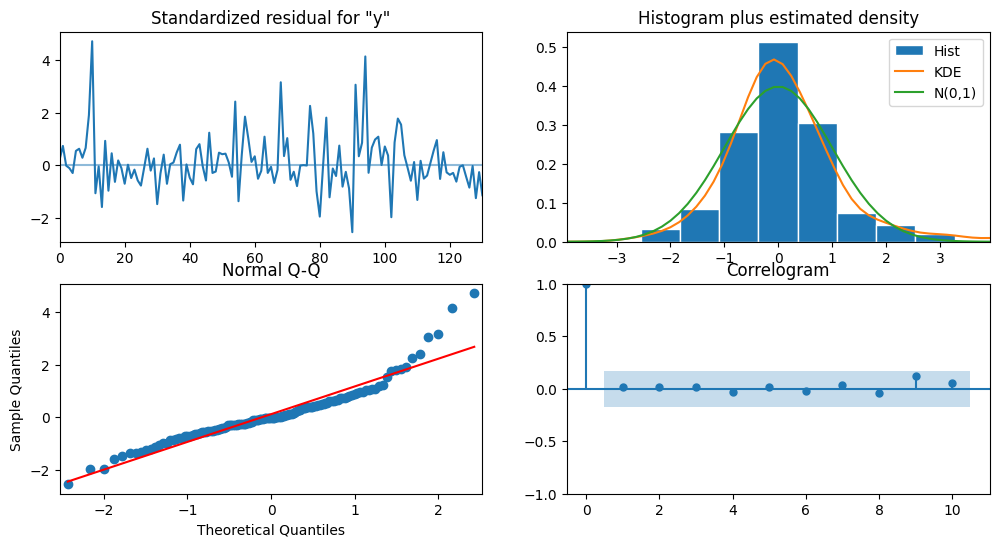

In [139]:
 # Create the diagnostics plot of Manual SARIMA
results_manual_SARIMA.plot_diagnostics()
plt.show()

In [140]:
# Generate predictions on the test set
predicted_manual_SARIMA_6 = results_manual_SARIMA.get_forecast(steps=len(test))
predicted_manual_SARIMA_6.summary_frame(alpha=0.05).head()

# Extract the predicted mean values
predicted_mean_1 = predicted_manual_SARIMA_6.predicted_mean

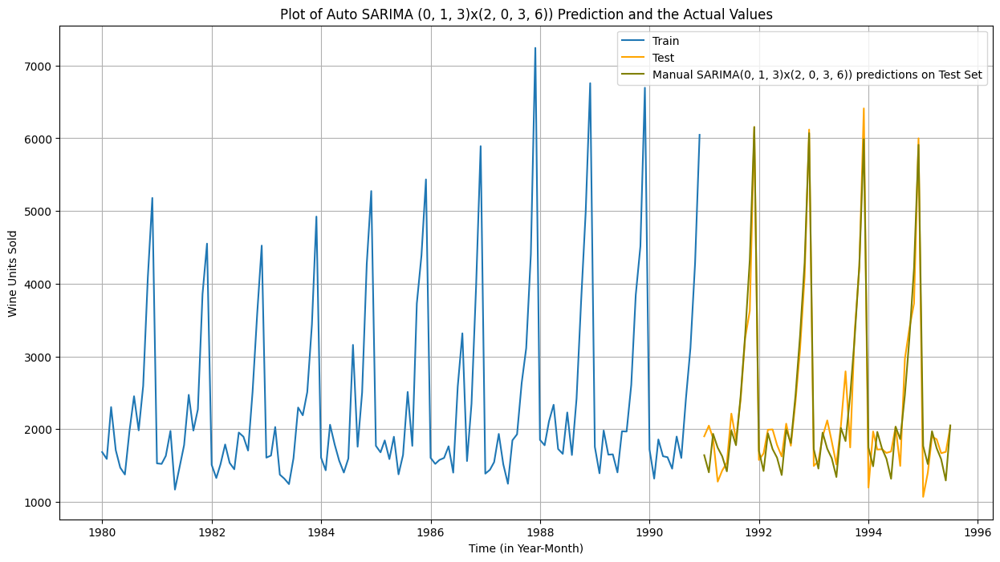

In [141]:
# Plotting on both the Training and Test data

plt.figure(figsize=(15, 8))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test', color='orange')
plt.plot(test.index, predicted_mean_1, color='olive',label='Manual SARIMA(0, 1, 3)x(2, 0, 3, 6)) predictions on Test Set')
plt.legend(loc='best')
plt.title('Plot of Auto SARIMA (0, 1, 3)x(2, 0, 3, 6)) Prediction and the Actual Values')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid()
plt.show()

In [142]:
# Calculate RMSE on test data
rmse_manual_sarima = mean_squared_error(test['Sparkling'],predicted_mean_1, squared=False)
print(rmse_manual_sarima)

320.21988160804887


In [143]:
# Add into the DataFrame with the results
resultsDf_10_1 = pd.DataFrame({'Test RMSE': rmse_manual_sarima}
                           ,index=['Manual_SARIMA(0, 1, 3)x(2, 0, 3, 6))'])

resultsDf = pd.concat([resultsDf, resultsDf_10_1])
resultsDf

,Test RMSE
RegressionOnTime,1389.135175
Simple Average Model,1275.081804
2 Point Trailing Moving Average,813.400684
4 Point Trailing Moving Average,1156.589694
6 Point Trailing Moving Average,1283.927428
9 Point Trailing Moving Average,1346.278315
"Alpha = 0.03953, Simple Exponential Smoothing",1304.927405
"Alpha=0.1,SimpleExponentialSmoothing",1375.393398
"Alpha Value = 0.1, beta value = 0.1, DoubleExponentialSmoothing",1778.564670
"α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential_auto_fit(Trend = Add, Seasonality = Add)",378.626241


## Compare the performance of all the models built

#### Sort the DataFrame by RMSE in ascending order for ALL created Model

In [144]:
resultsDf = resultsDf.sort_values(by=['Test RMSE'],ascending=True)
resultsDf

,Test RMSE
"α=0.4, β=0.1, γ=0.2,TripleExponentialSmoothing_ta_sm",317.434302
"Manual_SARIMA(0, 1, 3)x(2, 0, 3, 6))",320.219882
"α = 0.111272, β = 0.012360, γ = 0.460717 Tripple Exponential_auto_fit(Trend = Add, Seasonality = Add)",378.626241
2 Point Trailing Moving Average,813.400684
"Auto_SARIMA(3, 1, 3)x(3, 0, 3, 6)",927.227754
4 Point Trailing Moving Average,1156.589694
Auto ARIMA,1229.272592
Simple Average Model,1275.081804
6 Point Trailing Moving Average,1283.927428
"Manual ARIMA(2,1,2)",1299.979749


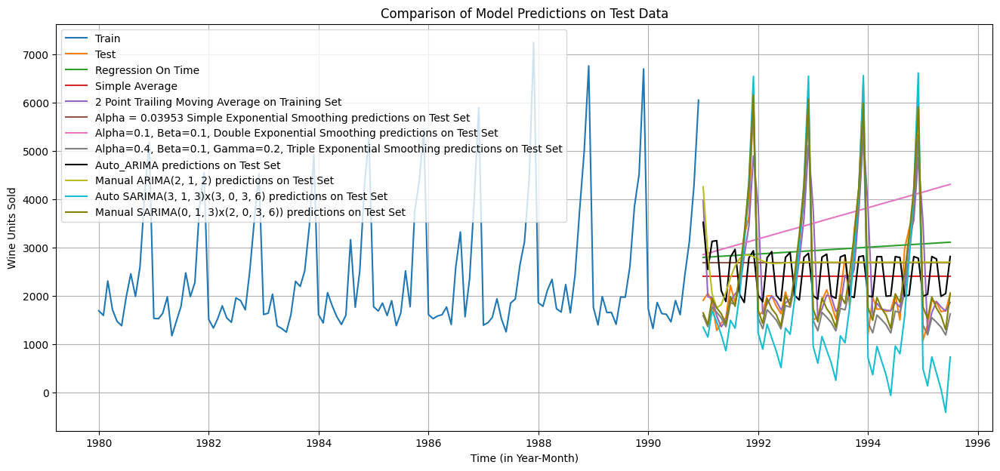

In [154]:
# Set the Figure Size
plt.figure(figsize=(16, 7))

# Plot Train and Test Data
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'],  label='Test')

# Plot Various Model Predictions
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time')
plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average')
plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')
plt.plot(SES_test['predict'], label='Alpha = 0.03953 Simple Exponential Smoothing predictions on Test Set')


plt.plot(DES_test['predict_0.1_0.1'], label='Alpha=0.1, Beta=0.1, Double Exponential Smoothing predictions on Test Set')

plt.plot(TES_test['predict_ta_sm'], label='Alpha=0.4, Beta=0.1, Gamma=0.2, Triple Exponential Smoothing predictions on Test Set')

plt.plot(predicted_auto_ARIMA, label='Auto_ARIMA predictions on Test Set', color = 'black')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA(2, 1, 2) predictions on Test Set')

plt.plot(test.index, predicted_mean, label='Auto SARIMA(3, 1, 3)x(3, 0, 3, 6) predictions on Test Set')

plt.plot(test.index, predicted_mean_1, color='olive',label='Manual SARIMA(0, 1, 3)x(2, 0, 3, 6)) predictions on Test Set')



# Add legend, title, and labels
plt.legend(loc='best')
plt.title('Comparison of Model Predictions on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid()
plt.show()



##### Analysis Summary
After evaluating various time series forecasting models, the model that exhibited the best performance is the Triple Exponential Smoothing model with parameters Alpha=0.4, Beta=0.1, Gamma=0.2. This model achieved the lowest Root Mean Square Error (RMSE) of 317.434302.




##### Best Model
The Triple Exponential Smoothing (Alpha=0.4, Beta=0.1, Gamma=0.2) model demonstrated superior accuracy in predicting the dataset, outperforming other models such as Manual ARIMA and various moving average techniques. The low RMSE value indicates that this model has the best fit, making it the most reliable choice for forecasting in this context.

#### Rebuild the Best Model using the Entire data - Make a Forecast for the Next 12 Months

In [158]:
# Set the frequency to monthly (or whatever is appropriate for your data)
df_1 = df_1.asfreq('MS')

# Fit the Triple Exponential Smoothing model on the entire dataset
model_TES_full = ExponentialSmoothing(
    df_1['Sparkling'],
    trend='additive',
    seasonal='multiplicative',
    seasonal_periods=12
)

In [159]:
# Set the parameters Alpha, Beta, and Gamma
alpha = 0.4
beta = 0.1
gamma = 0.2

In [160]:
# Fit the model
model_TES_fitted = model_TES_full.fit(
    smoothing_level=alpha,
    smoothing_slope=beta,
    smoothing_seasonal=gamma,
    optimized=False,
    use_brute=True
)

In [161]:
# Forecast the next 12 months
forecast = model_TES_fitted.forecast(steps=12)
print(forecast)

1995-08-01    2088.425429
1995-09-01    2614.039802
1995-10-01    3457.976195
1995-11-01    4330.695877
1995-12-01    6595.144301
1996-01-01    1550.768494
1996-02-01    1832.282175
1996-03-01    2074.922505
1996-04-01    2002.415693
1996-05-01    1821.629000
1996-06-01    1708.486723
1996-07-01    2190.179438
Freq: MS, dtype: float64


In [194]:
# Calculate confidence intervals (95% confidence interval as an example)
forecast_std_error = np.std(model_TES_fitted.resid, ddof=1)
confidence_interval = 1.96 * forecast_std_error  # 95% confidence interval

lower_bound = forecast - confidence_interval
upper_bound = forecast + confidence_interval

In [195]:
import plotly.graph_objects as go

# Initialize the figure
fig = go.Figure()

# Plot the historical sales
fig.add_trace(go.Scatter(
    x=df_1.index,
    y=df_1['Sparkling'],
    mode='lines',
    name='Historical Sales'
))

# Plot the forecast
fig.add_trace(go.Scatter(
    x=forecast.index,
    y=forecast,
    mode='lines',
    name='Forecast',
    line=dict(color='green')
))

# Plot the confidence intervals
fig.add_trace(go.Scatter(
    x=forecast.index.tolist() + forecast.index.tolist()[::-1],
    y=lower_bound.tolist() + upper_bound.tolist()[::-1],
    fill='toself',
    fillcolor='lightgreen',
    line=dict(color='lightgreen'),
    opacity=0.4,
    name='95% Confidence Interval'
))

# Customize the layout
fig.update_layout(
    title='Sales Forecast with Confidence Intervals',
    xaxis_title='Time (in Year-Month)',
    yaxis_title='Wine Units Sold',
    legend_title='Legend',
    hovermode="x unified",
    width=1250,
    height=700
)

# Add a grid
fig.update_xaxes(showgrid=True)
fig.update_yaxes(showgrid=True)

# Show the plot
fig.show()


In [196]:
import pandas as pd

# Assuming forecast, lower_bound, and upper_bound are pandas Series with datetime index

# Combine the forecast data with confidence intervals into a single DataFrame
forecast_df = pd.DataFrame({
    'Forecast': forecast,
    'Lower Bound': lower_bound,
    'Upper Bound': upper_bound
})

# Convert the index to a more readable format (e.g., YYYY-MM)
forecast_df.index = forecast_df.index.strftime('%Y-%m')

# Display the data month-wise
print(forecast_df)


            Forecast  Lower Bound  Upper Bound
1995-08  2088.425429  1329.842420  2847.008439
1995-09  2614.039802  1855.456792  3372.622811
1995-10  3457.976195  2699.393185  4216.559204
1995-11  4330.695877  3572.112868  5089.278887
1995-12  6595.144301  5836.561291  7353.727310
1996-01  1550.768494   792.185485  2309.351503
1996-02  1832.282175  1073.699166  2590.865185
1996-03  2074.922505  1316.339496  2833.505515
1996-04  2002.415693  1243.832684  2760.998702
1996-05  1821.629000  1063.045990  2580.212009
1996-06  1708.486723   949.903714  2467.069733
1996-07  2190.179438  1431.596429  2948.762447


In [197]:
import plotly.graph_objects as go

# Filter the forecast data to only include August 1995 to July 1996
forecast_filtered = forecast['1995-08-01':'1996-07-31']
lower_bound_filtered = lower_bound['1995-08-01':'1996-07-31']
upper_bound_filtered = upper_bound['1995-08-01':'1996-07-31']

# Initialize the figure
fig = go.Figure()

# Plot the filtered forecast
fig.add_trace(go.Scatter(
    x=forecast_filtered.index,
    y=forecast_filtered,
    mode='lines+markers',
    name='Forecast',
    line=dict(color='green')
))

# Plot the confidence intervals for the filtered data
fig.add_trace(go.Scatter(
    x=forecast_filtered.index.tolist() + forecast_filtered.index.tolist()[::-1],
    y=lower_bound_filtered.tolist() + upper_bound_filtered.tolist()[::-1],
    fill='toself',
    fillcolor='lightgreen',
    line=dict(color='lightblue'),
    opacity=0.4,
    name='95% Confidence Interval'
))

# Customize the layout
fig.update_layout(
    title='Sales Forecast with Confidence Intervals (Aug 1995 - Jul 1996)',
    xaxis_title='Month',
    yaxis_title='Wine Units Sold',
    legend_title='Legend',
    hovermode="x unified",
    width=1300,
    height=700,
)

# Ensure that the x-axis displays month-wise ticks
fig.update_xaxes(
    tickmode='array',
    tickvals=forecast_filtered.index,
    ticktext=[date.strftime('%b-%Y') for date in forecast_filtered.index]
)

# Add a grid
fig.update_xaxes(showgrid=True)
fig.update_yaxes(showgrid=True)

# Show the plot
fig.show()


## Actionable Insights & Recommendations

Key Findings

Pronounced Seasonality: Sales exhibit a strong seasonal pattern, with peak demand during the holiday season (November-December) and a subsequent decline in January.

Significant Sales Drop: A substantial decrease in forecasted sales is observed in January, necessitating further investigation.

Forecast Uncertainty: The varying width of confidence intervals indicates differing levels of forecast reliability across different periods.

#### Actionable Insights

* Leverage Seasonal Trends: Optimize inventory levels, staffing, and marketing efforts to align with seasonal demand fluctuations.

* Deep Dive into January Sales: Conduct a comprehensive analysis to identify the root causes of the January sales decline. Implement targeted strategies to mitigate this trend.

* Risk Management: Employ a risk-based approach by focusing on periods with wider confidence intervals for enhanced planning and resource allocation.

#### Recommendations

* Enhanced Forecasting: Incorporate additional variables such as economic indicators, competitor activities, and marketing campaign effectiveness into the forecasting model to improve accuracy.

* Customer Segmentation: Implement customer segmentation to tailor marketing efforts and product offerings to specific customer groups.

* Pricing Optimization: Conduct a rigorous pricing analysis to determine optimal price points for different product categories and customer segments.

* Continuous Monitoring: Establish a robust sales performance monitoring system to track key metrics and identify emerging trends.

* Diversification: Explore opportunities to diversify product offerings or target new customer segments to reduce reliance on seasonal peaks.


#### Conclusion

By carefully analyzing the sales forecast and identifying key trends, businesses can implement strategic initiatives to optimize operations, increase sales, and mitigate risks. A data-driven approach, coupled with a deep understanding of customer behavior and market dynamics, will be instrumental in achieving sustained growth and profitability.

# **END**